Pre-visualization of the normalized count data

**Table of content**

1. [Check samples and genes with normalized counts](#Check-samples-and-genes-with-normalized-counts)
    1. [Check for artefact due to FACS sorting](#Check-for-artefact-due-to-FACS-sorting)
    2. [Check for contamination from other cell types that could have escaped the sorting-gating](#Check-for-contamination-from-other-cell-types-that-could-have-escaped-the-sorting-gating)
2. [Filter contamination genes and contaminated samples](#Filter-contamination-genes-and-contaminated-samples)
1. [Sample-to-sample distance, clustering and PCA](#Sample-to-sample-distance,-clustering-and-PCA)
    1. [Clustering](#Clustering)
        1. [Ward D2](#Ward-D2)
        1. [Kmeans](#Kmeans)
    2. [Sample-to-sample heatmap](#Sample-to-sample-heatmap)
    2. [PCA on the normalized counts](#PCA-on-the-normalized-counts)
        1. [With all factors](#With-all-factors)
        2. [SPF vs GF](#SPF-vs-GF)
3. [Gene co-expression analysis](#Gene-co-expression-analysis)
    1. [Extract modules of co-expressed genes](#Extract-modules-of-co-expressed-genes)
    2. [Relationship between modules and samples](#Relationship-between-modules-and-samples)
    3. [Genes in modules](#Genes-in-modules)
        1. [Heatmaps with Z-scores](#Heatmaps-with-Z-scores)
        2. [Sinaplots of the Z-scores per groups](#Sinaplots-of-the-Z-scores-per-groups)
    4. [Enrichment analysis in modules](#Enrichment-analysis-in-modules)
    
*Generated from a Jupyter Notebook - [Sources](https://github.com/bebatut/neuromac_GF_mices/blob/master/src/pre-visualization.ipynb)*

# Load

## Libraries and functions

In [92]:
source("load_libraries.R")

Allowing multi-threading with up to 4 threads.


Warning message:
“package ‘factoextra’ was built under R version 3.6.3”
preparing gene to GO mapping data...

preparing IC data...

preparing gene to GO mapping data...

preparing IC data...

preparing gene to GO mapping data...

preparing IC data...



In [2]:
source("functions.R")

## Data

In [3]:
load("../results/dge/norm_counts.RData")
load("../results/dge/z_scores.RData")
load("../results/dge/metadata.RData")

In [4]:
metadata

Microbiota,Age,Sex,sample,project
<chr>,<chr>,<chr>,<chr>,<chr>
GF,Old,Female,GF_104w_F_1_2,S264
GF,Old,Female,GF_104w_F_2_2,S264
GF,Old,Female,GF_104w_F_3_2,S264
GF,Old,Male,GF_104w_M_1_2,S264
GF,Old,Male,GF_104w_M_2_2,S264
GF,Old,Male,GF_104w_M_3_2,S288
GF,Old,Male,GF_104w_M_4_2,S288
GF,Old,Male,GF_104w_M_5_2,S288
GF,Middle-aged,Female,GF_52w_F_1_2,S178


In [5]:
trait = list()

i = 'Groups'
trait[[i]] = metadata %>%
    mutate("SPF" = as.integer(Microbiota == "SPF")) %>%
    mutate("GF" = as.integer(Microbiota == "GF")) %>%
    mutate("Young" = as.integer(Age == "Young")) %>%
    mutate("Middle-aged" = as.integer(Age == "Middle-aged")) %>%
    mutate("Old" = as.integer(Age == "Old")) %>%
    mutate("Male" = as.integer(Sex == "Male")) %>%
    mutate("Female" = as.integer(Sex == "Female")) %>%
    select(-c(Microbiota, Age, Sex, project)) 

i = 'Microbiota / Age'
trait[[i]] = metadata %>%
    mutate("SPF / Young" = as.integer(Microbiota == "SPF" & Age == "Young")) %>%
    mutate("SPF / Middle-aged" = as.integer(Microbiota == "SPF" & Age == "Middle-aged")) %>%
    mutate("SPF / Old" = as.integer(Microbiota == "SPF" & Age == "Old")) %>%
    mutate("GF / Young" = as.integer(Microbiota == "GF" & Age == "Young")) %>%
    mutate("GF / Middle-aged" = as.integer(Microbiota == "GF" & Age == "Middle-aged")) %>%
    mutate("GF / Old" = as.integer(Microbiota == "GF" & Age == "Old")) %>%
    select(-c(Microbiota, Age, Sex, project))

i = 'Microbiota / Age / Sex'
trait[[i]] = metadata %>%
    mutate("SPF / Young / Male" = as.integer(Microbiota == "SPF" & Age == "Young" & Sex == "Male")) %>%
    mutate("SPF / Young / Female" = as.integer(Microbiota == "SPF" & Age == "Young" & Sex == "Female")) %>%
    mutate("SPF / Middle-aged / Male" = as.integer(Microbiota == "SPF" & Age == "Middle-aged" & Sex == "Male")) %>%
    mutate("SPF / Middle-aged / Female" = as.integer(Microbiota == "SPF" & Age == "Middle-aged" & Sex == "Female")) %>%
    mutate("SPF / Old / Male" = as.integer(Microbiota == "SPF" & Age == "Old" & Sex == "Male")) %>%
    mutate("SPF / Old / Female" = as.integer(Microbiota == "SPF" & Age == "Old" & Sex == "Female")) %>%
    mutate("GF / Young / Male" = as.integer(Microbiota == "GF" & Age == "Young" & Sex == "Male")) %>%
    mutate("GF / Young / Female" = as.integer(Microbiota == "GF" & Age == "Young" & Sex == "Female")) %>%
    mutate("GF / Middle-aged / Male" = as.integer(Microbiota == "GF" & Age == "Middle-aged" & Sex == "Male")) %>%
    mutate("GF / Middle-aged / Female" = as.integer(Microbiota == "GF" & Age == "Middle-aged" & Sex == "Female")) %>%
    mutate("GF / Old / Male" = as.integer(Microbiota == "GF" & Age == "Old" & Sex == "Male")) %>%
    mutate("GF / Old / Female" = as.integer(Microbiota == "GF" & Age == "Old" & Sex == "Female")) %>%
    select(-c(Microbiota, Age, Sex, project))

i = 'Age / Microbiota'
trait[[i]] = metadata %>%
    mutate("Young / SPF" = as.integer(Age == "Young" & Microbiota == "SPF")) %>%
    mutate("Young / GF" = as.integer(Age == "Young" & Microbiota == "GF")) %>%
    mutate("Middle-aged / SPF" = as.integer(Age == "Middle-aged" & Microbiota == "SPF")) %>%
    mutate("Middle-aged / GF" = as.integer(Age == "Middle-aged" & Microbiota == "GF")) %>%
    mutate("Old / SPF" = as.integer(Age == "Old" & Microbiota == "SPF")) %>%
    mutate("Old / GF" = as.integer(Age == "Old" & Microbiota == "GF")) %>%
    select(-c(Microbiota, Age, Sex, project))

i = 'Age / Microbiota / Sex'
trait[[i]] = metadata %>%
    mutate("Young / SPF / Male" = as.integer(Age == "Young" & Microbiota == "SPF" & Sex == "Male")) %>%
    mutate("Young / SPF / Female" = as.integer(Age == "Young" & Microbiota == "SPF" & Sex == "Female")) %>%
    mutate("Young / GF / Male" = as.integer(Age == "Young" & Microbiota == "GF" & Sex == "Male")) %>%
    mutate("Young / GF / Female" = as.integer(Age == "Young" & Microbiota == "GF" & Sex == "Female")) %>%
    mutate("Middle-aged / SPF / Male" = as.integer(Age == "Middle-aged" & Microbiota == "SPF" & Sex == "Male")) %>%
    mutate("Middle-aged / SPF / Female" = as.integer(Age == "Middle-aged" & Microbiota == "SPF" & Sex == "Female")) %>%
    mutate("Middle-aged / GF / Male" = as.integer(Age == "Middle-aged" & Microbiota == "GF" & Sex == "Male")) %>%
    mutate("Middle-aged / GF / Female" = as.integer(Age == "Middle-aged" & Microbiota == "GF" & Sex == "Female")) %>%
    mutate("Old / SPF / Male" = as.integer(Age == "Old" & Microbiota == "SPF" & Sex == "Male")) %>%
    mutate("Old / SPF / Female" = as.integer(Age == "Old" & Microbiota == "SPF" & Sex == "Female")) %>%
    mutate("Old / GF / Male" = as.integer(Age == "Old" & Microbiota == "GF" & Sex == "Male")) %>%
    mutate("Old / GF / Female" = as.integer(Age == "Old" & Microbiota == "GF" & Sex == "Female")) %>%
    select(-c(Microbiota, Age, Sex, project)) 

i = 'Sex / Age'
trait[[i]] = metadata %>%
    mutate("Male / Young" = as.integer(Sex == "Male" & Age == "Young")) %>%
    mutate("Male / Middle-aged" = as.integer(Sex == "Male" & Age == "Middle-aged")) %>%
    mutate("Male / Old" = as.integer(Sex == "Male" & Age == "Old")) %>%
    mutate("Female / Young" = as.integer(Sex == "Female" & Age == "Young")) %>%
    mutate("Female / Middle-aged" = as.integer(Sex == "Female" & Age == "Middle-aged")) %>%
    mutate("Female / Old" = as.integer(Sex == "Female" & Age == "Old")) %>%
    select(-c(Microbiota, Age, Sex, project))

i = 'Sex / Microbiota'
trait[[i]] = metadata %>%
    mutate("Male / SPF" = as.integer(Sex == "Male" & Microbiota == "SPF")) %>%
    mutate("Male / GF" = as.integer(Sex == "Male" & Microbiota == "GF")) %>%
    mutate("Female / SPF" = as.integer(Sex == "Female" & Microbiota == "SPF")) %>%
    mutate("Female / GF" = as.integer(Sex == "Female" & Microbiota == "GF")) %>%
    select(-c(Microbiota, Age, Sex, project))

In [6]:
col_order = list()
annot_col = list()

col_order$msa = c(grep("SPF_8w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_52w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_104w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_8w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_52w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_104w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_8w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_52w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_104w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_8w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_52w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_104w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE))
annot_col$msa = as.data.frame(metadata %>%
    select(c("sample","Age", "Sex", "Microbiota")) %>%
    mutate(Age = factor(Age, c("Young", "Middle-aged", "Old"))) %>%
    column_to_rownames('sample'))

col_order$mas = c(grep("SPF_8w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_8w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_52w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_52w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_104w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_104w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_8w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_8w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_52w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_52w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_104w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_104w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE))
annot_col$mas = as.data.frame(metadata %>%
    select(c("sample", "Sex", "Age", "Microbiota")) %>%
    mutate(Age = factor(Age, c("Young", "Middle-aged", "Old"))) %>%
    column_to_rownames('sample'))

col_order$sma = c(grep("SPF_8w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_52w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_104w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_8w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_52w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_104w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_8w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_52w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_104w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_8w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_52w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_104w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE))
annot_col$sma = as.data.frame(metadata %>%
    select(c("sample", "Age","Microbiota", "Sex")) %>%
    mutate(Age = factor(Age, c("Young", "Middle-aged", "Old"))) %>%
    column_to_rownames('sample'))

col_order$sam = c(grep("SPF_8w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                   grep("GF_8w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                   grep("SPF_52w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                   grep("GF_52w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                   grep("SPF_104w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                   grep("GF_104w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                   grep("SPF_8w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                   grep("GF_8w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                   grep("SPF_52w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                   grep("GF_52w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                   grep("SPF_104w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                   grep("GF_104w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE))
annot_col$sam = as.data.frame(metadata %>%
    select(c("sample", "Microbiota", "Age", "Sex")) %>%
    mutate(Age = factor(Age, c("Young", "Middle-aged", "Old"))) %>%
    column_to_rownames('sample'))

col_order$ams = c(grep("SPF_8w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_8w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_8w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_8w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_52w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_52w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_52w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_52w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_104w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_104w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_104w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_104w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE))
annot_col$ams = as.data.frame(metadata %>%
    select(c("sample", "Sex", "Microbiota", "Age")) %>%
    mutate(Age = factor(Age, c("Young", "Middle-aged", "Old"))) %>%
    column_to_rownames('sample'))

col_order$asm = c(grep("SPF_8w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_8w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_8w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_8w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_52w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_52w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_52w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_52w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_104w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_104w_M_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("SPF_104w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE),
                  grep("GF_104w_F_+", colnames(norm_counts), perl=TRUE, value=TRUE))
annot_col$asm = as.data.frame(metadata %>%
    select(c("sample", "Microbiota", "Sex", "Age")) %>%
    mutate(Age = factor(Age, c("Young", "Middle-aged", "Old"))) %>%
    column_to_rownames('sample'))

annot_colors = list()
annot_colors$Microbiota = c("#65ce41","#c3a7f9")
names(annot_colors$Microbiota) = c("SPF", "GF")
annot_colors$Age = c("#ff82ec", "#00dcb2", "#e2b33a")
names(annot_colors$Age) = c("Young", "Middle-aged", "Old")
annot_colors$Sex = c("#ff918b", "#00d2fb")
names(annot_colors$Sex) = c("Female", "Male")
save(annot_colors, file="../results/dge/annot_colors.RData")

# Check samples and specific genes

## Check for artefact due to FACS sorting

List of genes to check: Egr1, Jun, Zfp36l1, Malat1, Dusp1, Nr4a1, Fos

In [7]:
facs_genes = c('Egr1', 'Jun', 'Zfp36l1', 'Malat1', 'Dusp1', 'Nr4a1', 'Fos')

Normalized counts

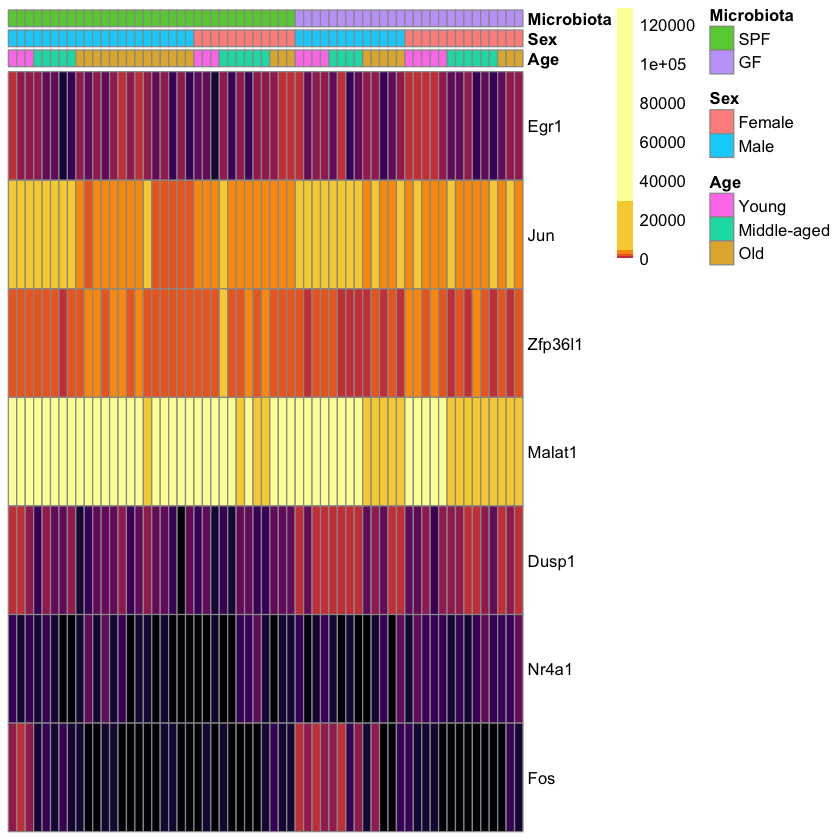

In [8]:
plot_heatmap(norm_counts,
             facs_genes,
             col_order$msa,
             annot_col$msa,
             show_rownames=TRUE)

Z-scores

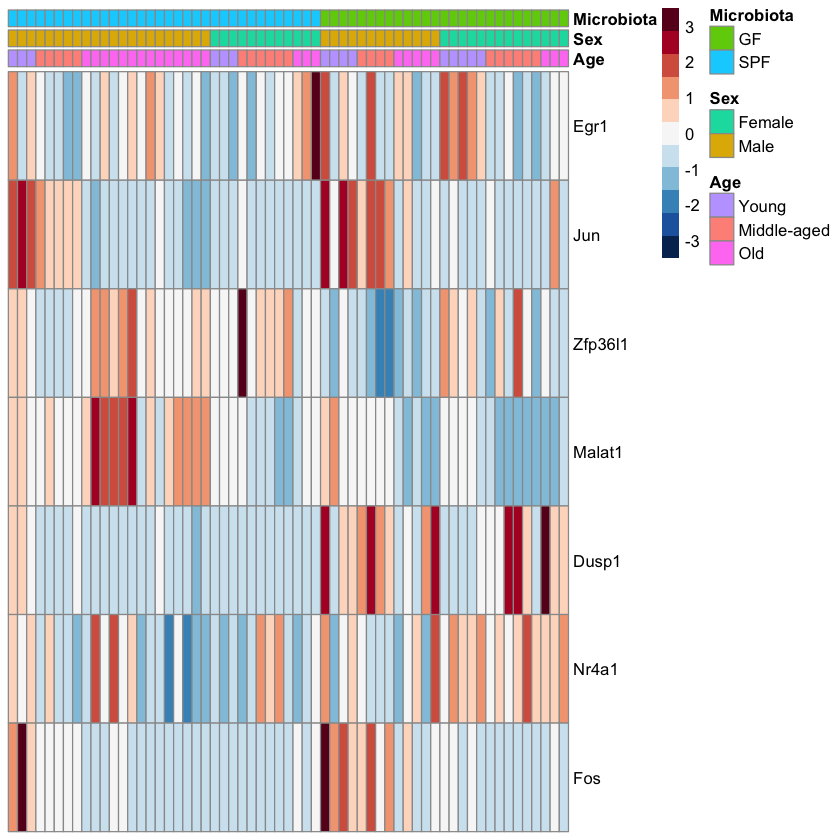

In [9]:
pheatmap(z_scores[facs_genes, col_order$msa],
         cluster_rows=F,
         cluster_cols=F,
         show_rownames=T,
         show_colnames=F,
         annotation_col=as.data.frame(annot_col$msa),
         annotation_row=NULL,
         annotation_colors=NULL,
         color=rev(brewer.pal(11, "RdBu")),
         breaks=seq(-3.5, 3.5, length=12))

## Check for contamination from other cell types that could have escaped the sorting gating

In [10]:
core_signature_genes = list()
core_signature_genes$microglia = c('Tmem119', 'Hexb', 'Scl2a5', 'P2ry12', 'Siglech', 'Trem2', 'P2ry13')
core_signature_genes$macrophage = c('Mrc1', 'Cd163', 'Lyve1', 'Siglec1', 'Pf4')
core_signature_genes$monocyte = c('Ly6c2', 'Ccr2', 'Anxa8', 'Nr4a1', 'Plac8')
core_signature_genes$dc = c('Flt3', 'Zbtb46', 'Itgae', 'Batf3', 'Clec9a')
core_signature_genes$granulocyte = c('Mpo', 'Ngp', 'Wfdc17', 'Ly6g')
core_signature_genes$t = c('Trbc1', 'Trbc2', 'Cd3e', 'Cd3d', 'Nkg7')
core_signature_genes$b= c('Cd79a', 'Igkc', 'Ighm', 'Cd19', 'Ebf1')
core_signature_genes$mast = c('Tpsb2', 'Mcpt4', 'Cma1', 'Cpa3')
core_signature_genes$nk = c('NKp46', 'NK1.1', 'NKG2D', 'Gzmb', 'Eomes', 'Tbet')
core_signature_gene_df = melt(core_signature_genes) %>%
    rename(genes = value) %>%
    rename(cell = L1)
removed_genes = core_signature_gene_df %>%
    filter(!(genes %in% rownames(z_scores)))
core_signature_gene_df = core_signature_gene_df %>%
    filter(genes %in% rownames(z_scores))
core_signature_gene_df

genes,cell
<chr>,<chr>
Tmem119,microglia
Hexb,microglia
P2ry12,microglia
Siglech,microglia
Trem2,microglia
P2ry13,microglia
Mrc1,macrophage
Cd163,macrophage
Lyve1,macrophage


Genes in list, but not in the counts

In [11]:
removed_genes

genes,cell
<chr>,<chr>
Scl2a5,microglia
Ly6g,granulocyte
Trbc1,t
Trbc2,t
Igkc,b
Ighm,b
Mcpt4,mast
Cma1,mast
NKp46,nk


Normalized counts

In [12]:
cell_annot_colors = annot_colors
cell_annot_colors$Cell = c("#56a4d0", "#d5682b", "#7b6fcb", "#a49f3d", "#c356b8", "#59a85f", "#d04659", "#b7794a", "#c0668e")
names(cell_annot_colors$Cell) = c("microglia", "macrophage", "monocyte", "dc", "granulocyte", "t", "b", "mast", "nk")

pdf 
  3

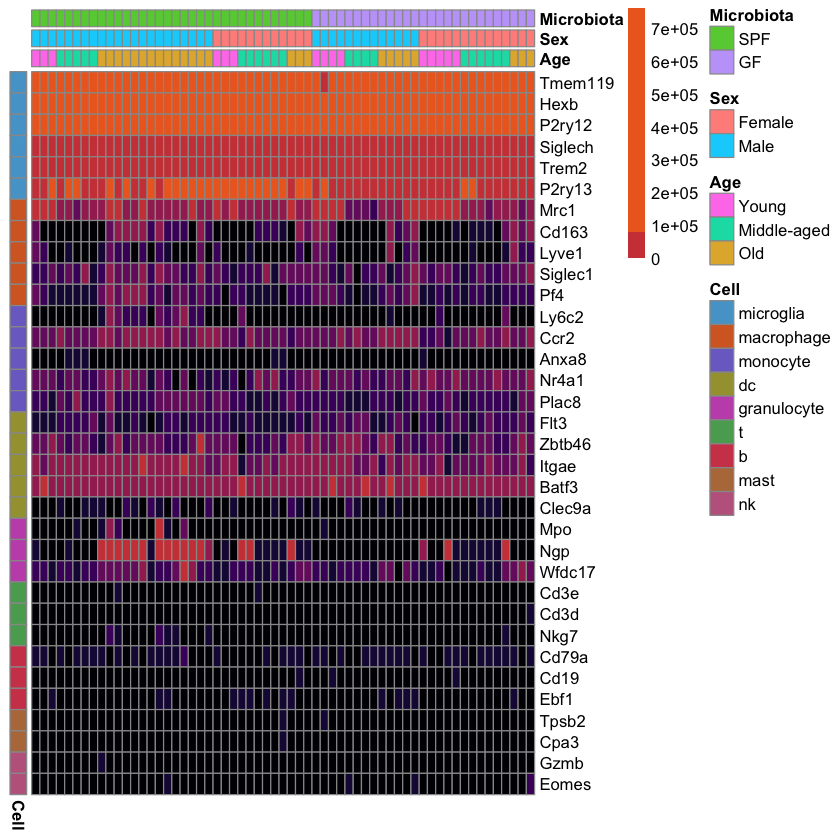

In [13]:
data = norm_counts[as.vector(core_signature_gene_df$genes), col_order$msa]
breaks = quantile_breaks(data, n = 11)
pheatmap(data,
         cluster_rows=F,
         cluster_cols=F,
         show_rownames=T,
         show_colnames=F,
         annotation_colors=cell_annot_colors,
         annotation_col=annot_col$msa,
         annotation_row=data.frame(Cell=core_signature_gene_df$cell, row.names=core_signature_gene_df$genes),
         breaks=breaks,
         color=inferno(10))
pdf('../results/dge/cell_type_gene_norm_counts.pdf')
pheatmap(data,
         cluster_rows=F,
         cluster_cols=F,
         show_rownames=T,
         show_colnames=F,
         annotation_colors=cell_annot_colors,
         annotation_col=annot_col$msa,
         annotation_row=data.frame(Cell=core_signature_gene_df$cell, row.names=core_signature_gene_df$genes),
         breaks=breaks,
         color=inferno(10))
dev.off()

Z-score

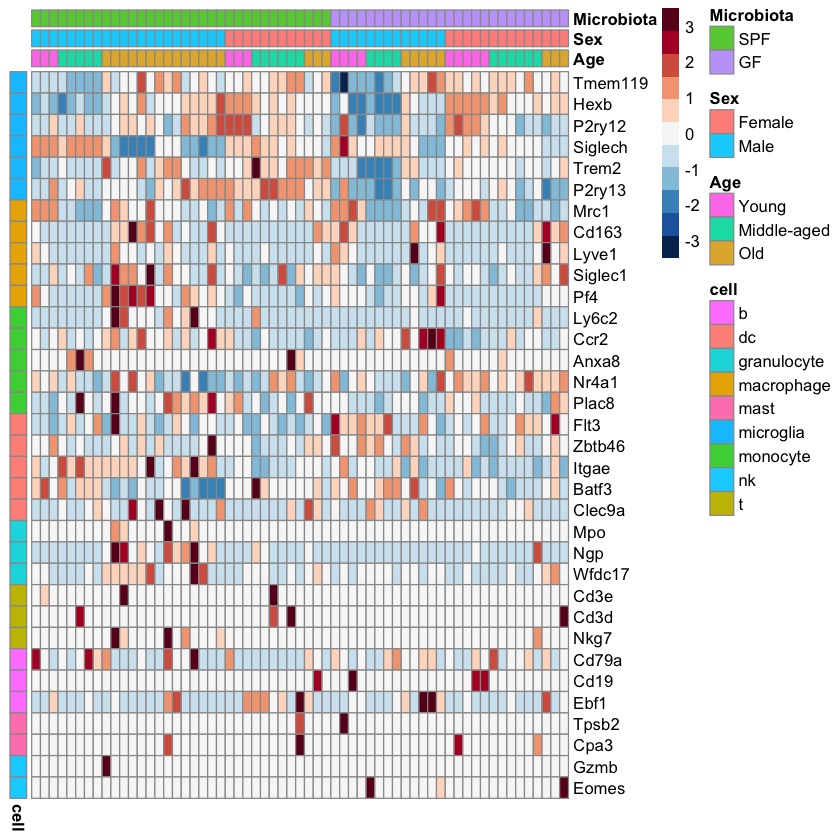

In [14]:
pheatmap(z_scores[as.vector(core_signature_gene_df$genes), col_order$msa],
         cluster_rows=F,
         cluster_cols=F,
         show_rownames=T,
         show_colnames=F,
         annotation_col=annot_col$msa,
         annotation_row=data.frame(cell=core_signature_gene_df$cell, row.names=core_signature_gene_df$genes),
         annotation_colors = cell_annot_colors,
         color=rev(brewer.pal(11, "RdBu")),
         breaks = seq(-3.5, 3.5, length=12))

# Filter contamination genes and contaminated samples

Genes that could be artefact due to FACS sorting or contamination from other cell types and samples that seem contaminated: 'GF_8w_M_2_2', 'SPF_52w_F_1_2', 'SPF_104w_M_3_2'

In [15]:
potentially_contaminated_samples = c('GF_8w_M_2_2', 'SPF_52w_F_1_2', 'SPF_104w_M_3_2')

Filter the normalized counts (value before and )

In [16]:
original_norm_counts = norm_counts
norm_counts = data.frame(norm_counts) %>%
    rownames_to_column('genes') %>%
    filter(!genes %in% facs_genes) %>%
    filter(!genes %in% core_signature_genes$macrophage) %>%
    filter(!genes %in% core_signature_genes$monocyte) %>%
    filter(!genes %in% core_signature_genes$dc) %>%
    filter(!genes %in% core_signature_genes$granulocyte) %>%
    filter(!genes %in% core_signature_genes$t) %>%
    filter(!genes %in% core_signature_genes$b) %>%
    filter(!genes %in% core_signature_genes$mast) %>%
    filter(!genes %in% core_signature_genes$nk) %>% 
    filter(!genes %in% core_signature_genes$nk) %>% 
    select(-c(GF_8w_M_2_2, SPF_52w_F_1_2, SPF_104w_M_3_2)) %>%
    filter_at(vars(-genes), any_vars(. > 0)) %>%
    column_to_rownames('genes')
dim(original_norm_counts)[1]-dim(norm_counts)[1]
save(norm_counts, file="../results/dge/filtered_norm_counts.RData")
write.table(norm_counts, "../results/dge/filtered_norm_counts", sep = "\t", quote = FALSE)

[1] 61

In [17]:
mean_counts = apply(norm_counts, 1, mean)
sd_counts = apply(norm_counts, 1, sd)
z_scores = (norm_counts - mean_counts)/sd_counts
save(z_scores, file="../results/dge/filtered_z_scores.RData")
write.table(z_scores, "../results/dge/filtered_z_scores", sep = "\t", quote = FALSE)

Filter the samples from annotations and metadata

In [18]:
for(i in 1:length(trait)){
    trait[[i]] = trait[[i]] %>%
        filter(!sample %in% potentially_contaminated_samples)
}
save(trait, file="../results/dge/trait.RData")

In [19]:
col_order = lapply(col_order, function(x) return(x[!x %in% potentially_contaminated_samples]))
annot_col = lapply(annot_col, function(x) return(x[!rownames(x) %in% potentially_contaminated_samples,]))
save(col_order, file="../results/dge/col_order.RData")
save(annot_col, file="../results/dge/annot_col.RData")

In [20]:
metadata = metadata %>%
    filter(!sample %in% potentially_contaminated_samples)
save(metadata, file="../results/dge/filtered_metadata.RData")

In [21]:
all_deg_genes = c()
save(all_deg_genes, file="../results/dge/all_deg_genes.RData")

# Sample-to-sample distance, clustering and PCA

In [22]:
sample_dist = t(norm_counts) %>% dist
sample_dist_matrix = as.matrix(sample_dist)

In [88]:
list_colors = unlist(annot_colors)
names(list_colors) = gsub("(Microbiota|Sex|Age)\\.","",names(list_colors))
colors = metadata %>%
         mutate(Microbiota = gsub("GF", list_colors['GF'], Microbiota)) %>%
         mutate(Microbiota = gsub("SPF", list_colors['SPF'], Microbiota)) %>%
         mutate(Age = gsub("Old", list_colors['Old'], Age)) %>%
         mutate(Age = gsub("Middle-aged", list_colors['Middle-aged'], Age)) %>%
         mutate(Age = gsub("Young", list_colors['Young'], Age)) %>%
         mutate(Sex = gsub("Female", list_colors['Female'], Sex)) %>%
         mutate(Sex = gsub("Male", list_colors['Male'], Sex)) %>%
         select(c("Microbiota", "Age", "Sex", "sample")) %>%
         column_to_rownames('sample')
plot_clustering_tree = function(sampleTree) {
    par(mar = c(4,4,1,1))
    par(cex = 0.6)
    plot(sampleTree, leaflab="none")
    colored_bars(colors, sampleTree, rowLabels=colnames(colors), y_shift=0.5)
    legend("topright", fill=unlist(list_colors), names(list_colors), cex=0.7)
}

## Clustering

### Ward D2

In [85]:
sample_clust = sample_dist %>% hclust(method = "ward.D2") 

pdf 
  2

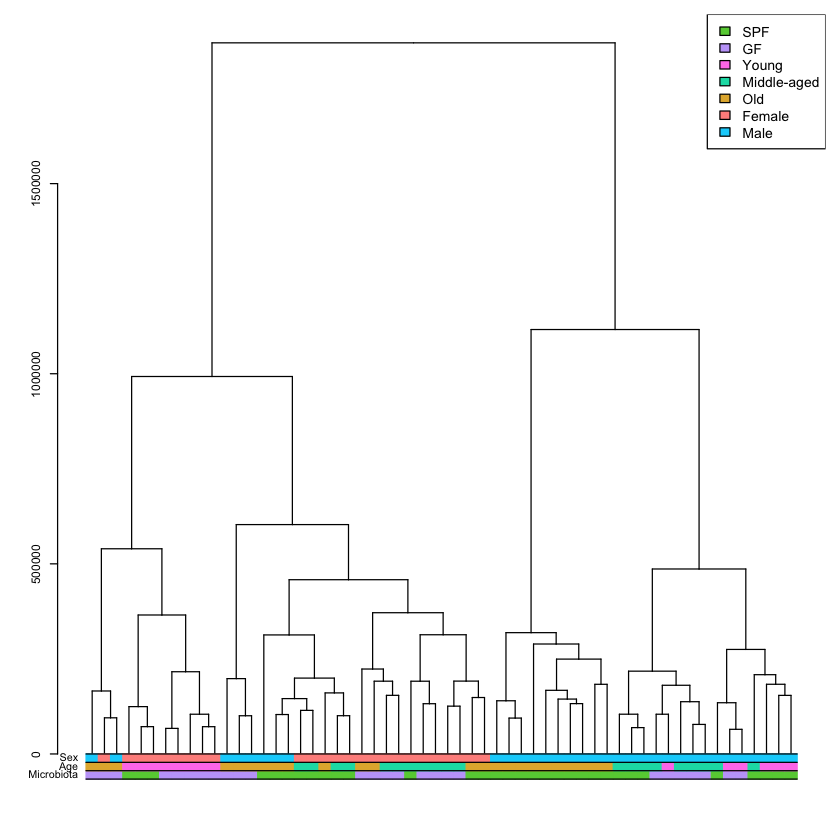

In [89]:
sample_clust_tree = sample_clust %>% as.dendrogram
plot_clustering_tree(sample_clust_tree)
pdf('../results/dge/dendogram.pdf')
plot_clustering_tree(sample_clust_tree)
dev.off()

#### Without X/Y genes

Extract genes from chrX / chrX_GL456233_random / chrY

In [27]:
annot = read.table("../data/mm10_UCSC_07_15_genes.gtf", sep="\t")
chrX_chrY_genes = annot %>% 
  filter(V1 == 'chrX' | V1 == 'chrX_GL456233_random' | V1 == 'chrY') %>%
  select(V9) %>%
  tidyr::separate(V9, into = c("v1", "gene_id", "v2", "gene_name", "v3", "p_id", "v4", "transcript_id", "v5", "tss_id"), sep = " |;") %>%
  select(gene_id) %>%
  distinct() %>%
  pull(gene_id)
length(chrX_chrY_genes)

Warning message:
“Expected 10 pieces. Additional pieces discarded in 30003 rows [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, ...].”


[1] 1120

Remove genes (number displayed) from the count table

In [28]:
chrX_chrY_counts = norm_counts %>%
    rownames_to_column('genes') %>%
    filter(genes %in% chrX_chrY_genes)
dim(chrX_chrY_counts)[1]
non_chrX_chrY_counts = norm_counts %>%
    rownames_to_column('genes') %>%
    filter(!genes %in% chrX_chrY_genes) %>%
    column_to_rownames('genes')

[1] 696

Clustering method: Ward D2

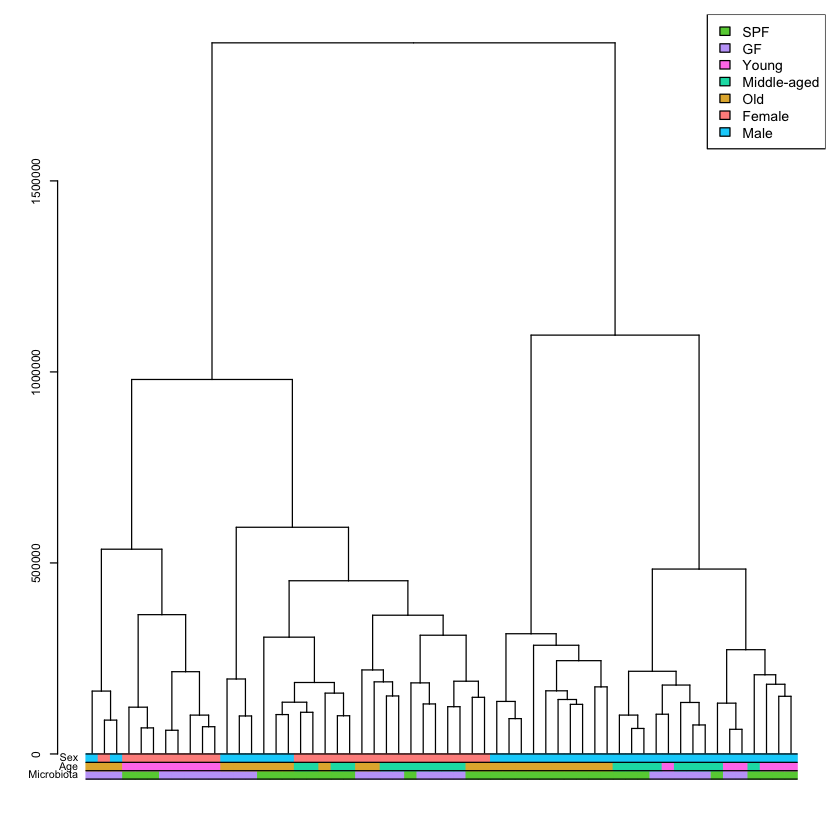

In [29]:
sampleTree = t(non_chrX_chrY_counts) %>% dist %>% hclust(method = "ward.D2") %>% as.dendrogram
plot_clustering_tree(sampleTree)

### Kmeans

Elbow method to compute the number of cluster

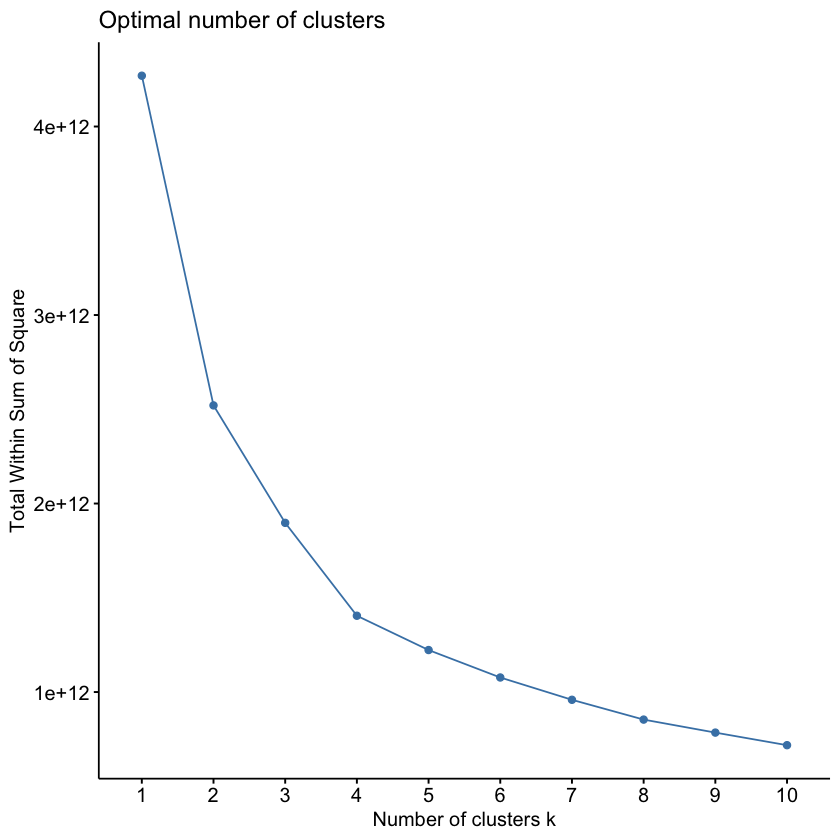

In [93]:
fviz_nbclust(t(norm_counts), diss=sample_dist, FUN=hcut, method="wss")

Average silhouette method to compute the number of cluster


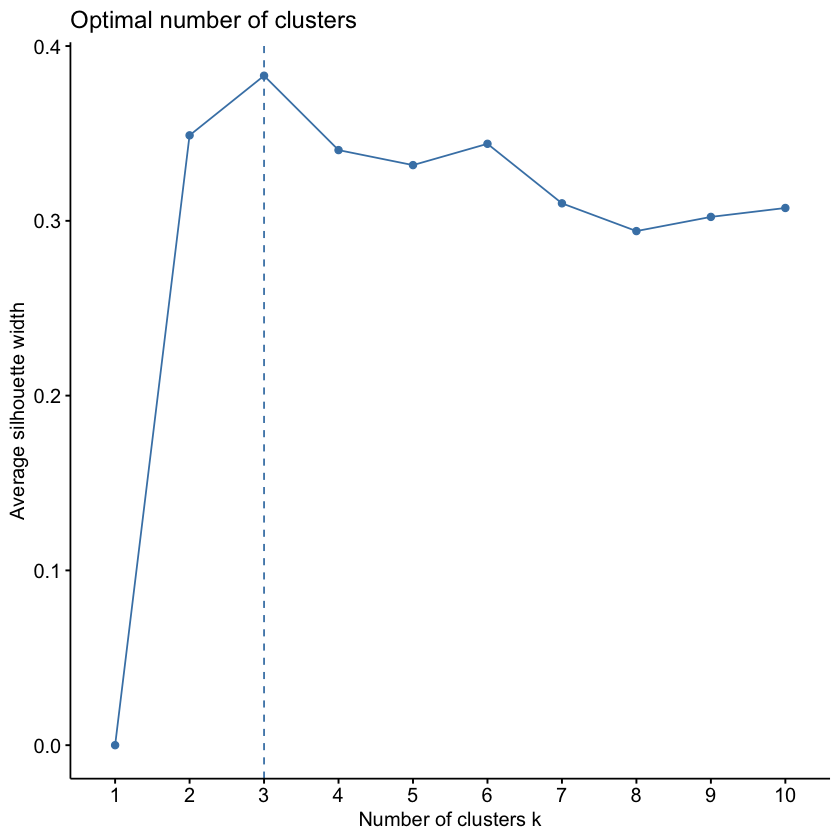

In [94]:
fviz_nbclust(t(norm_counts), diss=sample_dist, FUN=hcut, method="silhouette")

kmeans with 6 clusters

In [107]:
sample_clust_km = kmeans(sample_dist, 6)

Within cluster sum of square (*how similar each individual, within the cluster are. The smaller the number, the more similar inidivduals are*)

In [101]:
sample_clust_km$withinss

[1] 1.368396e+12 2.277964e+12 6.432472e+11 9.088193e+11 2.115729e+12
[6] 2.134578e+12

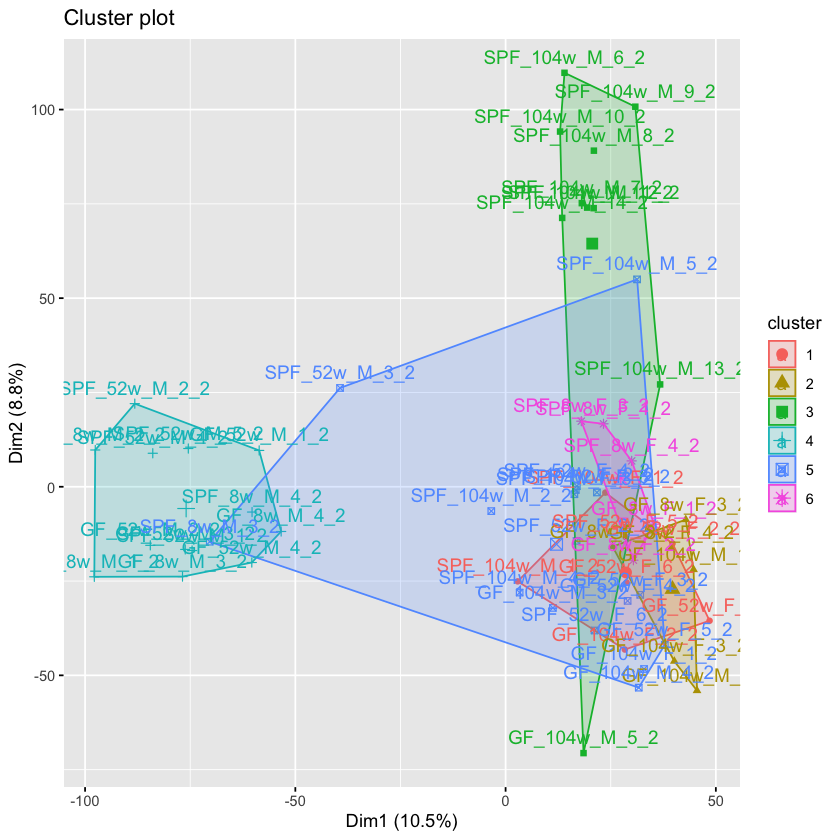

In [108]:
fviz_cluster(sample_clust_km, t(norm_counts))

In [186]:
clust_metadata = metadata %>%
    select(-project) %>%
    add_column(Cluster = as.factor(sample_clust_km$cluster)) %>%
    column_to_rownames('sample')
clust_size = count(clust_metadata, Cluster) %>%
    rename( Total = n)

In [193]:
count(clust_metadata, Cluster, Microbiota) %>% 
    spread(Microbiota, n, fill = 0) %>%
    full_join(clust_size, by='Cluster')
count(clust_metadata, Cluster, Sex) %>% 
    spread(Sex, n, fill = 0) %>%
    full_join(clust_size, by='Cluster')
count(clust_metadata, Cluster, Age) %>% 
    spread(Age, n, fill = 0) %>%
    full_join(clust_size, by='Cluster')

Cluster,GF,SPF,Total
<fct>,<dbl>,<dbl>,<int>
1,4,3,7
2,6,0,6
3,1,9,10
4,7,6,13
5,6,11,17
6,2,3,5


Cluster,Female,Male,Total
<fct>,<dbl>,<dbl>,<int>
1,6,1,7
2,4,2,6
3,0,10,10
4,0,13,13
5,10,7,17
6,5,0,5


Cluster,Middle-aged,Old,Young,Total
<fct>,<dbl>,<dbl>,<dbl>,<int>
1,4,3,0,7
2,0,3,3,6
3,0,10,0,10
4,8,0,5,13
5,8,8,1,17
6,0,0,5,5


In [206]:
count(clust_metadata, Cluster, Microbiota, Sex) %>%
    mutate(MS = paste(Microbiota, Sex, sep=' - ')) %>%
    select(-c(Microbiota, Sex)) %>%
    spread(MS, n, fill = 0) %>%
    full_join(clust_size, by='Cluster')
count(clust_metadata, Cluster, Sex, Age) %>%
    mutate(SA = paste(Sex, Age, sep=' - ')) %>%
    select(-c(Sex, Age)) %>%
    spread(SA, n, fill = 0) %>%
    full_join(clust_size, by='Cluster')
count(clust_metadata, Cluster, Age, Microbiota) %>%
    mutate(AM = paste(Age, Microbiota, sep=' - ')) %>%
    select(-c(Age, Microbiota)) %>%
    spread(AM, n, fill = 0) %>%
    full_join(clust_size, by='Cluster')

Cluster,GF - Female,GF - Male,SPF - Female,SPF - Male,Total
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
1,4,0,2,1,7
2,4,2,0,0,6
3,0,1,0,9,10
4,0,7,0,6,13
5,4,2,6,5,17
6,2,0,3,0,5


Cluster,Female - Middle-aged,Female - Old,Female - Young,Male - Middle-aged,Male - Old,Male - Young,Total
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
1,4,2,0,0,1,0,7
2,0,1,3,0,2,0,6
3,0,0,0,0,10,0,10
4,0,0,0,8,0,5,13
5,7,3,0,1,5,1,17
6,0,0,5,0,0,0,5


Cluster,Middle-aged - GF,Middle-aged - SPF,Old - GF,Old - SPF,Young - GF,Young - SPF,Total
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
1,3,1,1,2,0,0,7
2,0,0,3,0,3,0,6
3,0,0,1,9,0,0,10
4,4,4,0,0,3,2,13
5,3,5,3,5,0,1,17
6,0,0,0,0,2,3,5


In [207]:
count(clust_metadata, Cluster, Microbiota, Sex, Age) %>%
    mutate(s = paste(Sex, Age, Microbiota, sep=' - ')) %>%
    select(-c(Microbiota, Sex, Age)) %>%
    spread(s, n, fill = 0) %>%
    full_join(clust_size, by='Cluster')

Cluster,Female - Middle-aged - GF,Female - Middle-aged - SPF,Female - Old - GF,Female - Old - SPF,Female - Young - GF,Female - Young - SPF,Male - Middle-aged - GF,Male - Middle-aged - SPF,Male - Old - GF,Male - Old - SPF,Male - Young - GF,Male - Young - SPF,Total
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
1,3,1,1,1,0,0,0,0,0,1,0,0,7
2,0,0,1,0,3,0,0,0,2,0,0,0,6
3,0,0,0,0,0,0,0,0,1,9,0,0,10
4,0,0,0,0,0,0,4,4,0,0,3,2,13
5,3,4,1,2,0,0,0,1,2,3,0,1,17
6,0,0,0,0,2,3,0,0,0,0,0,0,5


## Sample-to-sample heatmap

Ward D2 clustering for the rows and cols

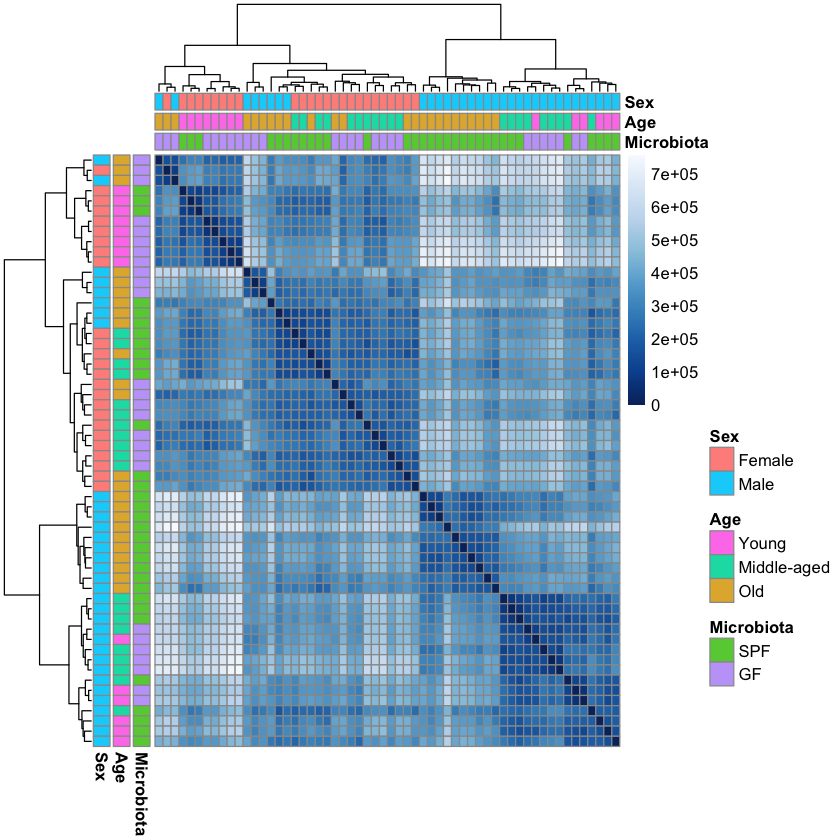

In [109]:
pheatmap(sample_dist_matrix,
         show_rownames=F,
         show_colnames=F,
         cluster_cols=sample_clust,
         cluster_rows=sample_clust,
         annotation_col=annot_col$sam,
         annotation_row=annot_col$sam,
         annotation_colors=annot_colors,
         col=colorRampPalette(rev(brewer.pal(9, "Blues")))(255))

## PCA on the normalized counts

### With all factors

In [116]:
pca_data = t(norm_counts)

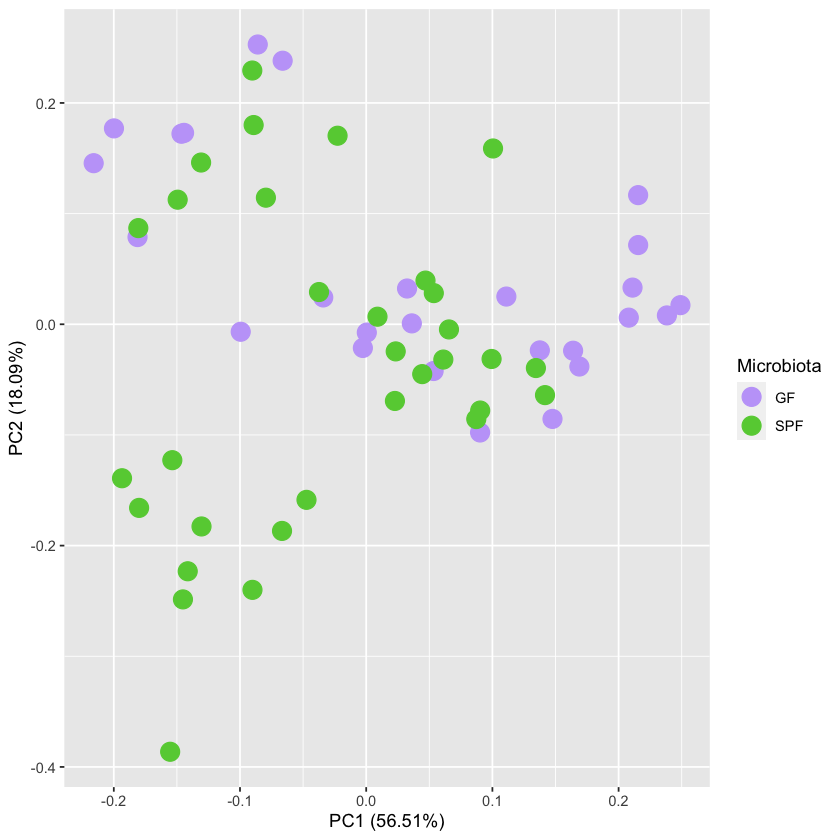

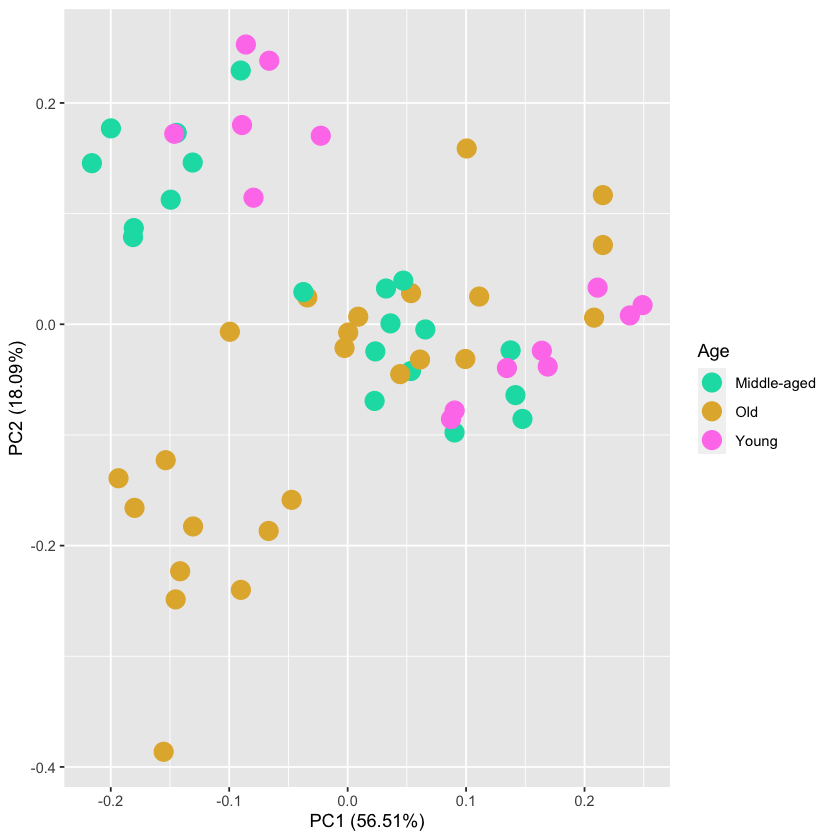

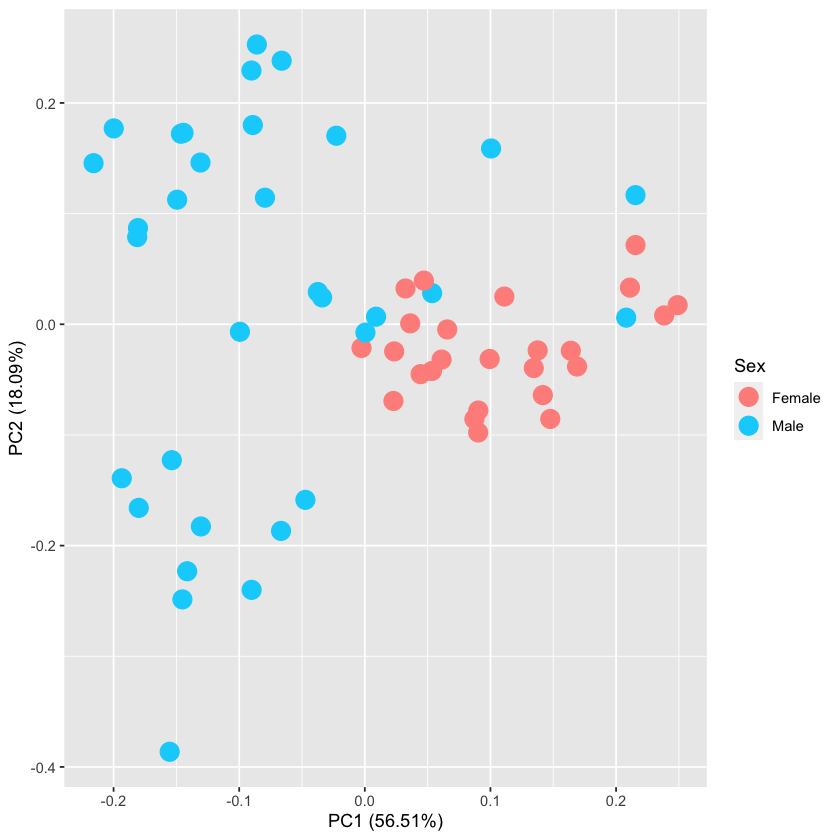

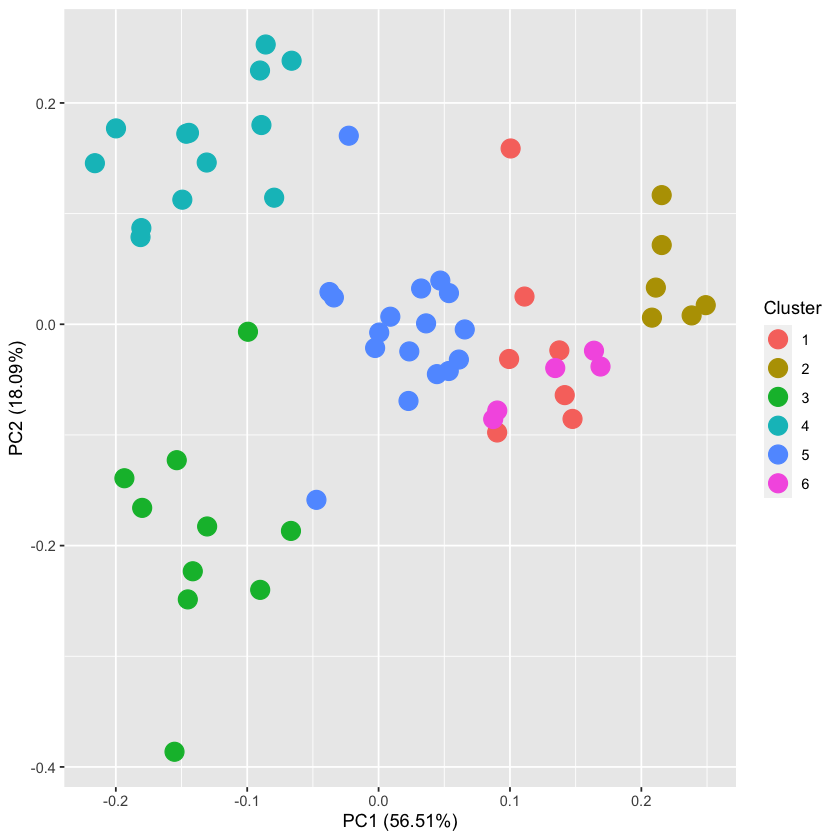

In [120]:
autoplot(prcomp(pca_data), data = clust_metadata, colour = 'Microbiota', size = 5) + 
    scale_color_manual(values = annot_colors$Microbiota)
autoplot(prcomp(pca_data), data = clust_metadata, colour = 'Age', size = 5) + 
    scale_color_manual(values = annot_colors$Age)
autoplot(prcomp(pca_data), data = clust_metadata, colour = 'Sex', size = 5) + 
    scale_color_manual(values = annot_colors$Sex)
autoplot(prcomp(pca_data), data = clust_metadata, colour = 'Cluster', size = 5)

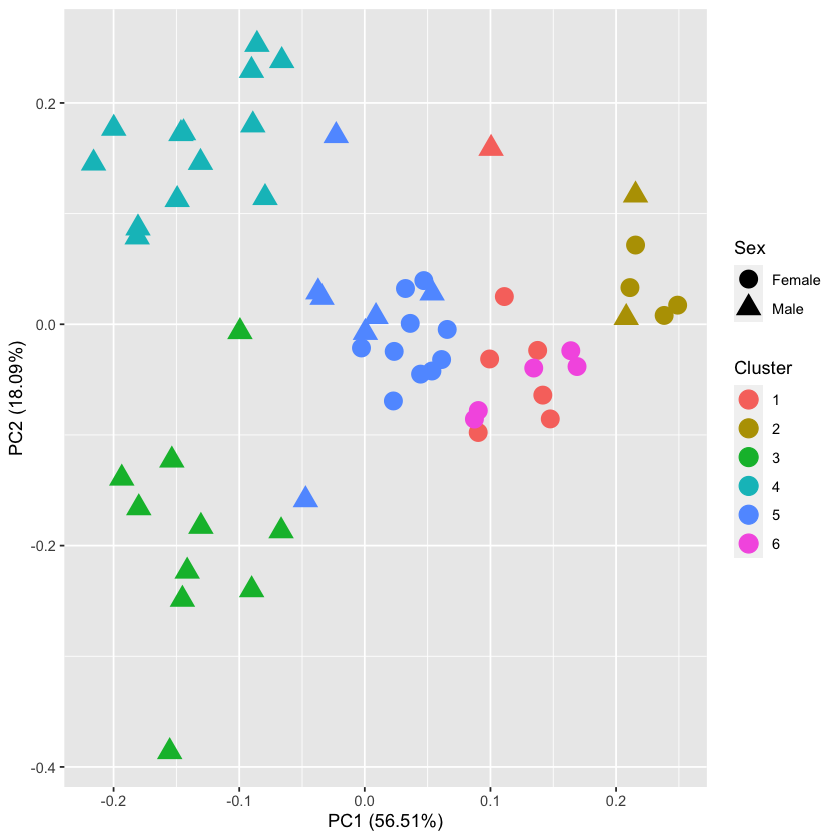

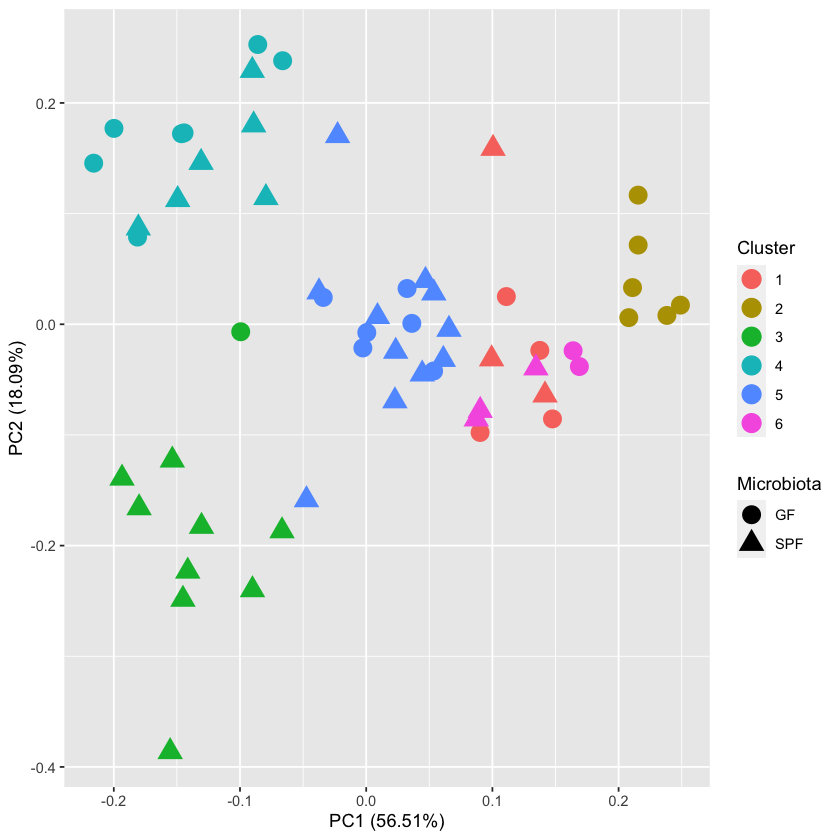

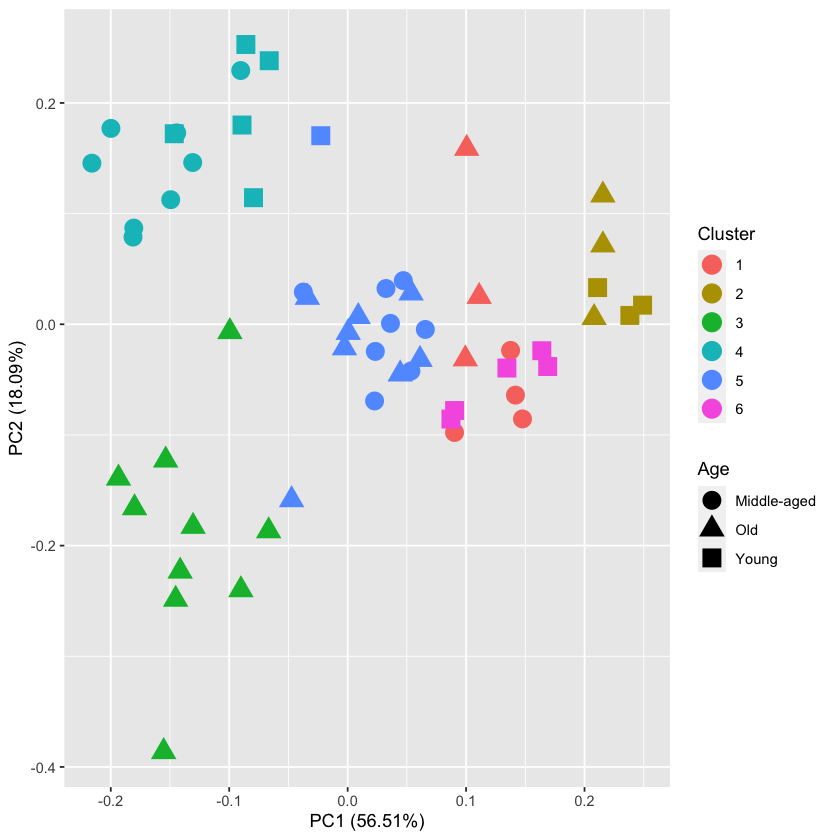

In [122]:
autoplot(prcomp(pca_data), data = clust_metadata, colour = 'Cluster', shape='Sex', size = 5)
autoplot(prcomp(pca_data), data = clust_metadata, colour = 'Cluster', shape='Microbiota', size = 5)
autoplot(prcomp(pca_data), data = clust_metadata, colour = 'Cluster', shape='Age', size = 5)

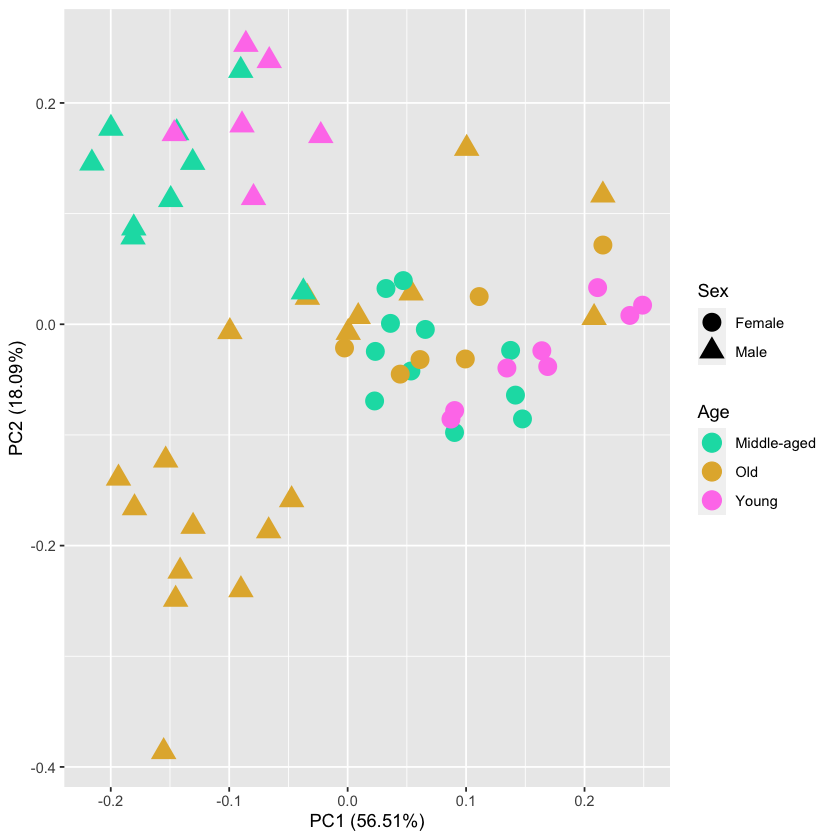

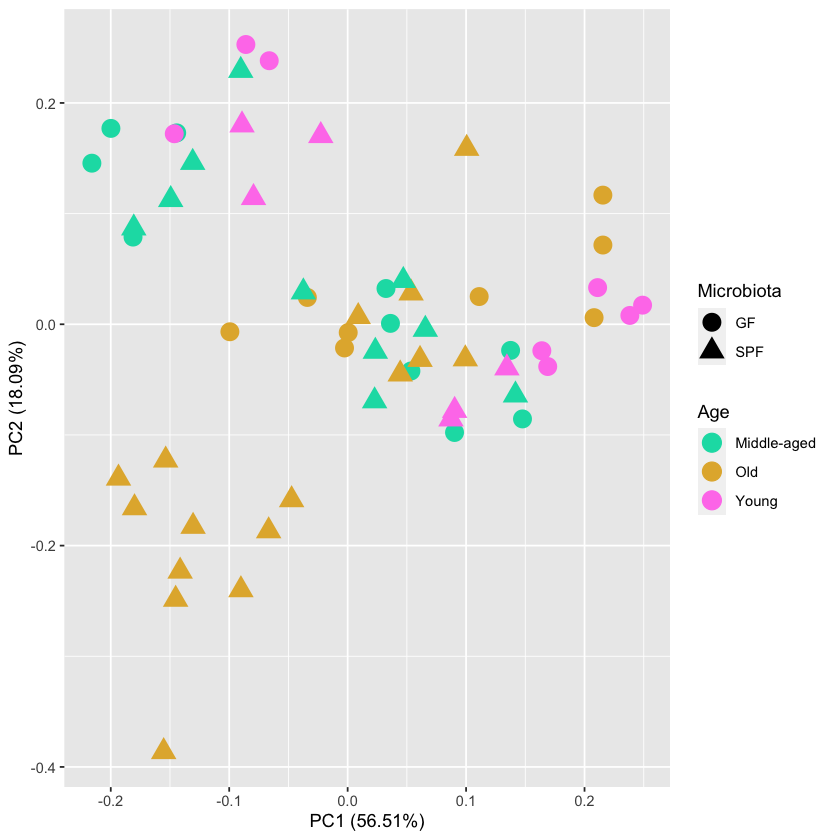

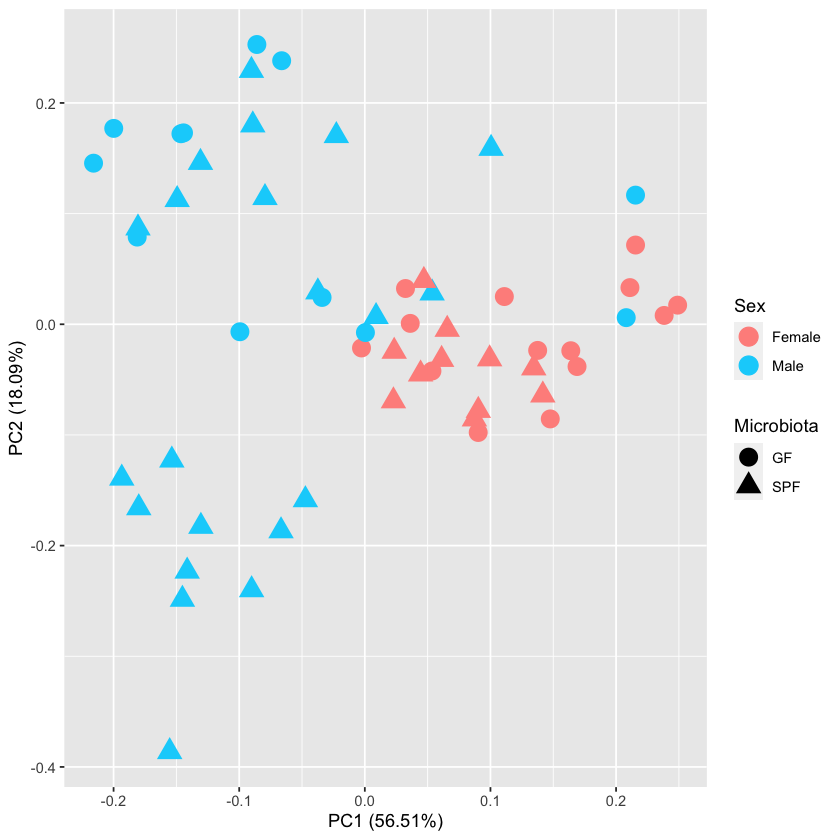

In [34]:
autoplot(prcomp(pca_data), data = clust_metadata, colour = 'Age', shape = 'Sex', size = 5) + 
    scale_color_manual(values = annot_colors$Age)
autoplot(prcomp(pca_data), data = clust_metadata, colour = 'Age', shape = 'Microbiota', size = 5) + 
    scale_color_manual(values = annot_colors$Age)
autoplot(prcomp(pca_data), data = clust_metadata, colour = 'Sex', shape = 'Microbiota', size = 5) + 
    scale_color_manual(values = annot_colors$Sex)

### SPF vs GF

In [35]:
plot_SPF_GF_PCA = function(g, a) {
    pca_metadata = metadata %>%
        filter(Sex == g & Age == a)
    pca_data = t(norm_counts)[clust_metadata$sample,]
    autoplot(prcomp(pca_data), data = clust_metadata, colour = 'Microbiota', size = 6) + 
        scale_color_manual(values = annot_colors$Microbiota)
    ggsave(paste("../results/dge/spf_gf_pca/", g, "_", a ,".pdf", sep=""))
    autoplot(prcomp(pca_data), data = clust_metadata, colour = 'Microbiota', size = 6) + 
        scale_color_manual(values = annot_colors$Microbiota)
}

Male & Young

Saving 7 x 7 in image



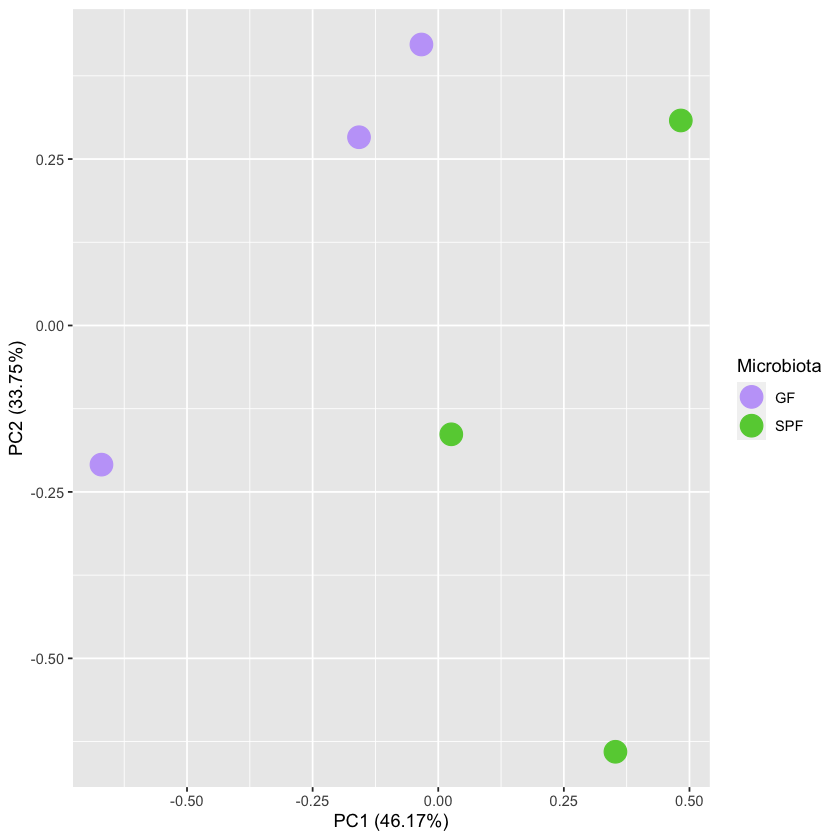

In [36]:
plot_SPF_GF_PCA('Male', 'Young')

Male &  Middle-aged

Saving 7 x 7 in image



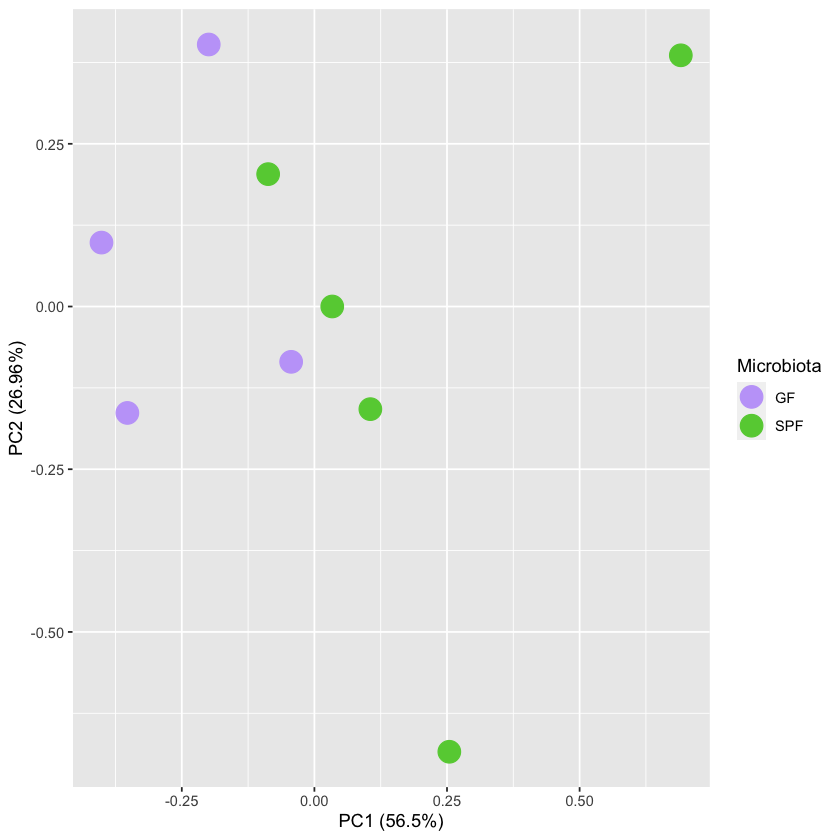

In [37]:
plot_SPF_GF_PCA('Male', 'Middle-aged')

Male & Old

Saving 7 x 7 in image



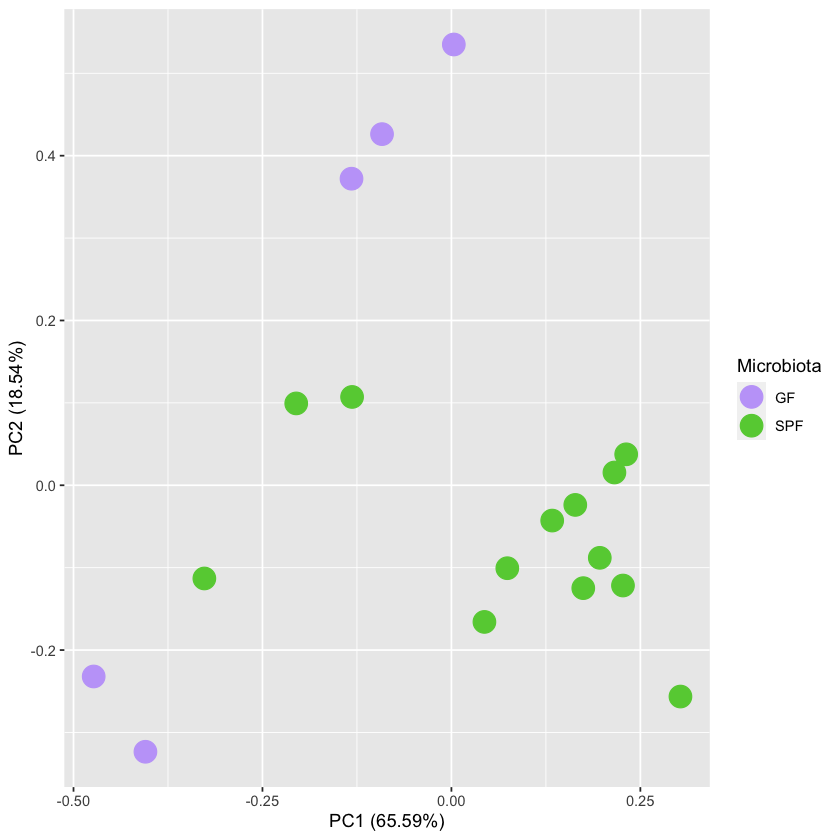

In [38]:
plot_SPF_GF_PCA('Male', 'Old')

Female & Young

Saving 7 x 7 in image



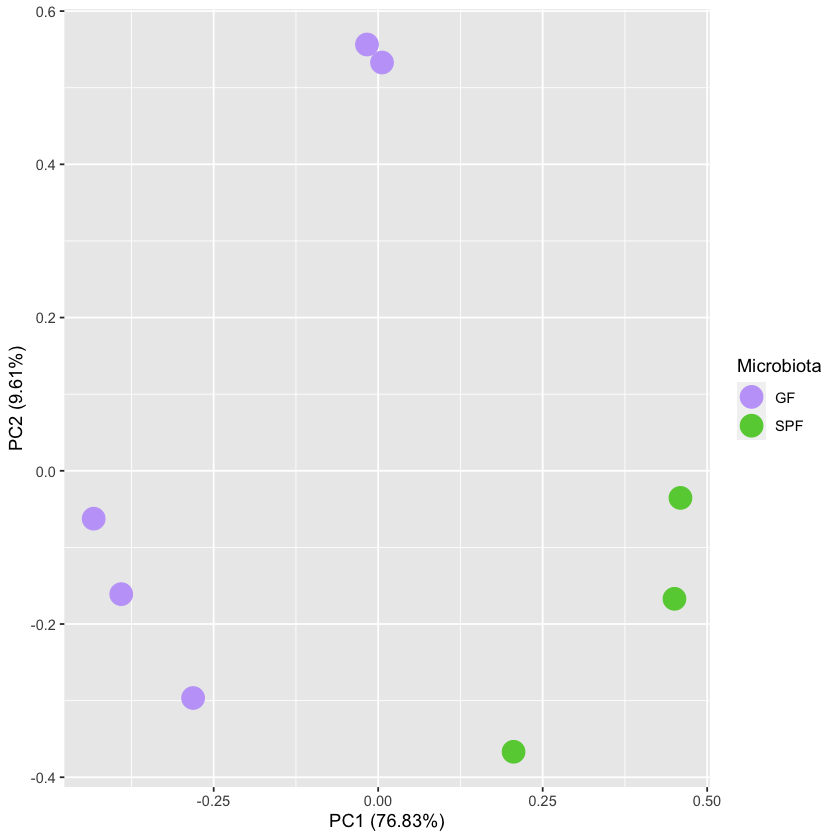

In [39]:
plot_SPF_GF_PCA('Female', 'Young')

Female & Middle-aged

Saving 7 x 7 in image



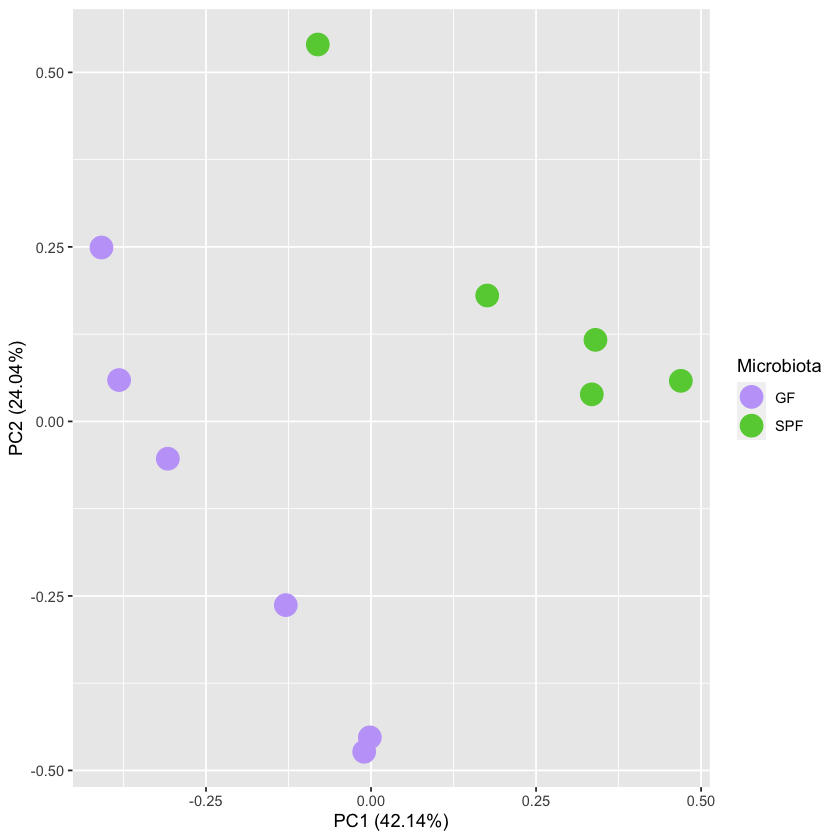

In [40]:
plot_SPF_GF_PCA('Female', 'Middle-aged')

Female & Old

Saving 7 x 7 in image



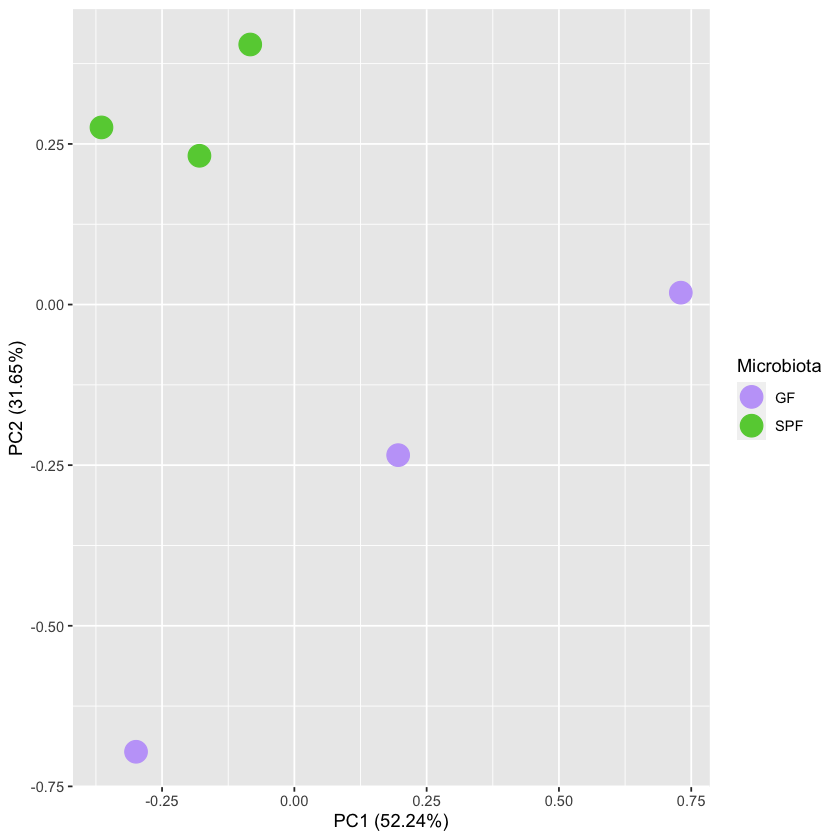

In [41]:
plot_SPF_GF_PCA('Female', 'Old')

# Z-scores (normalized counts) for all genes

## All genes

### Column order: microbiota - sex - age

pdf 
  3

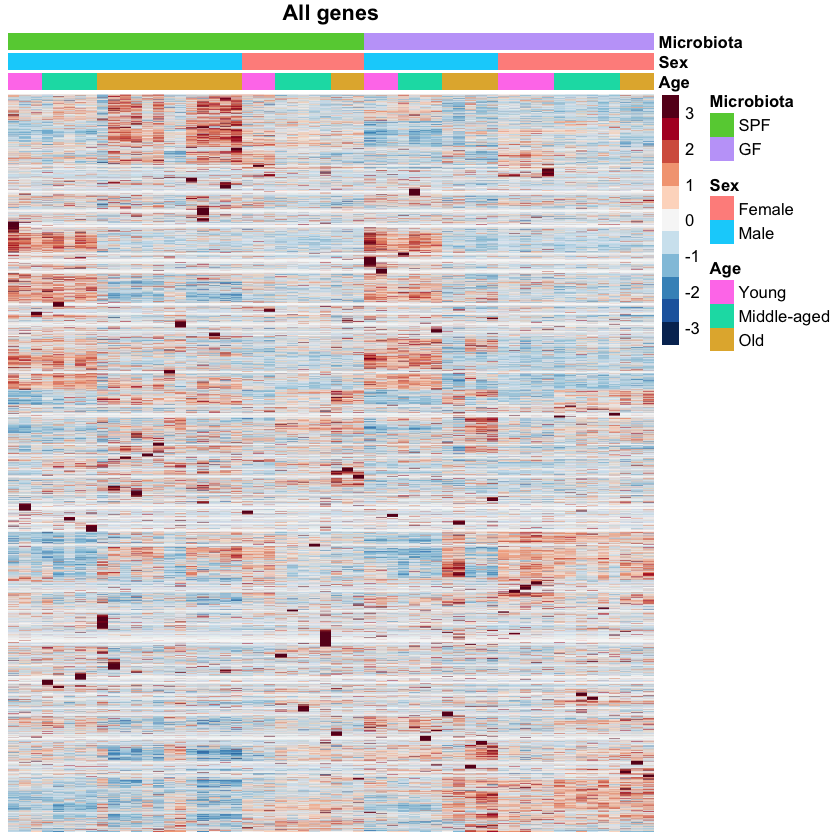

In [42]:
plot_z_score_heatmap(z_scores,
                     rownames(z_scores),
                     col_order$msa,
                     annot_col$msa,
                     "All genes",
                     col_order$msa)
pdf('../results/dge/previsualization/z_score_msa.pdf')
plot_z_score_heatmap(z_scores,
                     rownames(z_scores),
                     col_order$msa,
                     annot_col$msa,
                     "All genes",
                     col_order$msa)
dev.off()

## Subset of selected genes

### GF signature genes

In [43]:
genes = c(
    'Ero1lb', 'D16Ertd472e', 'Mcur1', 'Gpr137b-ps', 'Lonrf3', 'G530011O06Rik', 
    '1700112E06Rik', 'Ly86', 'Cd52', 'Sdc3', 'Dynlt1b', 'Tuba4a', 'Sult1a1', 
    'Notch4', 'Nnt', 'Plcd3', 'Rab4a', 'Wdfy1', 'Ctse', 'Gpr137b', 'Htra3')

Column order: microbiota - sex - age

pdf 
  3

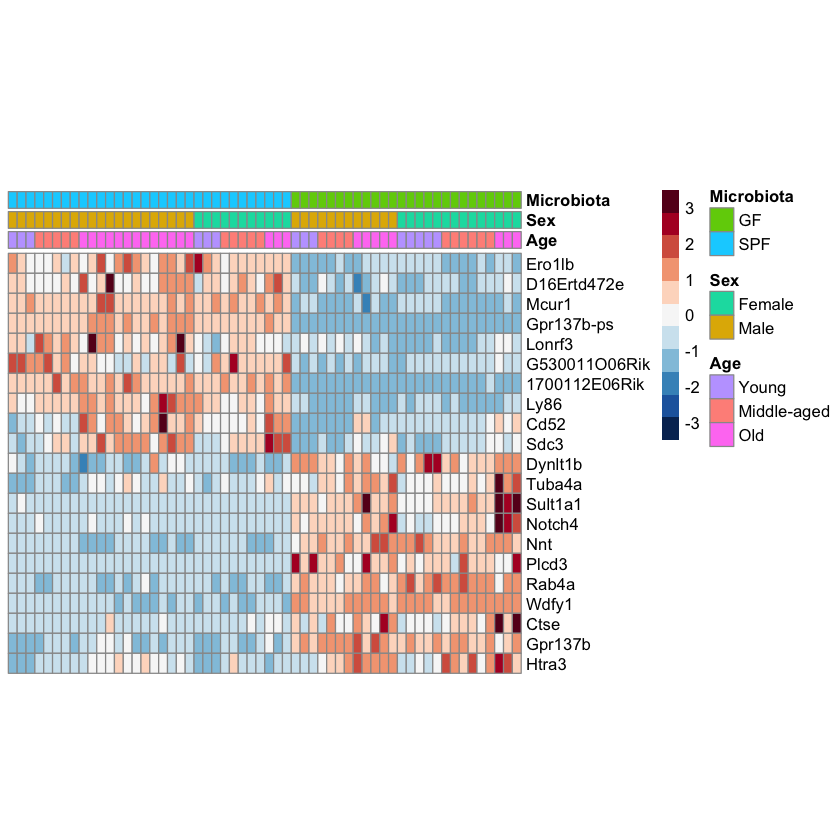

In [44]:
pheatmap(z_scores[genes,col_order$msa],
    cluster_rows=F,
    cluster_cols=F,
    show_rownames=T,
    show_colnames=F,
    annotation_col=annot_col$msa,
    annotation_row=NULL,
    annotation_colors = NULL,
    color=rev(brewer.pal(11, "RdBu")),
    breaks = seq(-3.5, 3.5, length=12),
    main ='', cellheight = 12)
pdf('../results/dge/previsualization/gf_signature_genes_z_scores.pdf')
pheatmap(z_scores[genes,col_order$msa],
    cluster_rows=F,
    cluster_cols=F,
    show_rownames=T,
    show_colnames=F,
    annotation_col=annot_col$msa,
    annotation_row=NULL,
    annotation_colors = NULL,
    color=rev(brewer.pal(11, "RdBu")),
    breaks = seq(-3.5, 3.5, length=12),
    main ='', cellheight = 12)
dev.off()

### DNA damage repair genes

In [45]:
genes = c(
    'Aen', 'Ap5z1', 'Apc', 'Ascc3', 'Atm', 'Atr', 'Bod1l', 'Ccnd1', 'Cep164', 'Chd2', 'Crebbp', 'Dclre1c', 'Ddx5', 
    'Dot1l', 'Endov', 'Ercc5', 'Fam168a', 'Fbxo5', 'Foxo3', 'Gadd45g', 'Hdac10', 'Herc2', 'Hipk2', 'Hspa1a', 'Htra2', 
    'Huwe1', 'Ino80', 'Ino80d', 'Marf1', 'Mif', 'Mlh3', 'Nfrkb', 'Nhej1', 'Parp3', 'Phf1', 'Pidd1', 'Pik3r1', 'Pms2', 
    'Polg2', 'Poli', 'Pot1b', 'Ppp1r10', 'Prkdc', 'Psme4', 'Rad9b', 'Rbbp6', 'Recql5', 'Rev1', 'Setd2', 'Smg1', 'Stk11', 
    'Stxbp4', 'Supt16', 'Taok1', 'Taok2', 'Trrap', 'Ubr5', 'Uimc1', 'Uvssa', 'Xrcc3', 'Zc3h12a', 'Zfyve26')

Column order: microbiota - sex - age

pdf 
  3

pdf 
  3

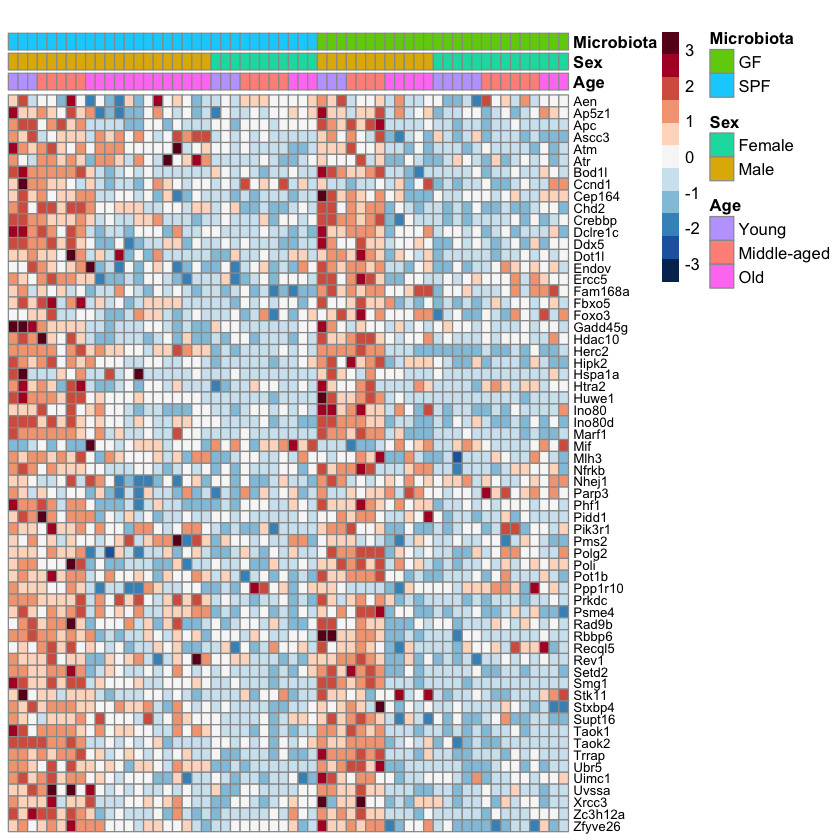

In [46]:
pheatmap(z_scores[genes,col_order$msa],
    cluster_rows=F,
    cluster_cols=F,
    show_rownames=T,
    show_colnames=F,
    annotation_col=annot_col$msa,
    annotation_row=NULL,
    annotation_colors = NULL,
    color=rev(brewer.pal(11, "RdBu")),
    breaks = seq(-3.5, 3.5, length=12),
    main ='',
    fontsize_row=8)
pdf('../results/dge/previsualization/dna_damage_repair_genes_z_scores.pdf')
pheatmap(z_scores[genes,col_order$msa],
    cluster_rows=F,
    cluster_cols=F,
    show_rownames=T,
    show_colnames=F,
    annotation_col=annot_col$msa,
    annotation_row=NULL,
    annotation_colors = NULL,
    color=rev(brewer.pal(11, "RdBu")),
    breaks = seq(-3.5, 3.5, length=12),
    main ='',
    fontsize_row=8)
dev.off()
pheatmap(z_scores[genes,col_order$msa],
    cluster_rows=F,
    cluster_cols=F,
    show_rownames=F,
    show_colnames=F,
    annotation_col=annot_col$msa,
    annotation_row=NULL,
    annotation_colors = NULL,
    color=rev(brewer.pal(11, "RdBu")),
    breaks = seq(-3.5, 3.5, length=12),
    main ='')
pdf('../results/dge/previsualization/dna_damage_repair_genes_z_scores_wo_names.pdf')
pheatmap(z_scores[genes,col_order$msa],
    cluster_rows=F,
    cluster_cols=F,
    show_rownames=F,
    show_colnames=F,
    annotation_col=annot_col$msa,
    annotation_row=NULL,
    annotation_colors = NULL,
    color=rev(brewer.pal(11, "RdBu")),
    breaks = seq(-3.5, 3.5, length=12),
    main ='')
dev.off()

# Gene co-expression analysis

Weighted gene co-expression network analysis using WGCNA package

## Extract modules of co-expressed genes

Keep only genes that have a count >= 10 in more than 90% of the samples (number removed / kept displayed)

In [47]:
filtered_norm_counts = data.frame(original_norm_counts) %>%
    rownames_to_column('genes') %>%
    mutate(rowsum = rowSums(select(., -genes) >= 10)) %>%
    filter(rowsum >= 0.9*dim(original_norm_counts)[2]) %>%
    select(-rowsum) %>%
    filter(!genes %in% facs_genes) %>%
    filter(!genes %in% core_signature_genes$macrophage) %>%
    filter(!genes %in% core_signature_genes$monocyte) %>%
    filter(!genes %in% core_signature_genes$dc) %>%
    #filter(!genes %in% core_signature_genes$granulocyte) %>%
    filter(!genes %in% core_signature_genes$t) %>%
    filter(!genes %in% core_signature_genes$b) %>%
    filter(!genes %in% core_signature_genes$mast) %>%
    filter(!genes %in% core_signature_genes$nk) %>% 
    filter(!genes %in% c('Calm1')) %>% 
    select(-c(GF_8w_M_2_2, SPF_52w_F_1_2, SPF_104w_M_3_2)) %>%
    column_to_rownames('genes')
dim(original_norm_counts)[1] - dim(filtered_norm_counts)[1]
dim(filtered_norm_counts)[1]

[1] 9417

[1] 10277

In [48]:
#filtered_norm_counts = data.frame(norm_counts) %>%
#    rownames_to_column('genes') %>%
#    mutate(rowsum = rowSums(select(., -genes) >= 10)) %>%
#    filter(rowsum >= 0.9*dim(original_norm_counts)[2]) %>%
#    select(-rowsum) %>%
#    #filter(!genes %in% facs_genes) %>%
#    #filter(!genes %in% core_signature_genes$macrophage) %>%
#    #filter(!genes %in% core_signature_genes$monocyte) %>%
#    #filter(!genes %in% core_signature_genes$dc) %>%
#    #filter(!genes %in% core_signature_genes$granulocyte) %>%
#    #filter(!genes %in% core_signature_genes$t) %>%
#    #filter(!genes %in% core_signature_genes$b) %>%
#    #filter(!genes %in% core_signature_genes$mast) %>%
#    #filter(!genes %in% core_signature_genes$nk) %>% 
#    filter(!genes %in% c('Calm1')) %>% 
#    #select(-c(GF_8w_M_2_2, SPF_52w_F_1_2, SPF_104w_M_3_2)) %>%
#    column_to_rownames('genes')
#dim(original_norm_counts)[1] - dim(filtered_norm_counts)[1]
#dim(filtered_norm_counts)[1]
dim(filtered_norm_counts)

[1] 10277    58

Analysis of scale free topology for multiple soft thresholding powers, with signed hybrid network type

pickSoftThreshold: will use block size 4353.
 pickSoftThreshold: calculating connectivity for given powers...
   ..working on genes 1 through 4353 of 10277
   ..working on genes 4354 through 8706 of 10277
   ..working on genes 8707 through 10277 of 10277
   Power SFT.R.sq  slope truncated.R.sq  mean.k. median.k. max.k.
1      1    0.116  0.852          0.943 1040.000  1.04e+03 1630.0
2      2    0.353 -1.100          0.941  336.000  3.18e+02  821.0
3      3    0.664 -1.650          0.978  136.000  1.17e+02  496.0
4      4    0.769 -1.920          0.983   64.300  4.86e+01  332.0
5      5    0.806 -2.060          0.979   33.700  2.18e+01  238.0
6      6    0.813 -2.140          0.969   19.100  1.04e+01  178.0
7      7    0.817 -2.190          0.965   11.600  5.21e+00  137.0
8      8    0.842 -2.150          0.975    7.330  2.71e+00  108.0
9      9    0.864 -2.100          0.983    4.840  1.47e+00   87.5
10    10    0.876 -2.060          0.986    3.310  8.04e-01   71.6
11    12    0.897 -

Power,SFT.R.sq,slope,truncated.R.sq,mean.k.,median.k.,max.k.
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.1160946,0.8516606,0.9432081,1043.2319743,1.039858e+03,1631.43013
2,0.3534325,-1.0957144,0.9406479,335.8136383,3.181957e+02,820.65787
3,0.6637248,-1.6460594,0.9780977,136.3881967,1.174060e+02,496.21168
4,0.7685466,-1.9220353,0.9832291,64.3190708,4.862867e+01,332.43621
5,0.8057060,-2.0564238,0.9792358,33.7188688,2.180012e+01,237.66372
6,0.8134695,-2.1404068,0.9685734,19.1364860,1.041504e+01,177.64476
7,0.8167563,-2.1947647,0.9653164,11.5523699,5.214321e+00,137.13604
8,0.8422749,-2.1489288,0.9752509,7.3273056,2.709162e+00,108.47588
9,0.8638155,-2.1041594,0.9828091,4.8391956,1.465842e+00,87.45249


,Power,mean.k.
,<dbl>,<dbl>
5,5,33.7188688
6,6,19.1364860
7,7,11.5523699
8,8,7.3273056
9,9,4.8391956
10,10,3.3053452
11,12,1.6724937
12,14,0.9211628
13,16,0.5414904


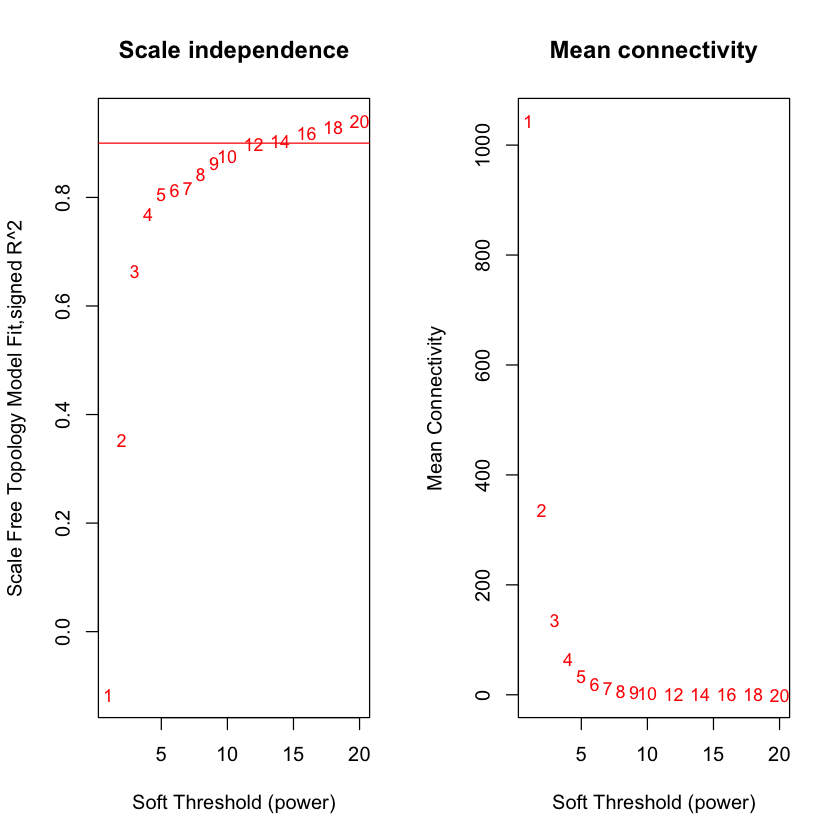

In [49]:
networkType = "signed hybrid"
powers = c(seq(1, 10, by = 1), seq(12, 20, by = 2))
# Choosing the soft-thresholding power
sft = pickSoftThreshold(t(filtered_norm_counts),
                        powerVector = powers,
                        dataIsExpr = T,
                        RsquaredCut = 0.85,
                        verbose = 5,
                        networkType = "signed hybrid")
par(mfrow = c(1,2))
cex1 = 0.9
# Scale-free topology fit index as a function of the soft-thresholding power
plot(sft$fitIndices[,1],
     -sign(sft$fitIndices[,3])*sft$fitIndices[,2],
     xlab="Soft Threshold (power)",
     ylab="Scale Free Topology Model Fit,signed R^2",
     type="n",
     main = paste("Scale independence"))
text(sft$fitIndices[,1],
     -sign(sft$fitIndices[,3])*sft$fitIndices[,2],
     labels=powers,
     cex=cex1,
     col="red");
# this line corresponds to using an R^2 cut-off of h
abline(h=0.90,col="red")
# Mean connectivity as a function of the soft-thresholding power
plot(sft$fitIndices[,1],
     sft$fitIndices[,5],
     xlab="Soft Threshold (power)",
     ylab="Mean Connectivity",
     type="n",
     main = paste("Mean connectivity"))
text(sft$fitIndices[,1], sft$fitIndices[,5], labels=powers, cex=cex1,col="red")
sft$fitIndices
sft$fitIndices[(-sign(sft$fitIndices[,3])*sft$fitIndices[,2])>=0.8,c(1,5)]

Block-wise network construction and module detection
- Soft-thresholding power parameter: 6 (R2 > 0.80 and mean connectivity highest as possible (Ref: https://www.degruyter.com/view/j/sagmb.2005.4.issue-1/sagmb.2005.4.1.1128/sagmb.2005.4.1.1128.pdf))
- Minimum module size: 65
- Height for module merging: 0.35 (below)
- Biweight Midcorrelation

In [50]:
soft_thresholding_power = 6
min_module_size = 65
mergeCutHeight = 0.35
# Block-wise network construction and module detection
bwnet = blockwiseModules(t(filtered_norm_counts),
                 checkMissingData = TRUE,
                 maxBlockSize = 11000,
                 power = soft_thresholding_power,
                 networkType = networkType,
                 TOMType = "signed",
                 numericLabels = TRUE,
                 saveTOMs = TRUE,
                 saveTOMFileBase = "norm_genes_TOM",
                 mergeCutHeight = mergeCutHeight, 
                 verbose=3,
                 corType="bicor",
                 maxPOutliers=0,
                 minModuleSize = min_module_size,
                 reassignThreshold = 0,
                 deepSplit = 2)

 Calculating module eigengenes block-wise from all genes
   Flagging genes and samples with too many missing values...
    ..step 1
 ..Working on block 1 .
    TOM calculation: adjacency..
    ..will use 4 parallel threads.
     Fraction of slow calculations: 0.000000
    ..connectivity..
    ..matrix multiplication (system BLAS)..
    ..normalization..
    ..done.
   ..saving TOM for block 1 into file norm_genes_TOM-block.1.RData
 ....clustering..
 ....detecting modules..
 ....calculating module eigengenes..
 ....checking kME in modules..
     ..removing 45 genes from module 1 because their KME is too low.
     ..removing 27 genes from module 2 because their KME is too low.
     ..removing 19 genes from module 3 because their KME is too low.
     ..removing 7 genes from module 4 because their KME is too low.
     ..removing 1 genes from module 5 because their KME is too low.
     ..removing 2 genes from module 6 because their KME is too low.
     ..removing 4 genes from module 7 becau

Size of the modules (ME0: genes not assigned to a module) and number of genes in modules

In [51]:
# Modules
mod_sizes = table(bwnet$colors)
names(mod_sizes) = paste("ME", names(mod_sizes), sep="")
mod_sizes
module_nb = dim(table(bwnet$colors))-1
# Get genes that are in one module
mod_genes = rownames(filtered_norm_counts)[bwnet$colors>0]

 ME0  ME1  ME2  ME3  ME4  ME5  ME6  ME7  ME8  ME9 
2719 1627 1240 1221 1123  925  467  467  371  117 

Dendrogram and the module colors underneath the block

pdf 
  2

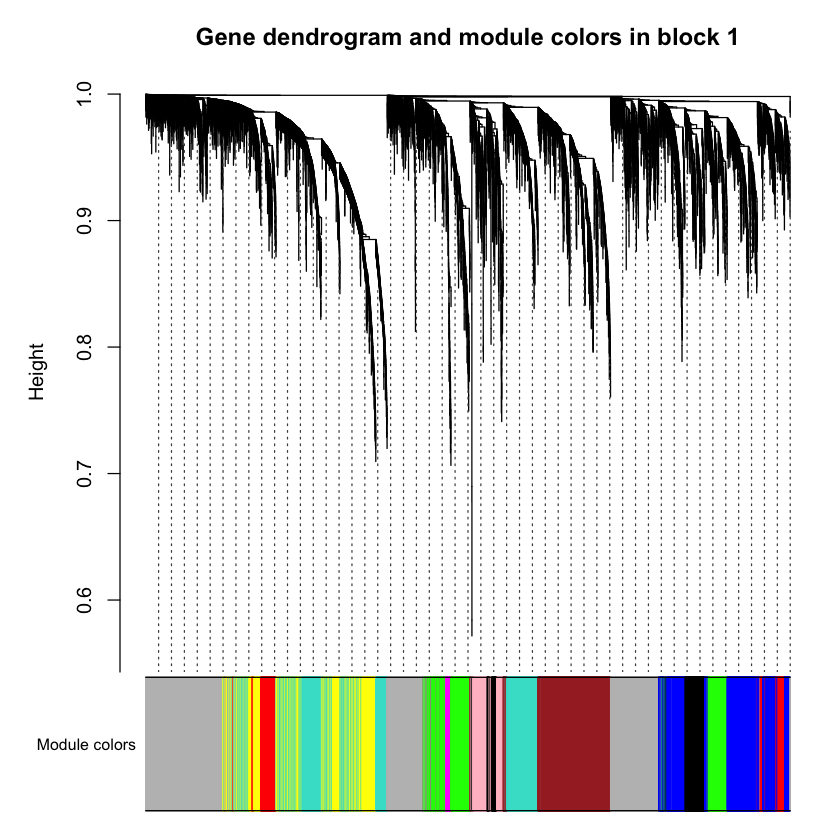

In [52]:
bwModuleColors = labels2colors(bwnet$colors)
plotDendroAndColors(bwnet$dendrograms[[1]],
                    bwModuleColors[bwnet$blockGenes[[1]]],
                    "Module colors",
                    main = "Gene dendrogram and module colors in block 1",
                    dendroLabels = FALSE,
                    hang = 0.03,
                    addGuide = TRUE,
                    guideHang = 0.05)
pdf("../results/dge/modules/gene_dendogram_module_colors.pdf")
plotDendroAndColors(bwnet$dendrograms[[1]],
                    bwModuleColors[bwnet$blockGenes[[1]]],
                    "Module colors",
                    main = "Gene dendrogram and module colors in block 1",
                    dendroLabels = FALSE,
                    hang = 0.03,
                    addGuide = TRUE,
                    guideHang = 0.05)
dev.off()

Associate module color to genes

In [53]:
gene_colors = bwnet$colors
names(gene_colors) = rownames(filtered_norm_counts)
head(gene_colors)

0610007P14Rik 0610009B22Rik 0610009L18Rik 0610009O20Rik 0610010F05Rik 
            5             5             0             6             0 
0610010K14Rik 
            5

Recalculate MEs with color labels

In [54]:
MEs = moduleEigengenes(t(filtered_norm_counts), gene_colors)$eigengenes

Extract the palette for next plots

In [55]:
pal2 = labels2colors(sort(unique(bwnet$colors)))
names(pal2) = names(mod_sizes)
pal2
save(pal2, file = "../results/dge/dge_net_pal2.RData")

ME0         ME1         ME2         ME3         ME4         ME5 
     "grey" "turquoise"      "blue"     "brown"    "yellow"     "green" 
        ME6         ME7         ME8         ME9 
      "red"     "black"      "pink"   "magenta"

## Relationship between modules and samples

Module-trait correlation analysis between the module eigengene (ME) and the different trait (combination of Microbiota, age and sex)
- correlation of Pearson between each pair of variables
- Student asymptotic p-values for the correlations

In [56]:
head(MEs)
head(trait[['Age / Microbiota / Sex']])
c = cor(MEs, trait[['Age / Microbiota / Sex']] %>% select(-c(sample)), use = "p")
head(c)

,ME0,ME1,ME2,ME3,ME4,ME5,ME6,ME7,ME8,ME9
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
GF_104w_F_1_2,0.05628294,-0.15484098,0.24580761,-0.05146022,-0.03773412,0.1487267,0.001799287,0.10250437,-0.08009466,0.17194013
GF_104w_F_2_2,-0.01131610,-0.15544628,0.18694173,-0.04086877,-0.02657179,0.1285656,0.001460554,0.05570285,-0.08204890,0.03501303
GF_104w_F_3_2,-0.01916005,-0.16952548,0.22087210,-0.03977326,-0.04249419,0.2615200,-0.048604220,0.10491770,-0.02830703,0.17742336
GF_104w_M_1_2,-0.10518342,-0.14685257,0.09100536,0.04528510,-0.07699816,0.2489430,-0.109431566,0.07330849,-0.01047623,0.11103972
GF_104w_M_2_2,-0.08524261,-0.20852637,0.20740756,-0.03923631,-0.03795286,0.3546826,-0.090556839,0.06341630,-0.06267479,0.19417460
GF_104w_M_3_2,0.26432465,-0.05375806,0.11632265,-0.03499886,-0.05315761,-0.1751008,0.210900580,0.13661031,-0.04028146,-0.18311995


sample,Young / SPF / Male,Young / SPF / Female,Young / GF / Male,Young / GF / Female,Middle-aged / SPF / Male,Middle-aged / SPF / Female,Middle-aged / GF / Male,Middle-aged / GF / Female,Old / SPF / Male,Old / SPF / Female,Old / GF / Male,Old / GF / Female
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
GF_104w_F_1_2,0,0,0,0,0,0,0,0,0,0,0,1
GF_104w_F_2_2,0,0,0,0,0,0,0,0,0,0,0,1
GF_104w_F_3_2,0,0,0,0,0,0,0,0,0,0,0,1
GF_104w_M_1_2,0,0,0,0,0,0,0,0,0,0,1,0
GF_104w_M_2_2,0,0,0,0,0,0,0,0,0,0,1,0
GF_104w_M_3_2,0,0,0,0,0,0,0,0,0,0,1,0


,Young / SPF / Male,Young / SPF / Female,Young / GF / Male,Young / GF / Female,Middle-aged / SPF / Male,Middle-aged / SPF / Female,Middle-aged / GF / Male,Middle-aged / GF / Female,Old / SPF / Male,Old / SPF / Female,Old / GF / Male,Old / GF / Female
ME0,-0.2267303,-0.33425765,-0.02070888,-0.4334783,-0.06239905,0.24833823,0.10313044,0.08745041,-0.009537167,0.25005209,0.32333113,0.01530051
ME1,0.2444567,-0.05147813,0.21252423,-0.2385979,0.33940561,-0.21373138,0.29513458,-0.37536960,0.392059078,-0.10840018,-0.33871084,-0.28447480
ME2,-0.1107945,-0.07434626,0.01312926,0.1756570,-0.24897784,0.02357208,-0.03498967,0.35254655,-0.587033526,-0.02985687,0.42451098,0.38752374
ME3,-0.2432377,0.17729366,-0.33148537,0.2024006,-0.31676621,-0.01390937,-0.34189544,0.07365013,0.564464845,-0.04514973,-0.07060893,-0.07832172
ME4,0.3959442,-0.14002887,0.40735863,-0.1778602,0.46755929,-0.15742481,0.41011754,-0.16627167,-0.407676082,-0.09449454,-0.11525209,-0.06332041
ME5,-0.1430446,0.17595879,-0.09674862,0.3796193,-0.34483042,-0.10883820,-0.30665340,0.19281946,-0.035916924,-0.10936952,0.07964452,0.31945486


In [57]:
plot_module_groups = function(trait, vertsep){
    trait = trait %>% select(-c(sample))
    # Calculate correlation
    moduleTraitCor = cor(MEs, trait, use = "p")
    moduleTraitPvalue = corPvalueStudent(moduleTraitCor, dim(filtered_norm_counts)[2])
    # Will display correlations and their p-values
    textMatrix = paste(signif(moduleTraitCor, 2), "\n(",signif(moduleTraitPvalue, 1), ")", sep = "")
    dim(textMatrix) = dim(moduleTraitCor)
    # Plot correlation
    par(mar = c(6, 8.5, 3, 3))
    labeledHeatmap(Matrix = moduleTraitCor,
                    xLabels = colnames(trait),
                    ySymbols = paste(names(mod_sizes), " \n(", mod_sizes, " genes)", sep = ""),
                    yLabels = paste('ME', pal2, sep=''),
                    colorLabels = FALSE,
                    yColorLabels = TRUE,
                    colors = rev(brewer.pal(11, "RdBu")),
                    textMatrix = textMatrix,
                    setStdMargins = FALSE,
                    cex.text = 0.5,
                    cex.lab.y = .75,
                    zlim = c(-1,1),
                    verticalSeparator.x = vertsep)
}

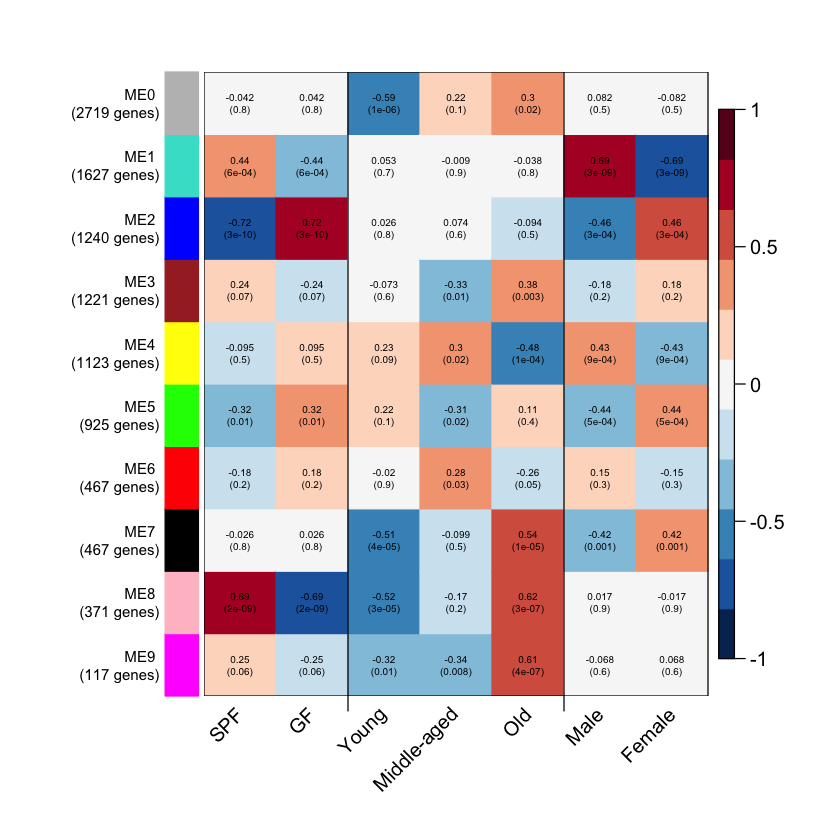

In [58]:
plot_module_groups(trait[['Groups']], c(2,5))

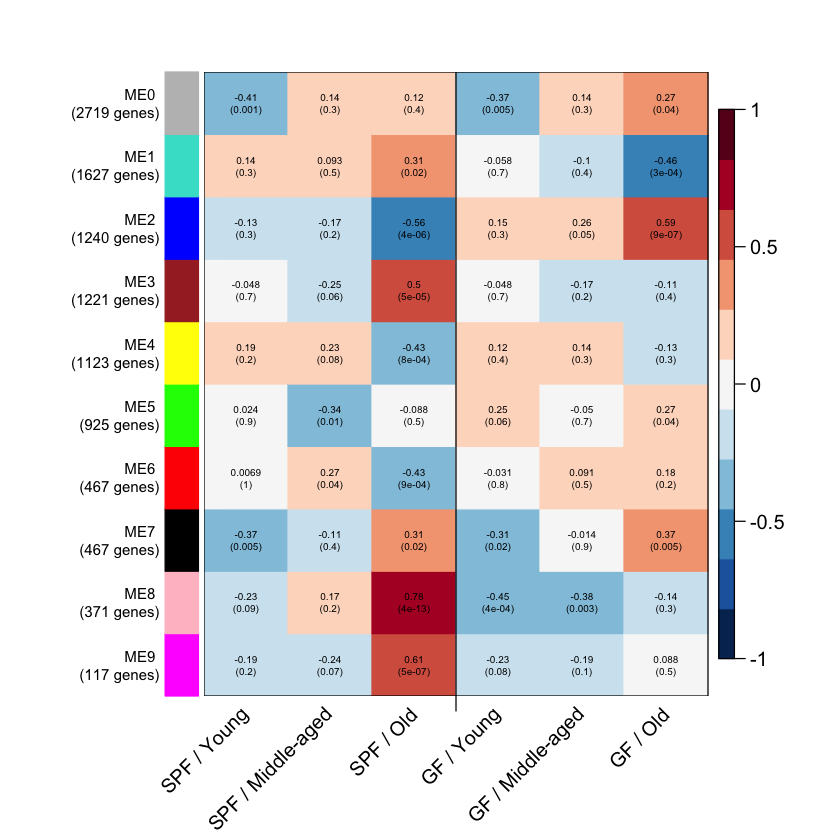

In [59]:
plot_module_groups(trait[['Microbiota / Age']], 3)

pdf 
  2

Young / SPF / Male       Young / SPF / Female 
                         3                          3 
         Young / GF / Male        Young / GF / Female 
                         3                          5 
  Middle-aged / SPF / Male Middle-aged / SPF / Female 
                         5                          5 
   Middle-aged / GF / Male  Middle-aged / GF / Female 
                         4                          6 
          Old / SPF / Male         Old / SPF / Female 
                        13                          3 
           Old / GF / Male          Old / GF / Female 
                         5                          3

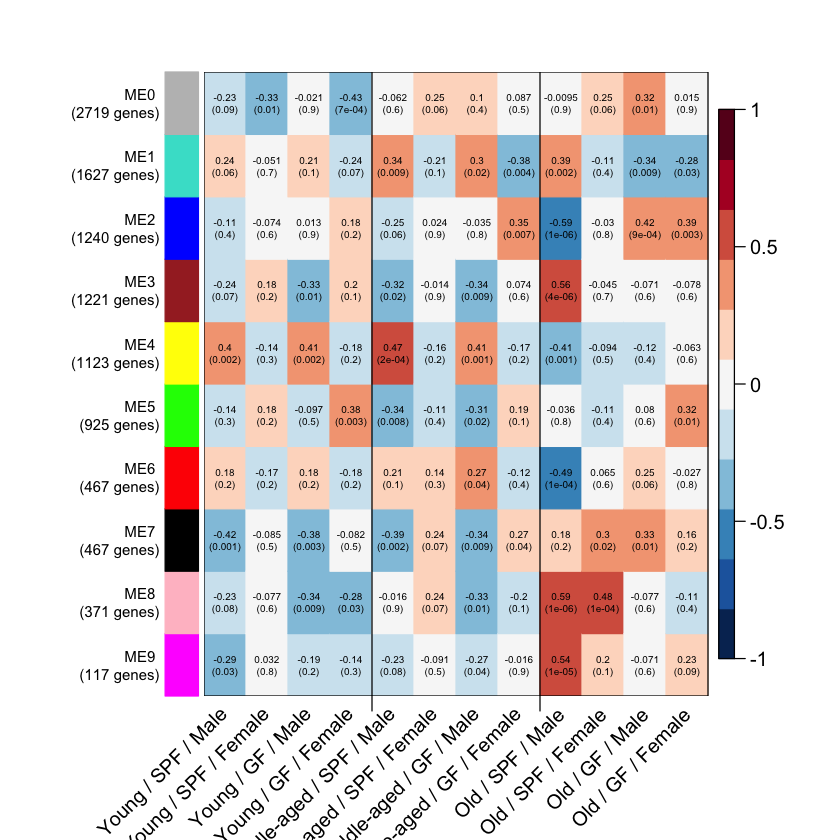

In [60]:
plot_module_groups(trait[['Age / Microbiota / Sex']], c(4, 8))
pdf("../results/dge/modules/module_group_age_microbiota_sex.pdf")
plot_module_groups(trait[['Age / Microbiota / Sex']], c(4, 8))
dev.off()
apply(trait[['Age / Microbiota / Sex']] %>% select(-c(sample)),2, sum)

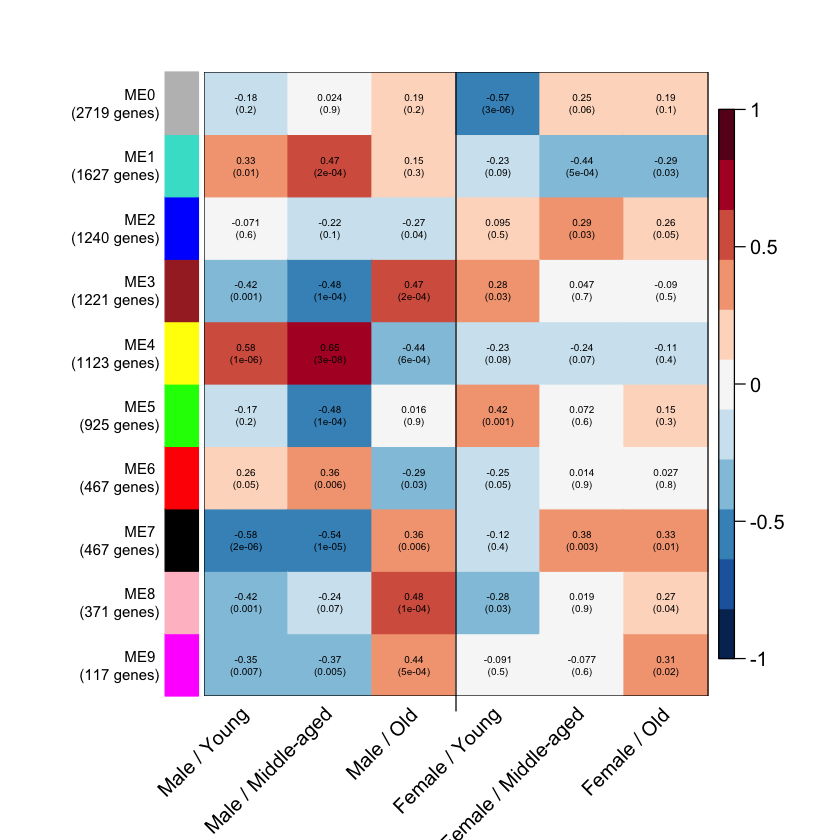

In [61]:
plot_module_groups(trait[['Sex / Age']], c(3))

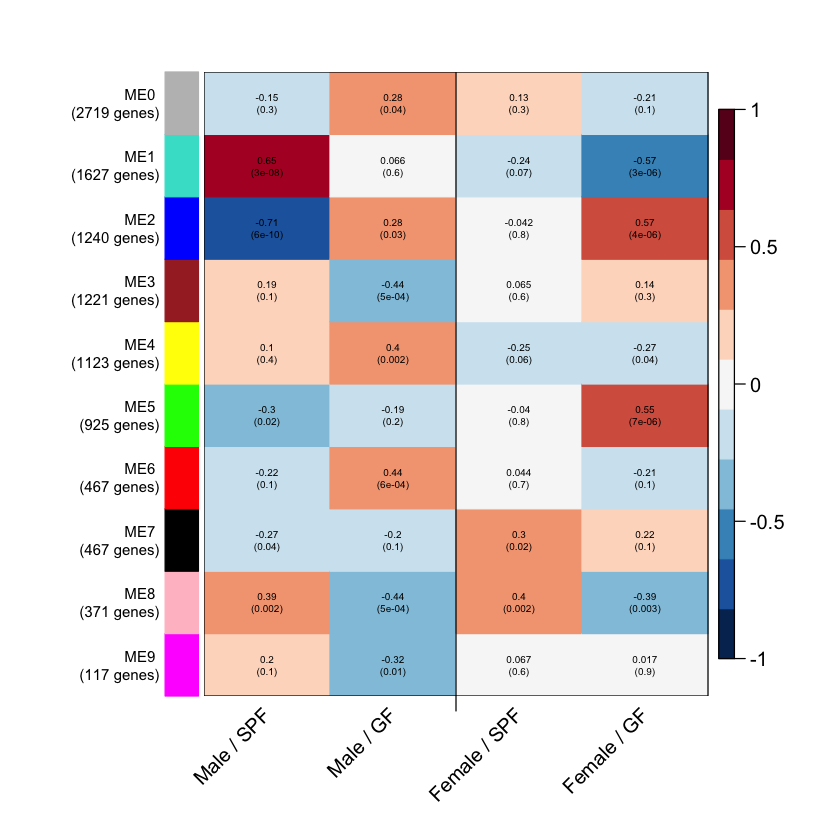

In [62]:
plot_module_groups(trait[['Sex / Microbiota']], c(2))

## Genes in modules

Associate genes to modules

In [63]:
genes_in_modules_bool = sapply(0:module_nb, function(x) return(gene_colors == x))
colnames(genes_in_modules_bool) = names(mod_sizes)

In [64]:
genes_in_modules = lapply(names(mod_sizes), function(x) return(rownames(genes_in_modules_bool[genes_in_modules_bool[,x],])))
names(genes_in_modules) = names(mod_sizes)
capture.output(genes_in_modules, file = "../results/dge/modules/genes_in_modules")
save(genes_in_modules, file="../results/dge/genes_in_modules.RData")

### Heatmaps with Z-scores

#### Microbiota / Sex / Age

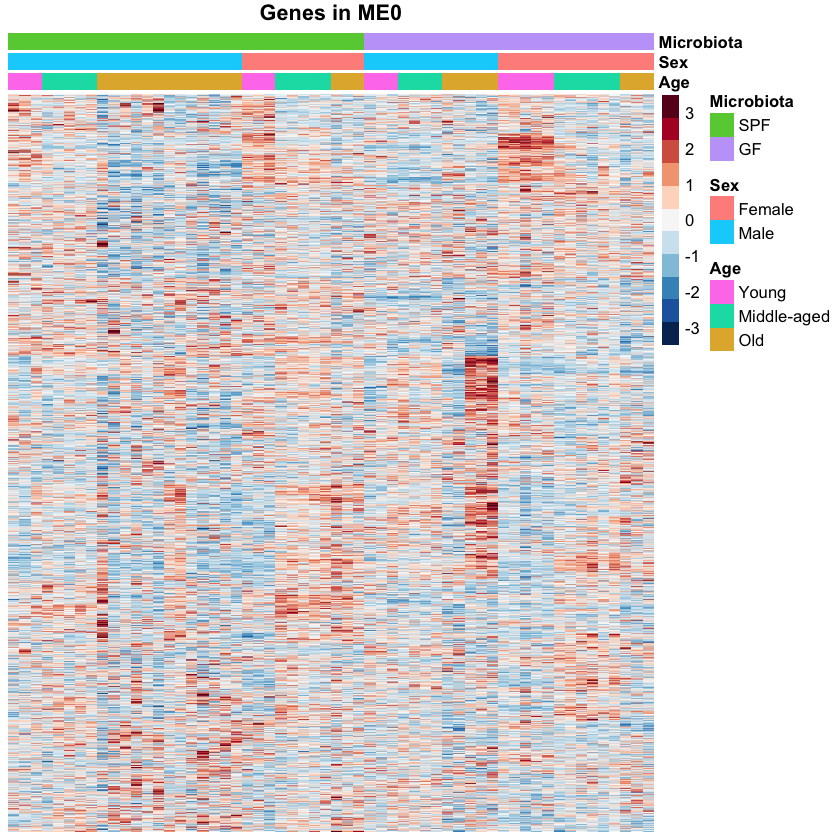

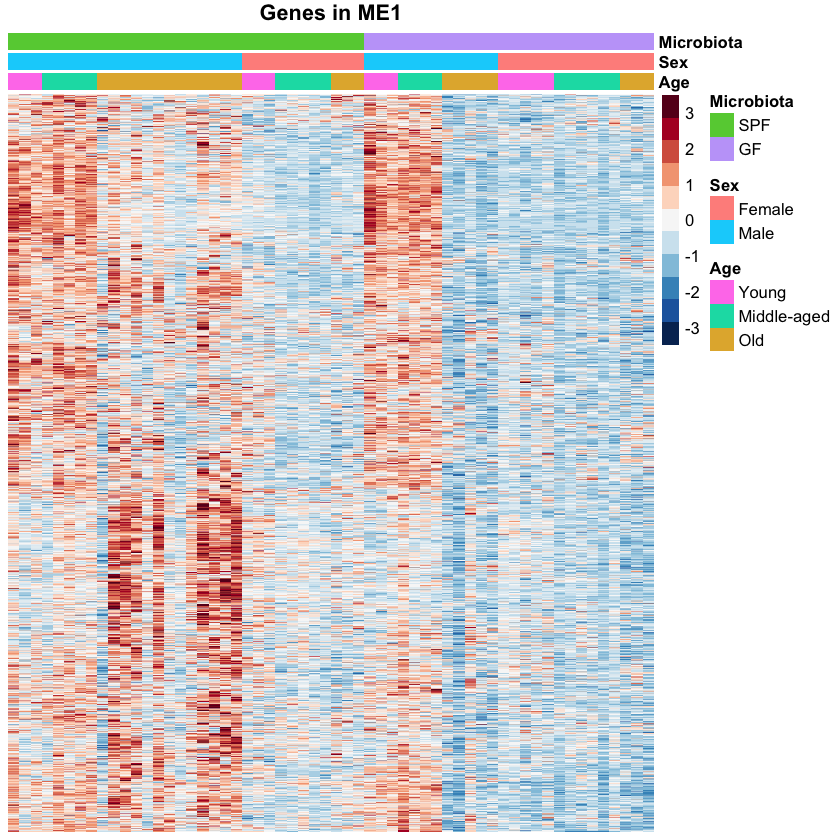

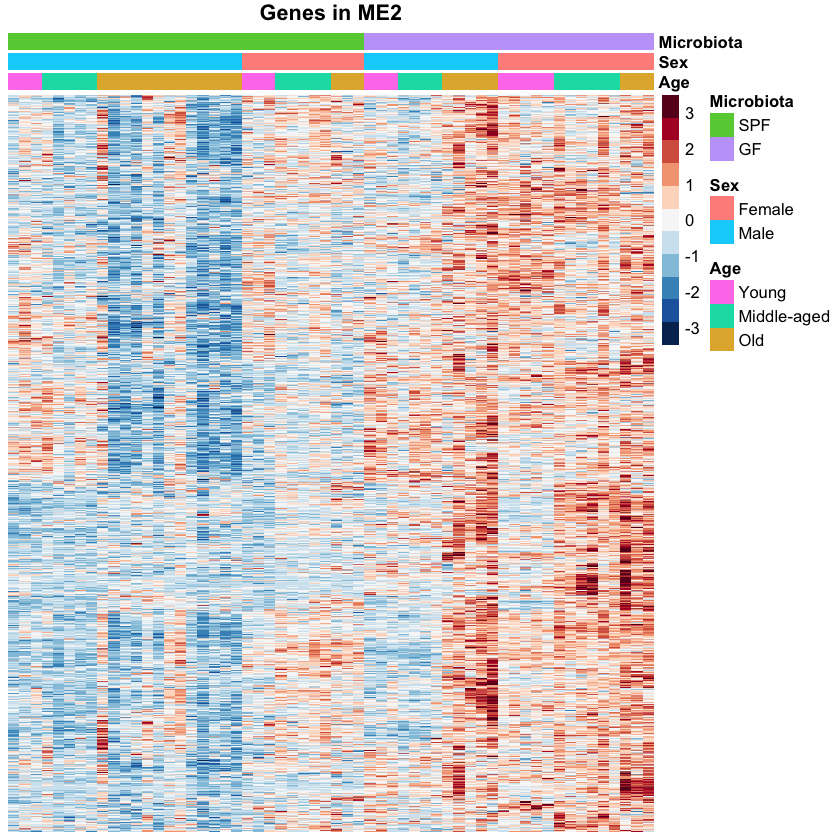

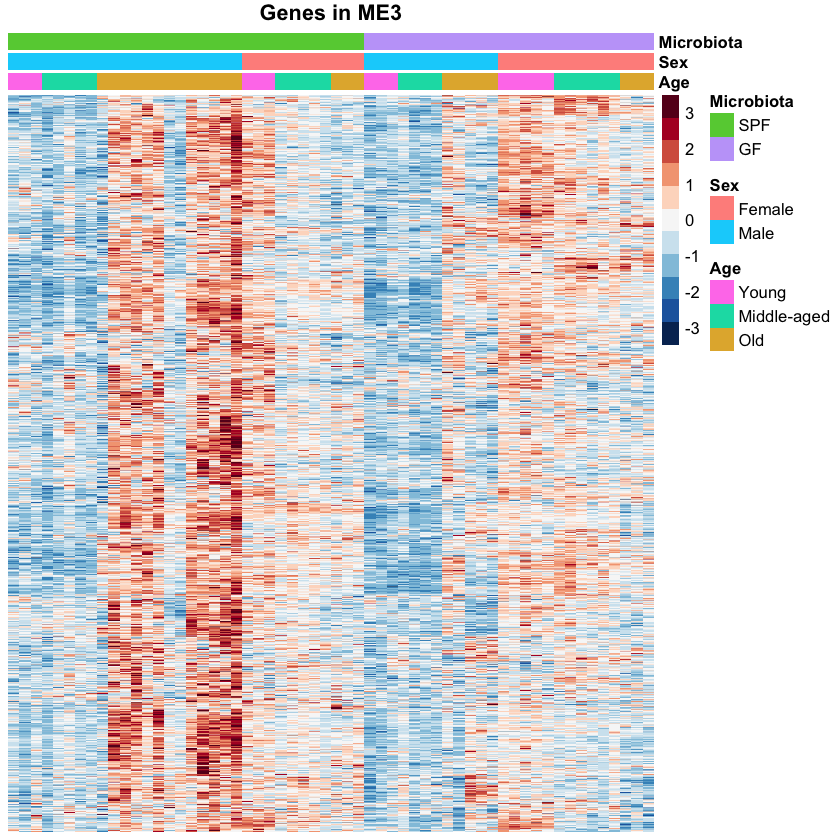

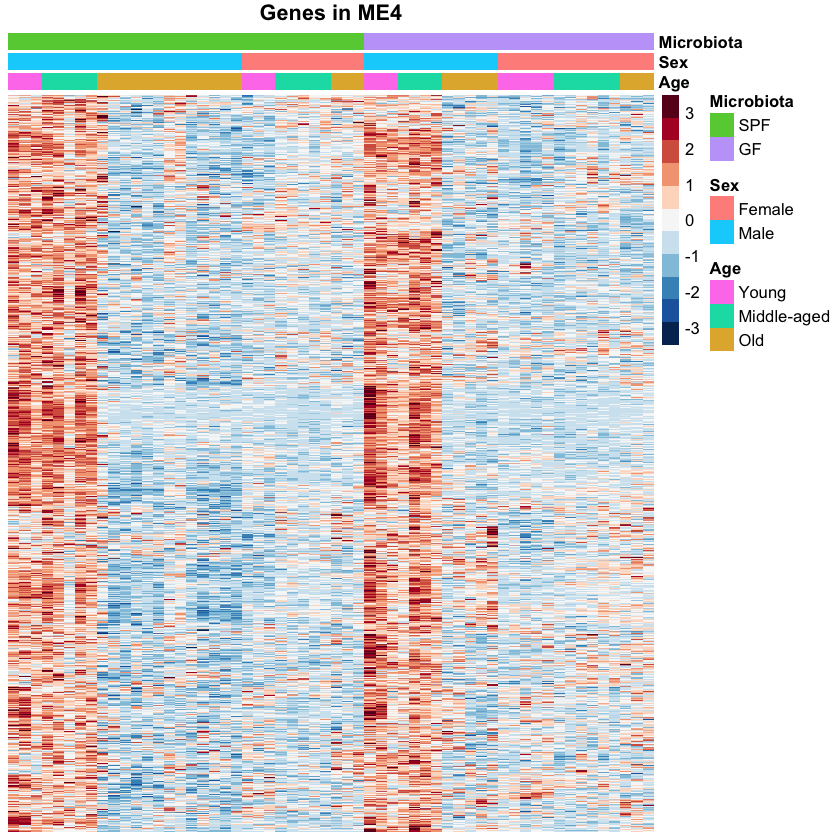

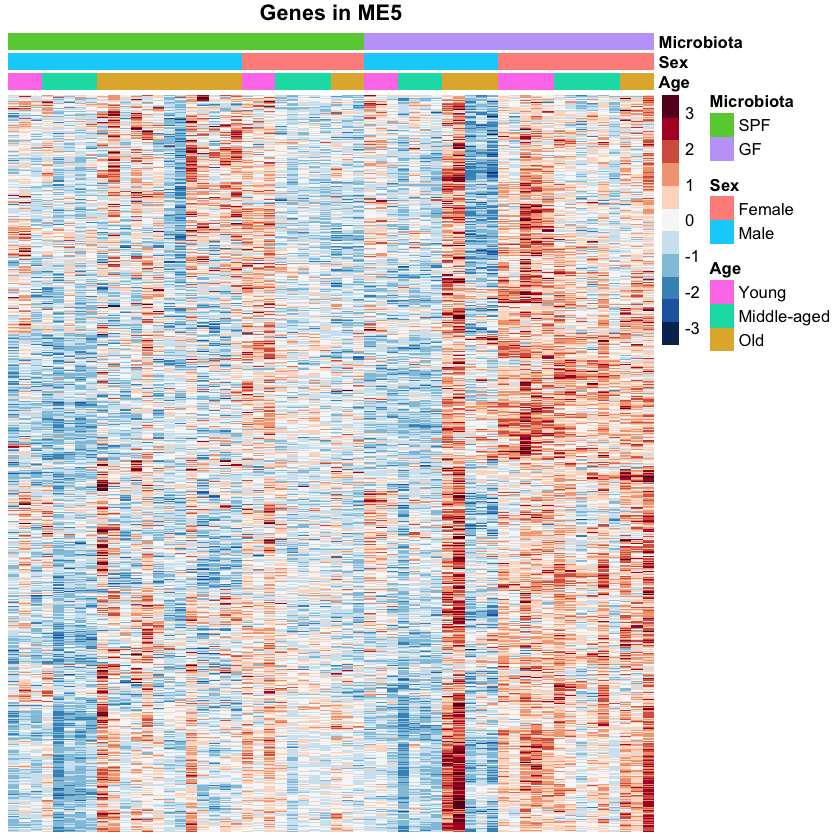

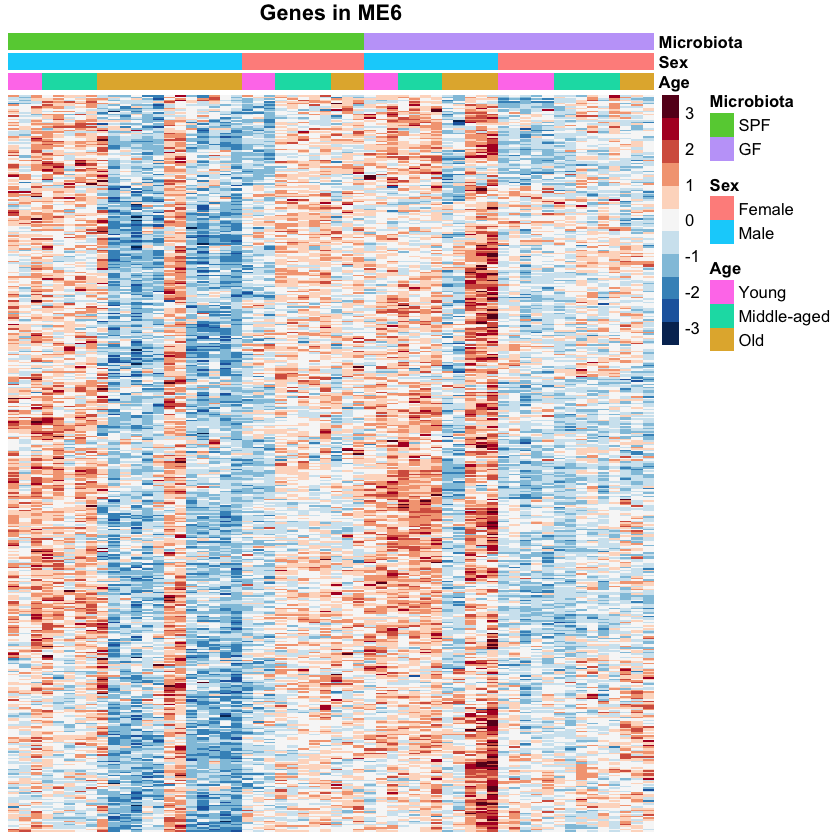

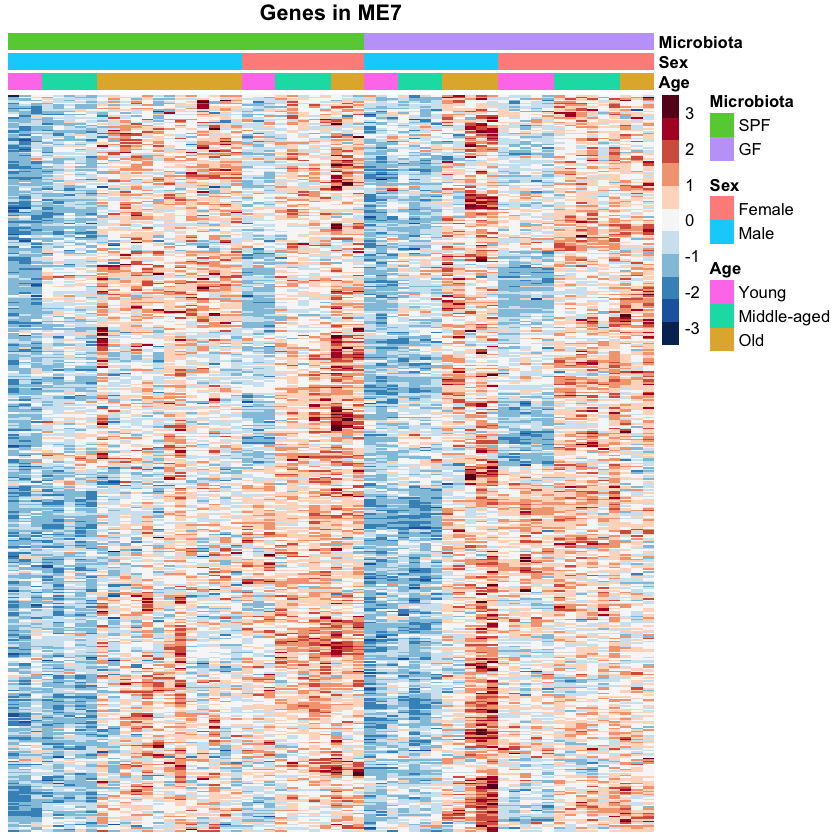

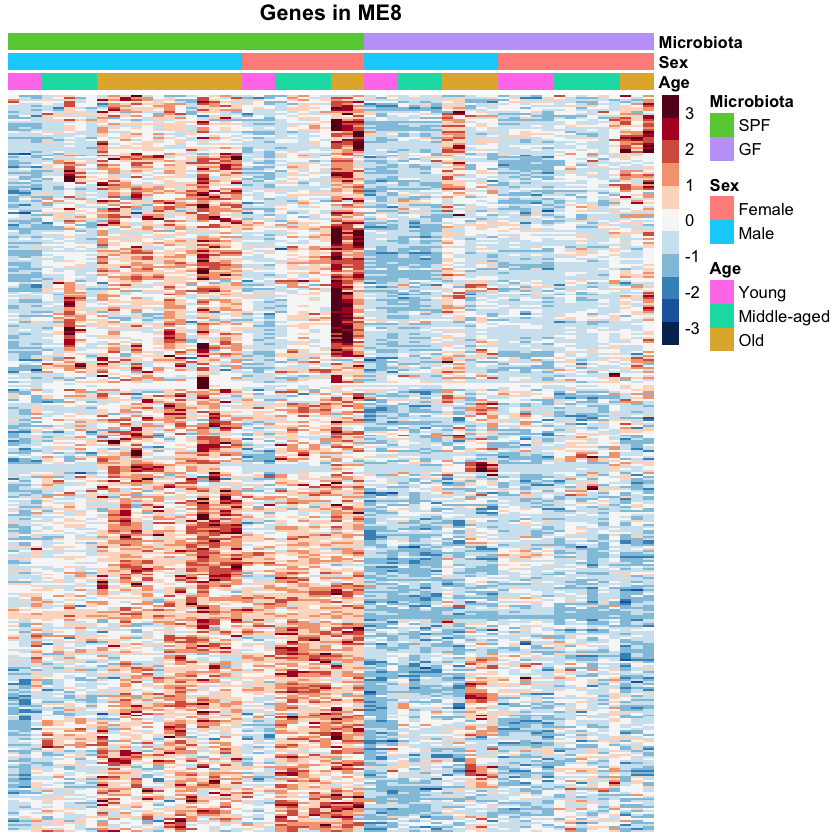

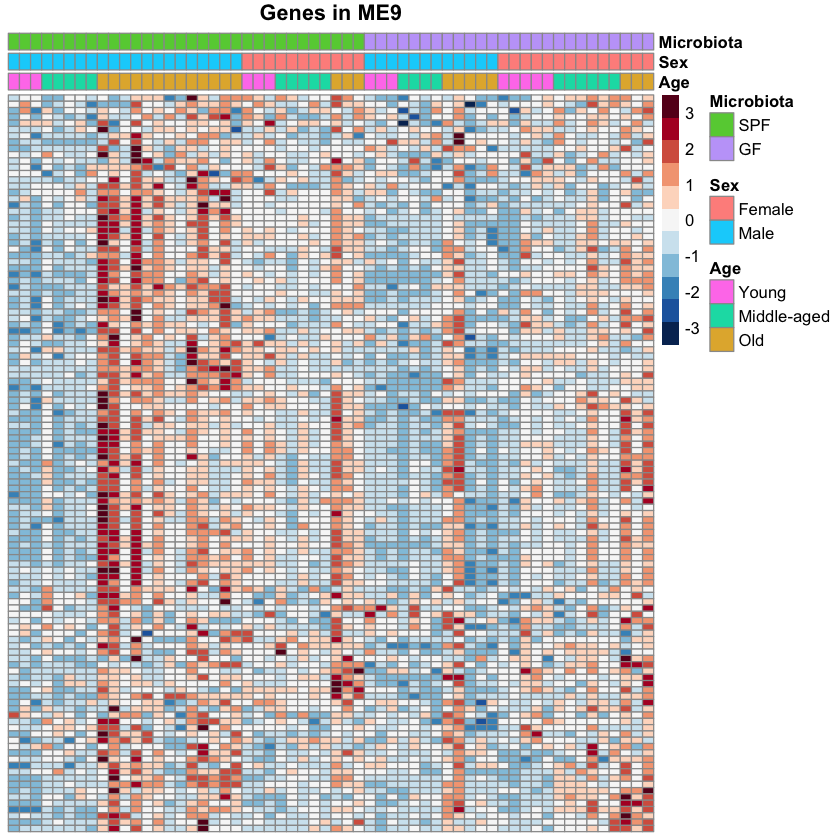

In [65]:
for(x in names(mod_sizes)){
    plot_z_score_heatmap(z_scores,
                         genes_in_modules[[x]],
                         col_order$msa,
                         annot_col$msa,
                         paste("Genes in ", x, sep=""),
                         col_order$msa)
}

##### Heatmap with genes in modules

pdf 
  3

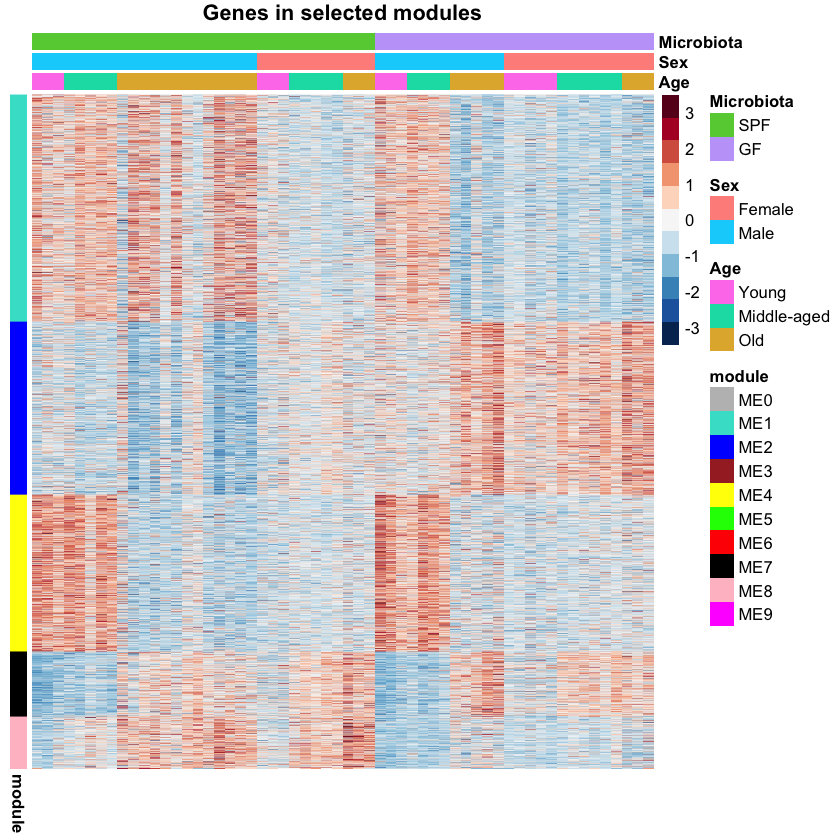

In [66]:
plot_z_score_heatmap_with_modules(z_scores,
                                  rownames(z_scores),
                                  col_order$msa,
                                  annot_col$msa,
                                  genes_in_modules[c('ME1', 'ME2', 'ME4', 'ME7', 'ME8')],
                                  "Genes in selected modules")
pdf('../results/dge/modules/z_score_selected_modules_msa.pdf')
plot_z_score_heatmap_with_modules(z_scores,
                                  rownames(z_scores),
                                  col_order$msa,
                                  annot_col$msa,
                                  genes_in_modules[c('ME1', 'ME2', 'ME4', 'ME7', 'ME8')],
                                  "Genes in selected modules")
dev.off()

pdf 
  3

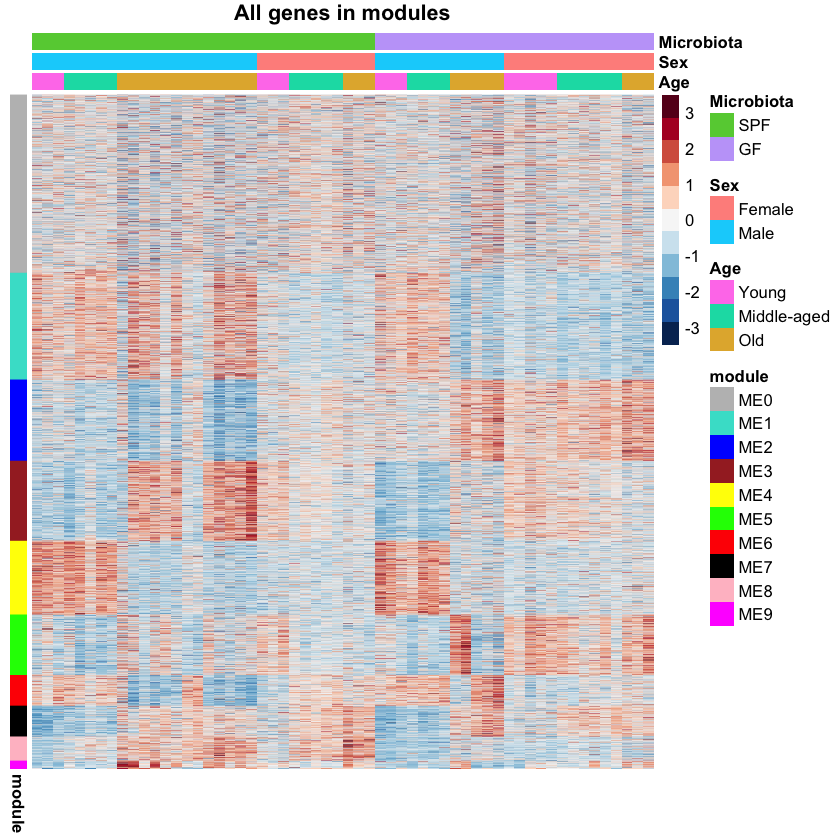

In [67]:
plot_z_score_heatmap_with_modules(z_scores,
                                  rownames(z_scores),
                                  col_order$msa,
                                  annot_col$msa,
                                  genes_in_modules,
                                  "All genes in modules")
pdf('../results/dge/modules/z_score_modules_msa.pdf')
plot_z_score_heatmap_with_modules(z_scores,
                                  rownames(z_scores),
                                  col_order$msa,
                                  annot_col$msa,
                                  genes_in_modules,
                                  "All genes in modules")
dev.off()

#### Sex / Microbiota / Age

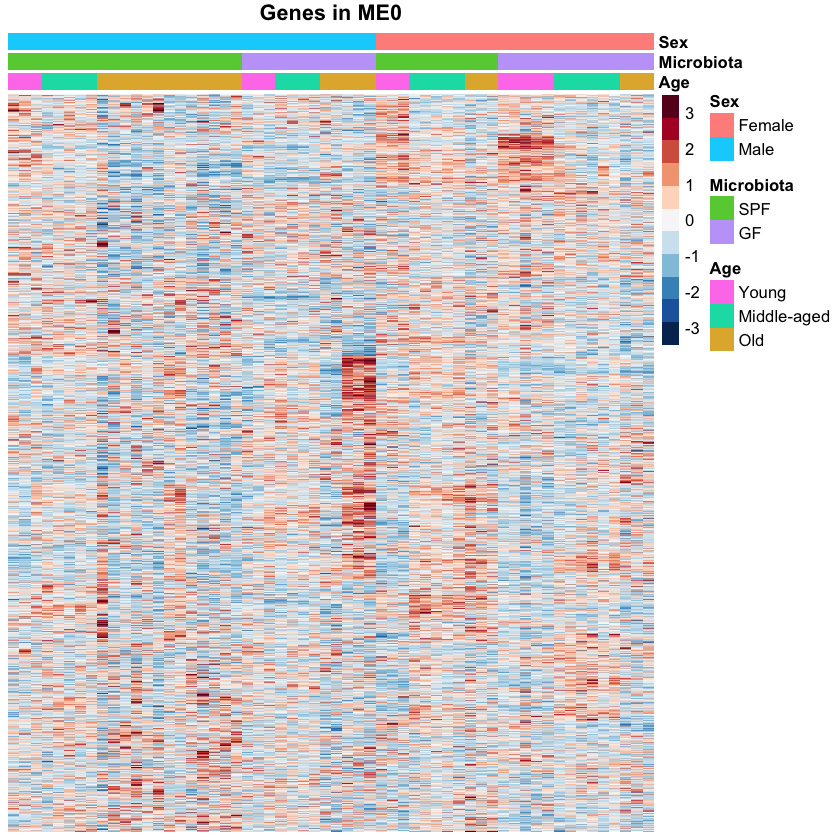

In [68]:
for(x in names(mod_sizes)){
    plot_z_score_heatmap(z_scores,
                         genes_in_modules[[x]],
                         col_order$sma,
                         annot_col$sma,
                         paste("Genes in ", x, sep=""),
                         col_order$sma)
    pdf(paste("../results/dge/modules/module_heatmap", x, ".pdf", sep=""))
    plot_z_score_heatmap(z_scores,
                         genes_in_modules[[x]],
                         col_order$sma,
                         annot_col$sma,
                         paste("Genes in ", x, sep=""),
                         col_order$sma)
    dev.off()
}

#### Age / Microbiota / Sex

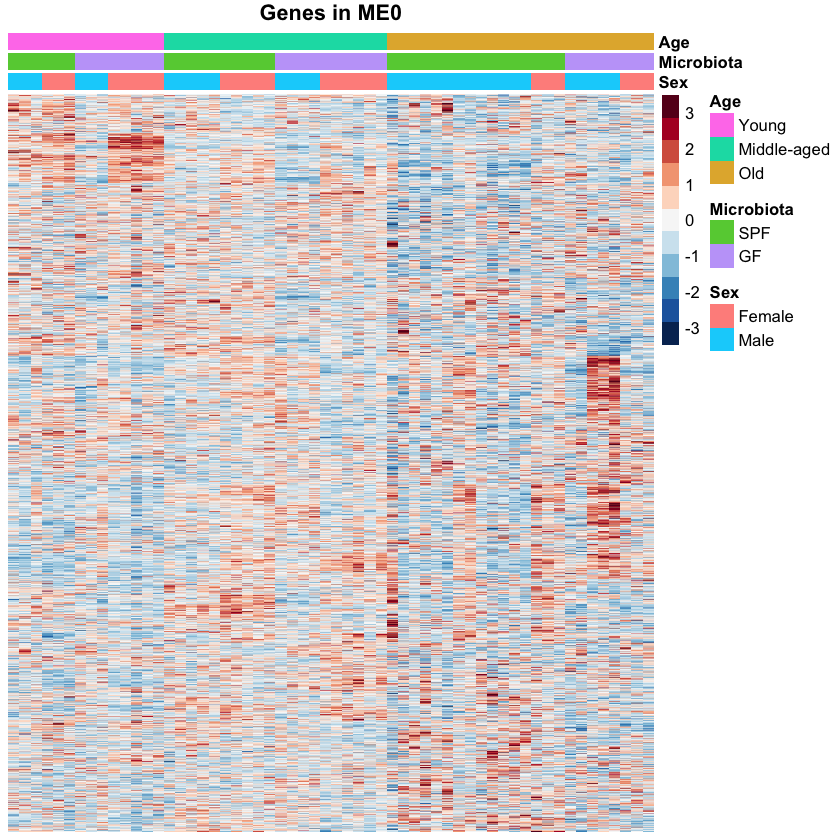

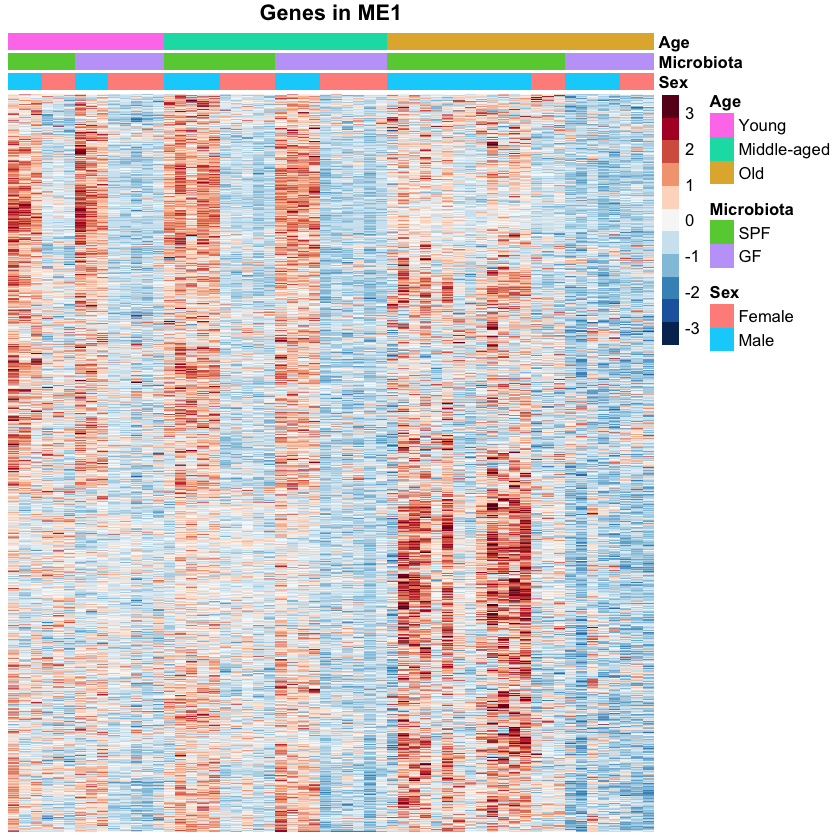

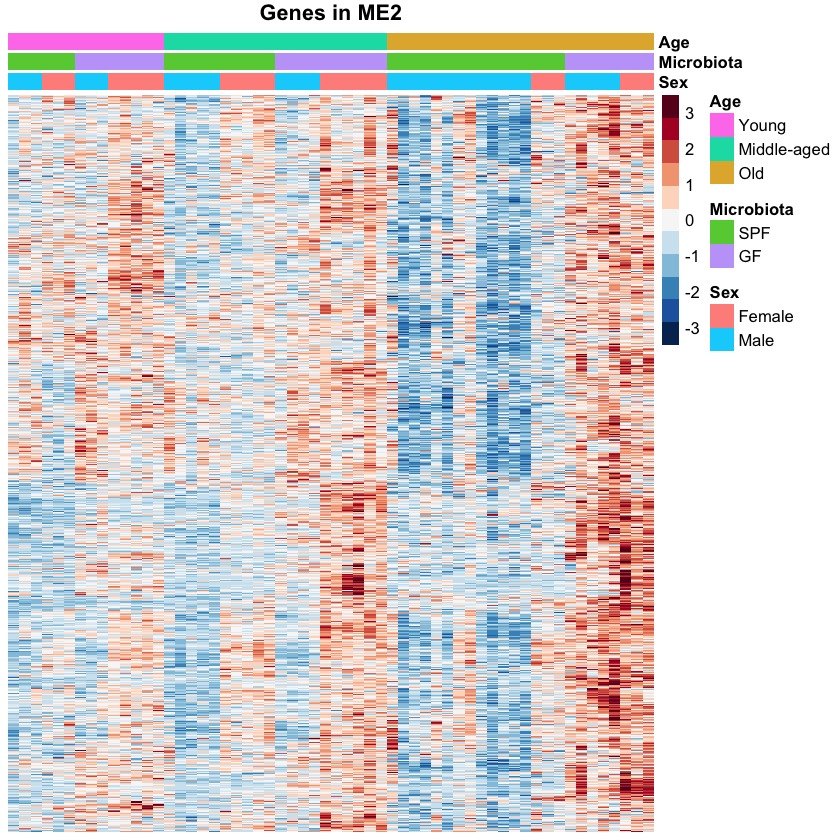

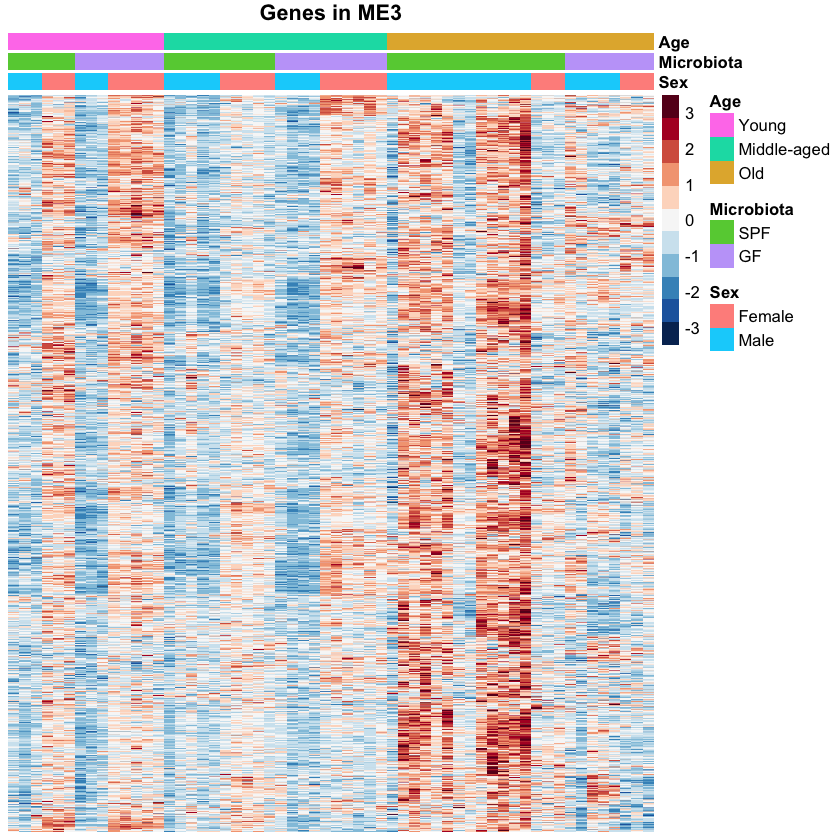

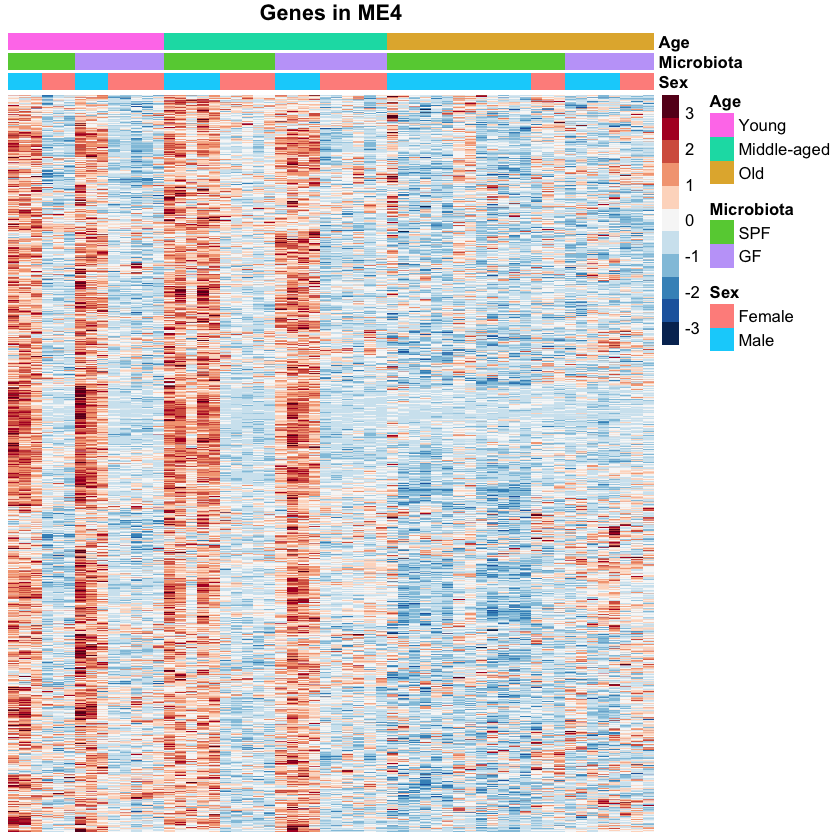

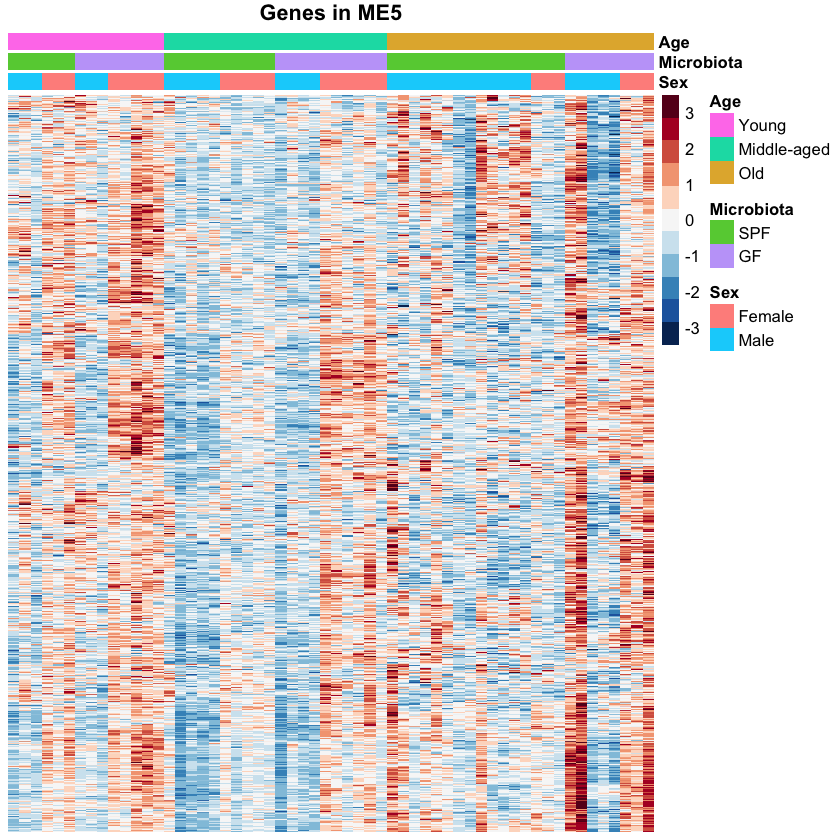

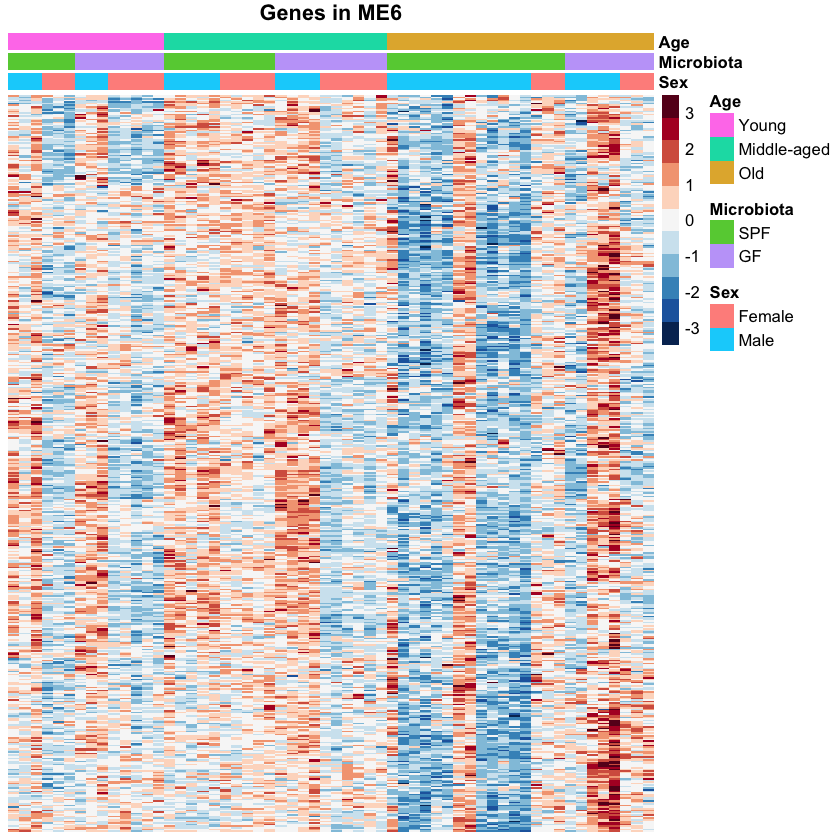

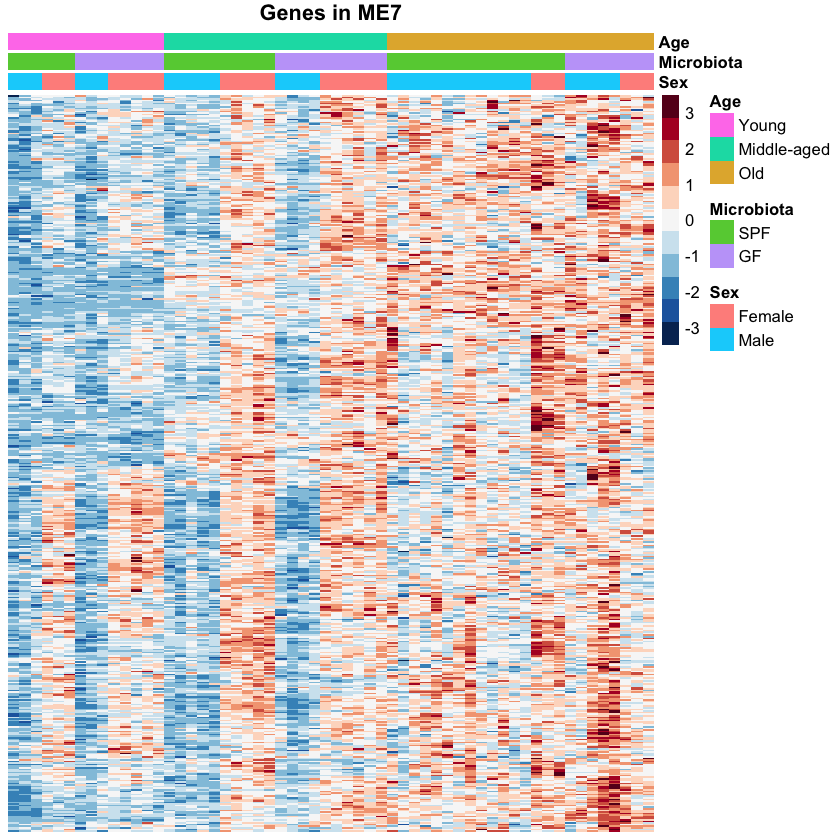

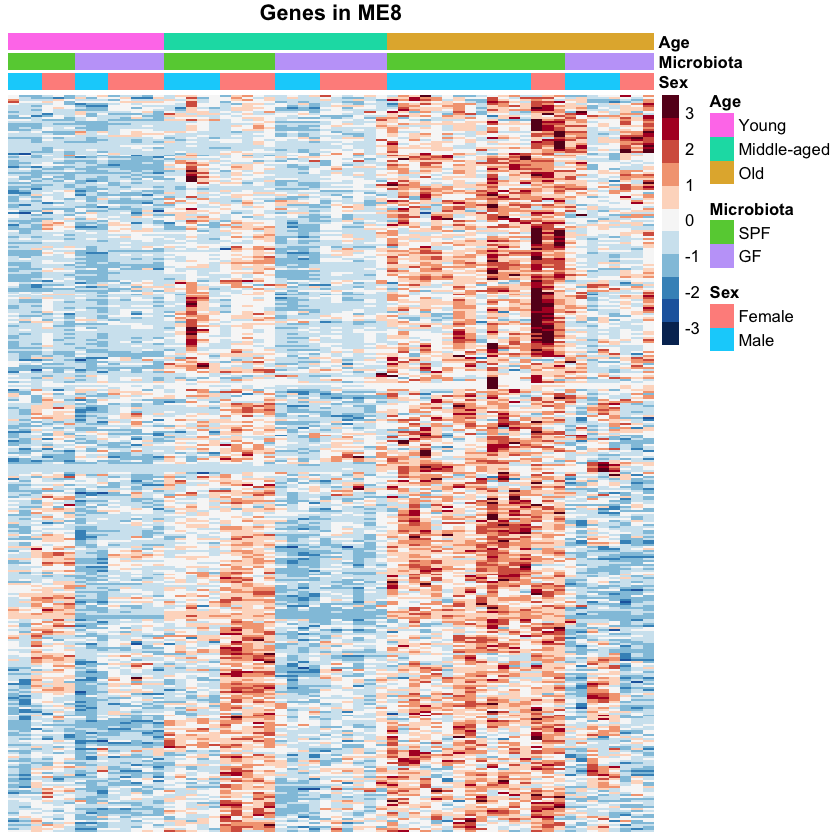

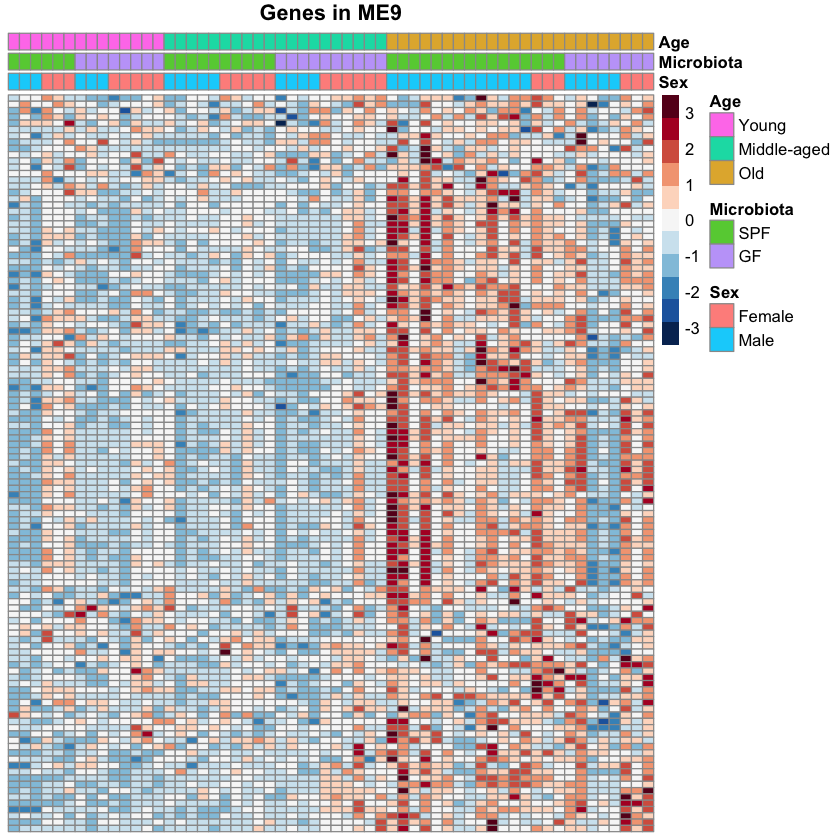

In [69]:
for(x in names(mod_sizes)){
    plot_z_score_heatmap(z_scores,
                         genes_in_modules[[x]],
                         col_order$ams,
                         annot_col$ams,
                         paste("Genes in ", x, sep=""),
                         col_order$ams)
}

### Sinaplots of the Z-scores per groups

The mean of the Z-score over the samples in the group is plot for each gene

In [70]:
plot_z_score_sinaplot = function(g, trait, z_scores, module_nb, genes_in_modules, pdf = FALSE){
    g_trait = trait[[g]]
    for(x in names(mod_sizes)){
        genes_in_mod = genes_in_modules[[x]]
        z_scores_vec = c()
        groups = c()
        for(y in colnames(g_trait)[-1]){
            samples = g_trait %>% 
                filter((!!as.name(y)) == 1) %>%
                pull(sample)
            mean_z_scores = apply(z_scores[genes_in_mod, samples], 1, mean)
            z_scores_vec = c(z_scores_vec, mean_z_scores)
            groups = c(groups, rep(y, length(mean_z_scores)))
        }
        sinaplot(z_scores_vec, 
                 groups,
                 col=pal2[x],
                 pch = 20,
                 bty = "n",
                 main=paste("Z-scores for the ", mod_sizes[x], " genes in ", x, sep=""),
                 las=2,
                 ylab = "Mean Z-scores of the genes over samples",
                 cex.axis=0.75)
        if(pdf){
            pdf(paste("../results/dge/modules/module_sinaplot_", x, ".pdf", sep=""))
            sinaplot(z_scores_vec, 
                     groups,
                     col=pal2[x],
                     pch = 20,
                     bty = "n",
                     main = paste("Z-scores for genes in ", x, sep=""),
                     las=2,
                     ylab = "Mean Z-scores of the genes over samples",
                     cex.axis=0.75)
            dev.off()
        }
    }
}

#### Microbiota / Age

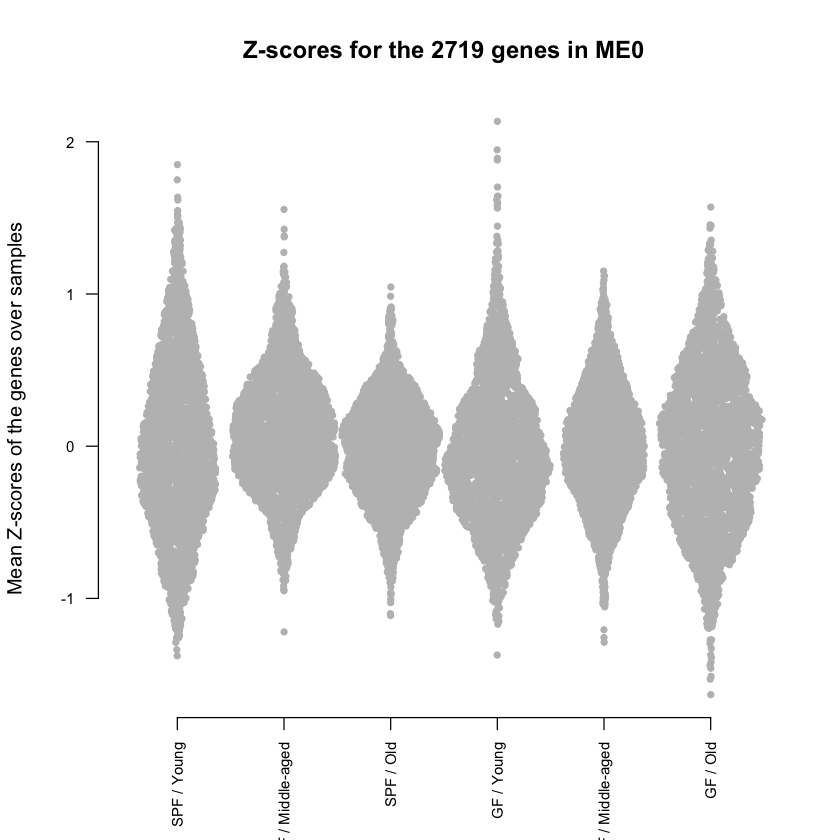

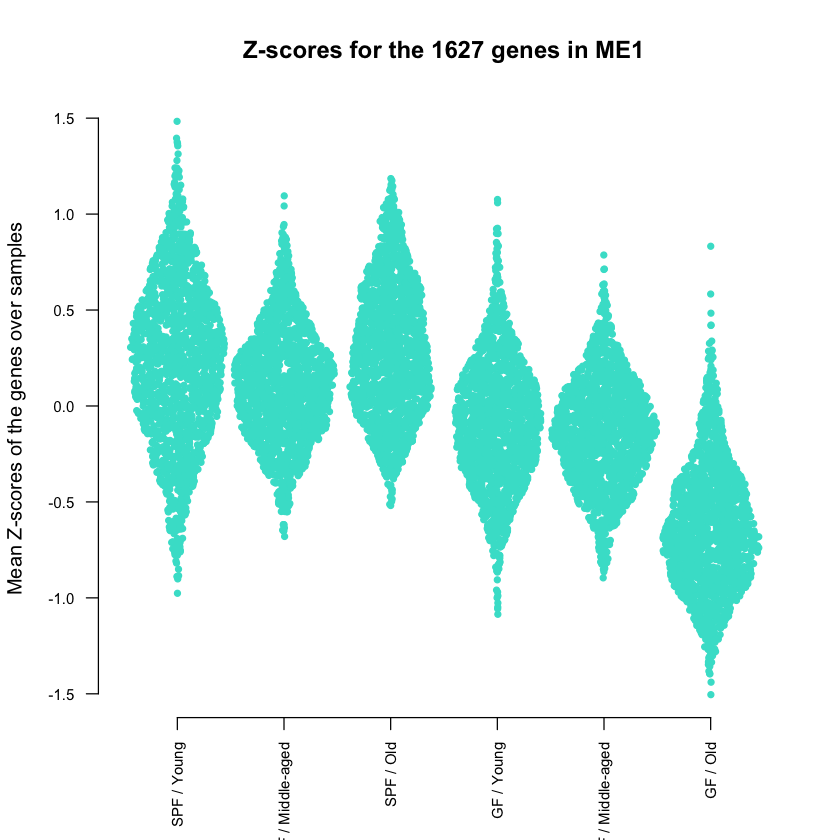

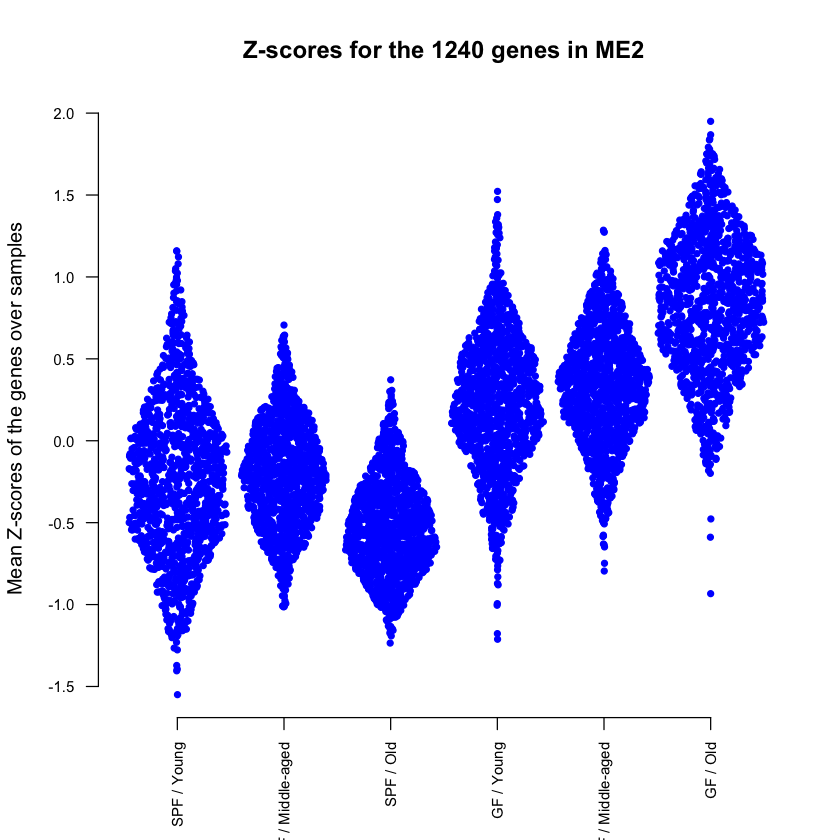

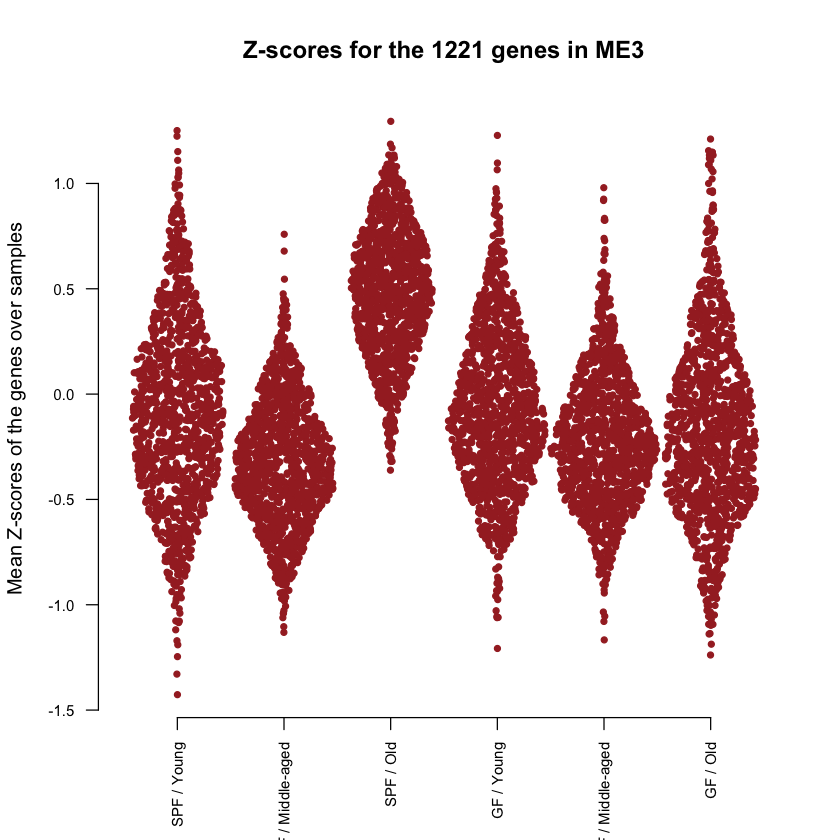

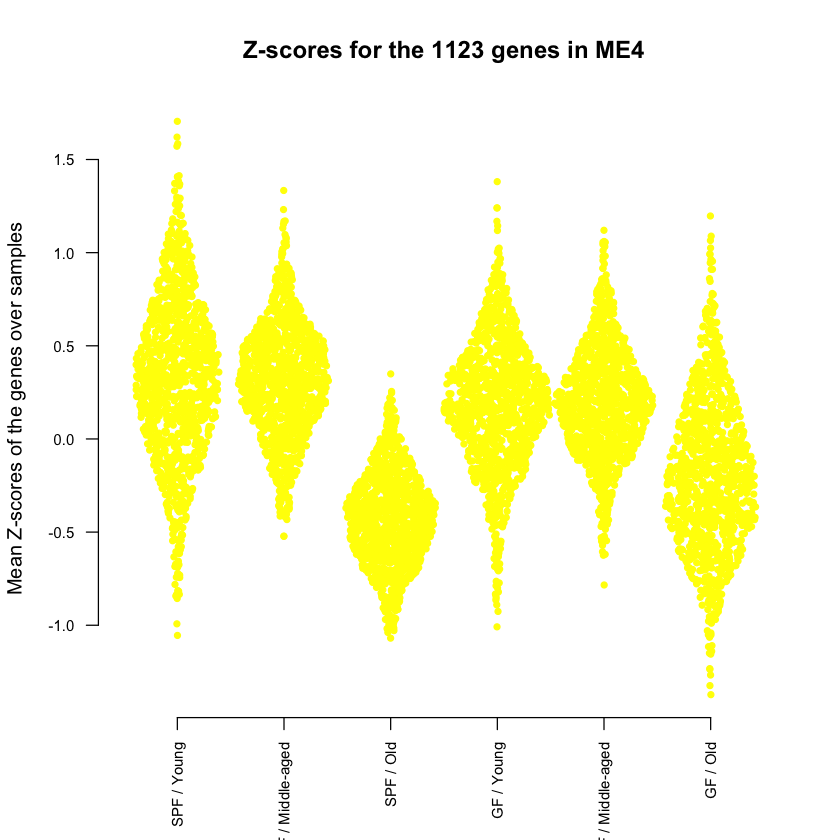

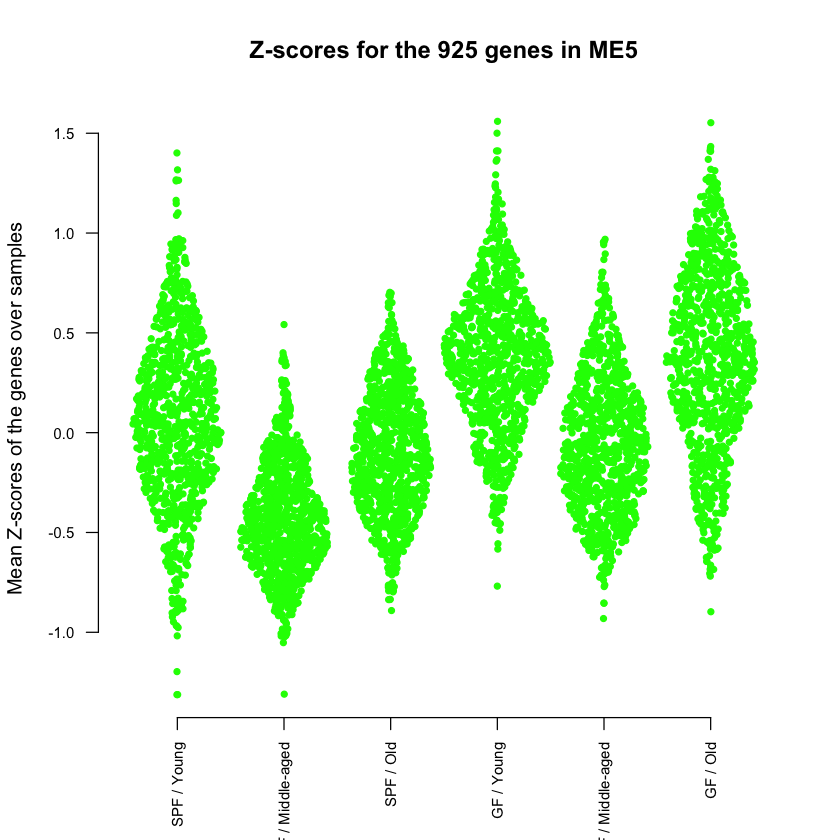

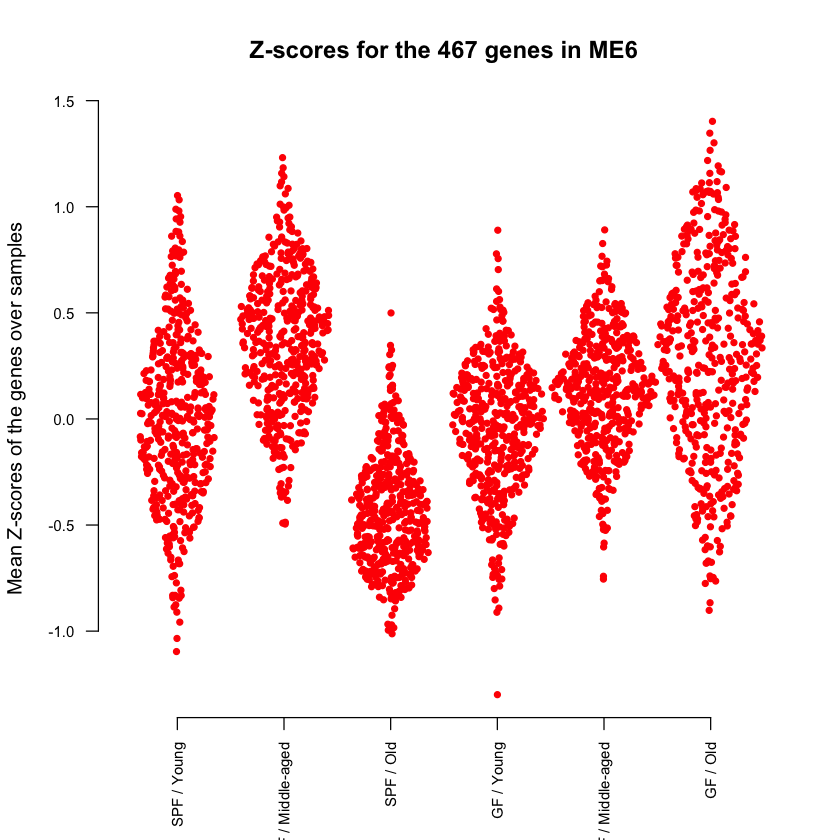

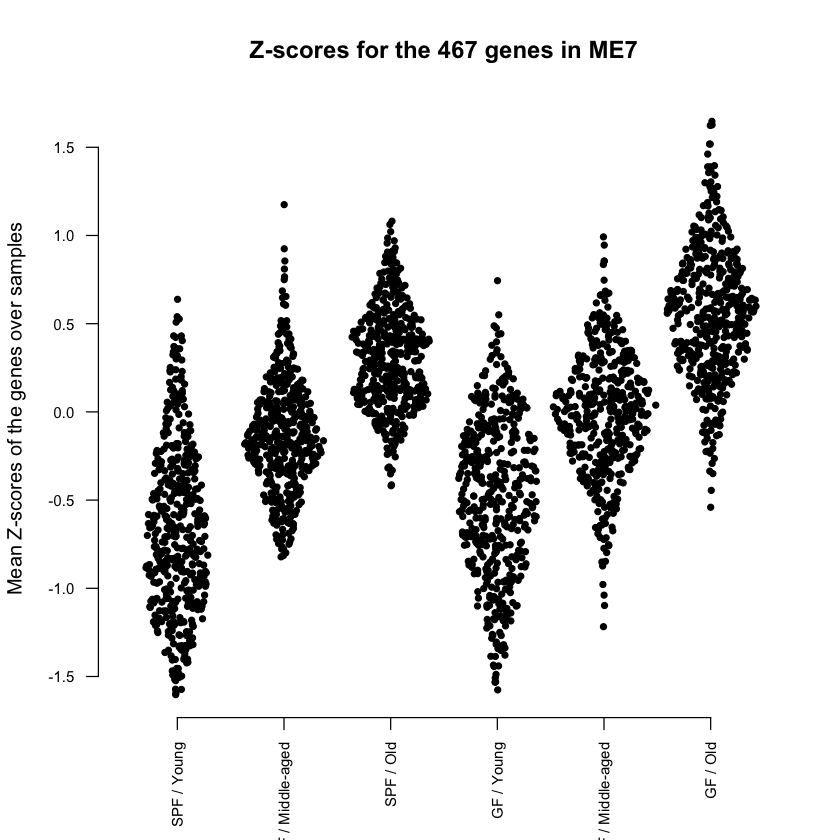

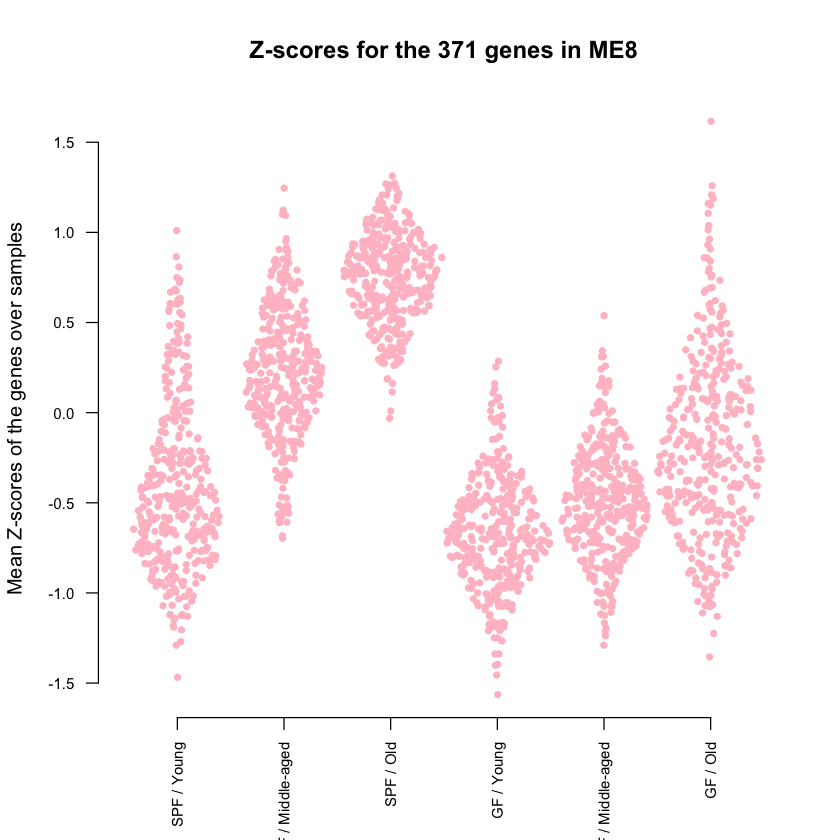

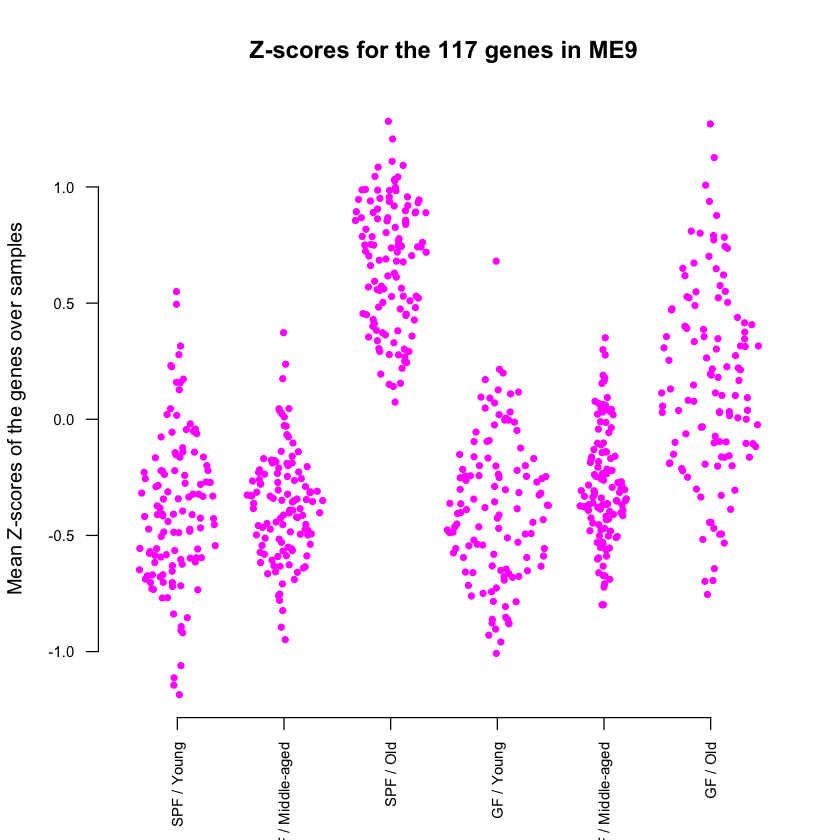

In [71]:
plot_z_score_sinaplot('Microbiota / Age', trait, z_scores, module_nb, genes_in_modules)

#### Microbiota / Age / Sex

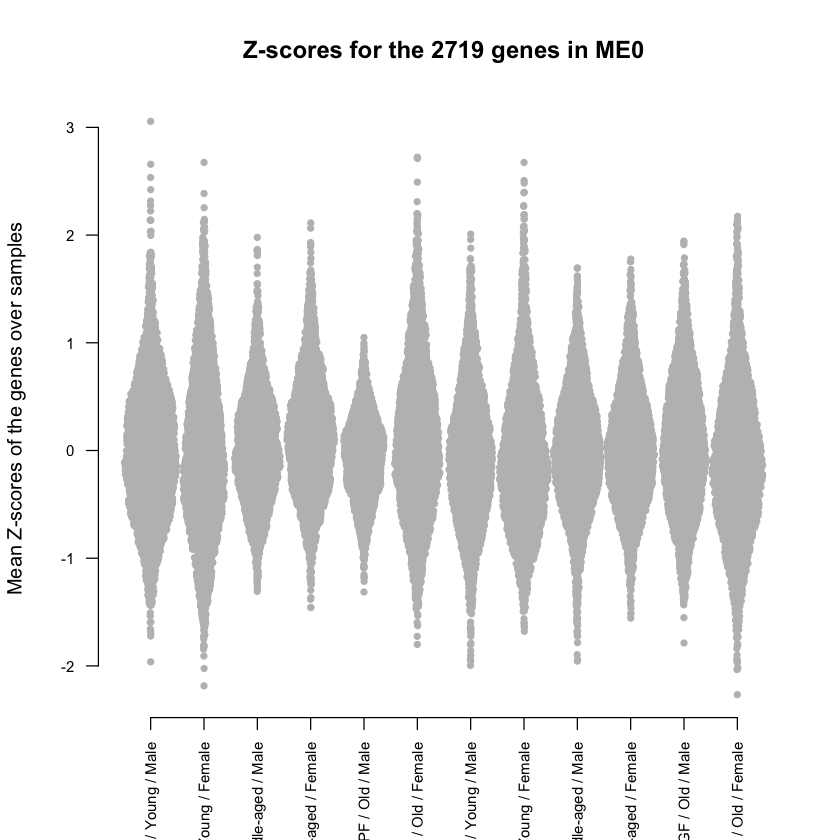

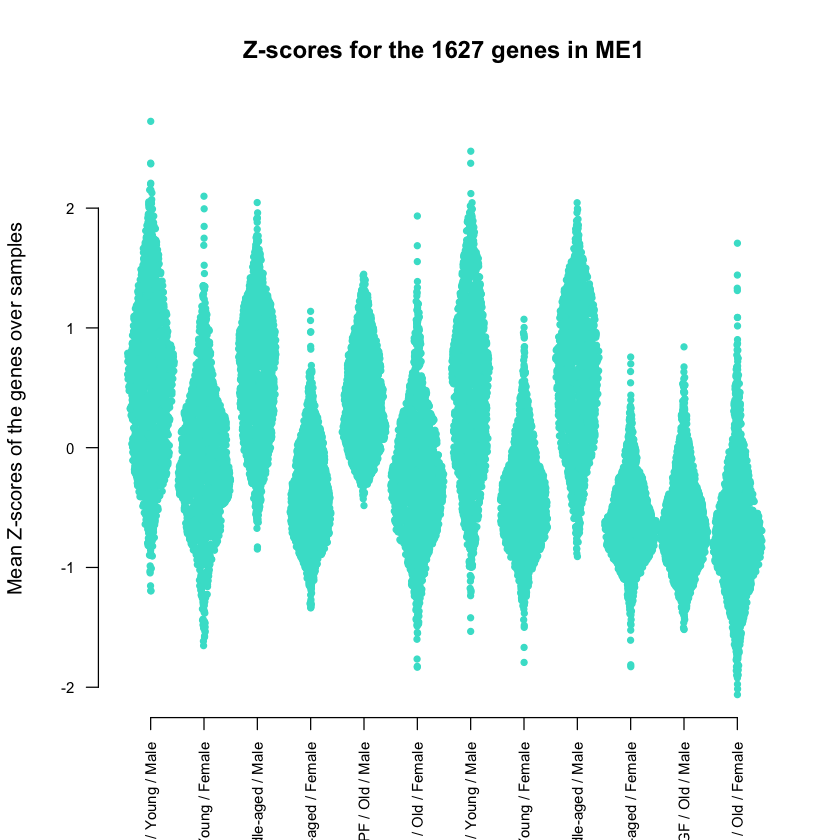

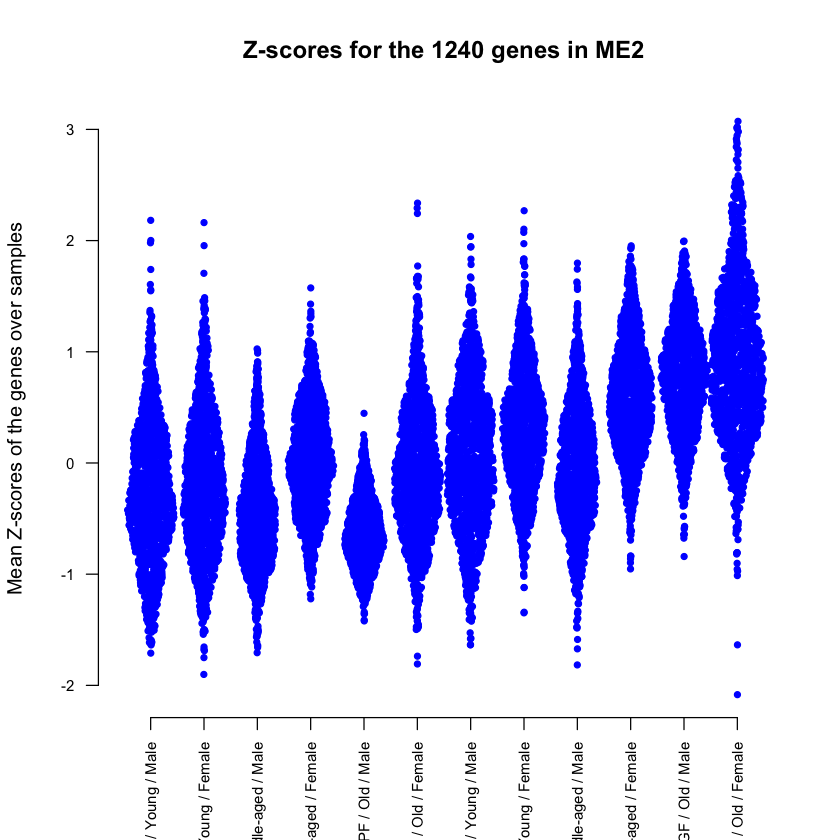

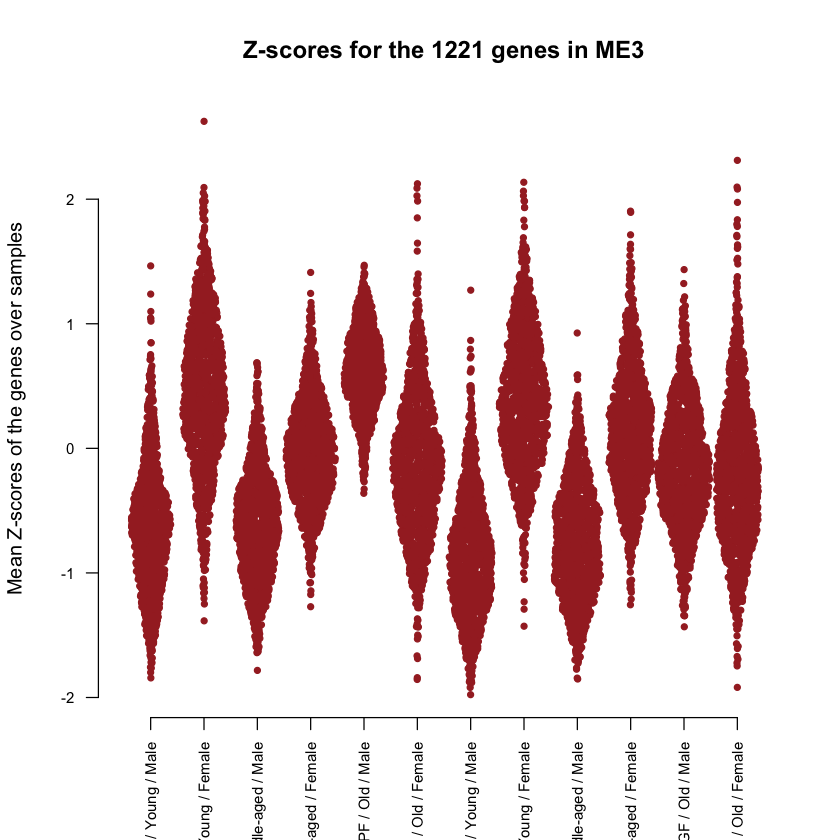

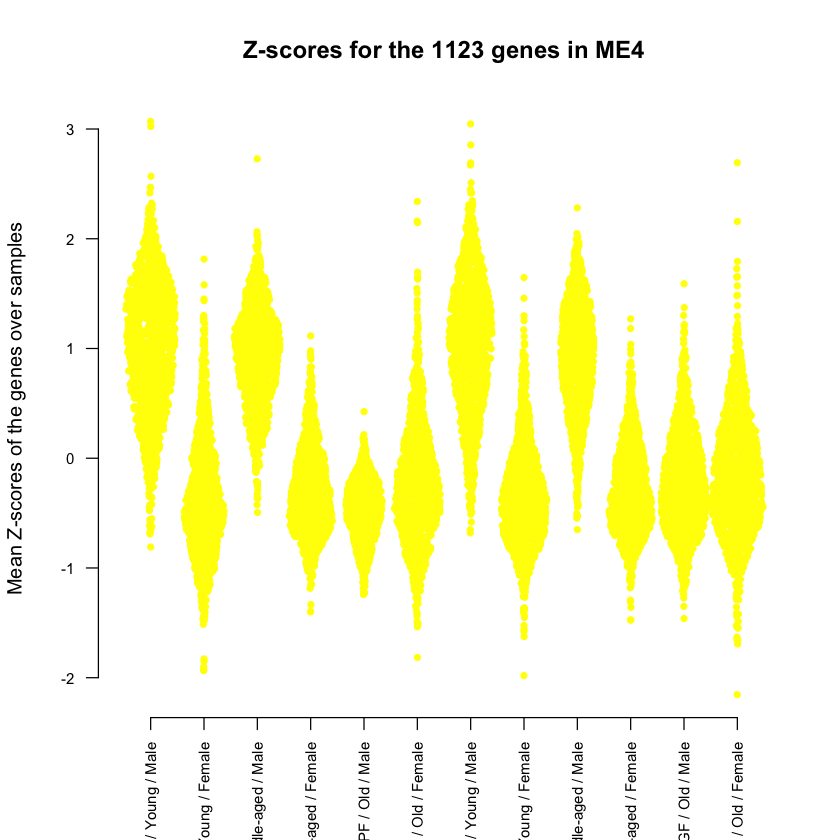

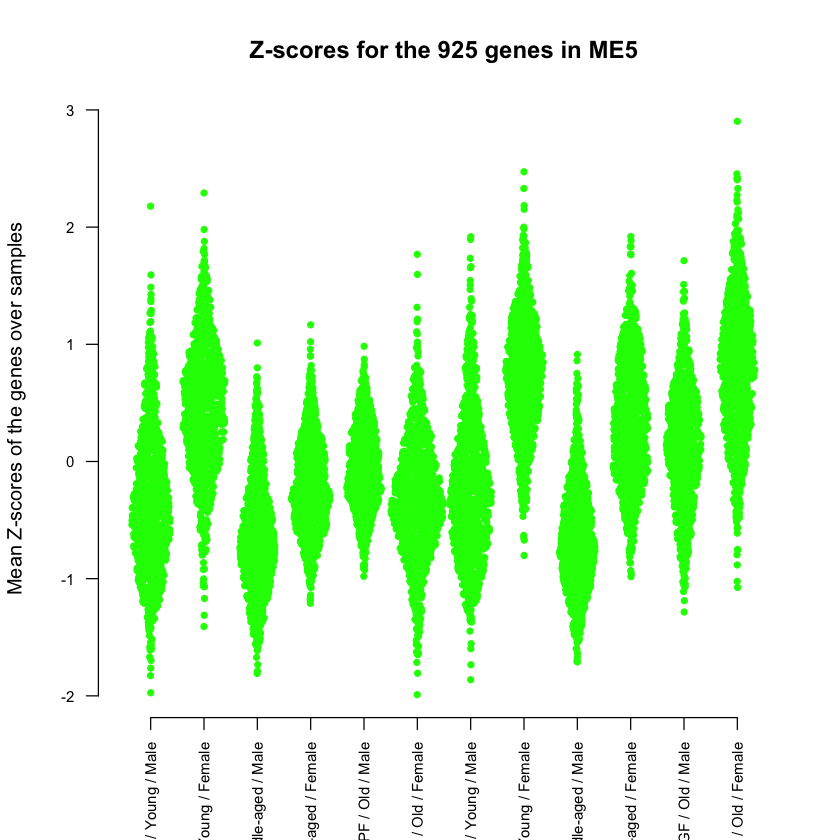

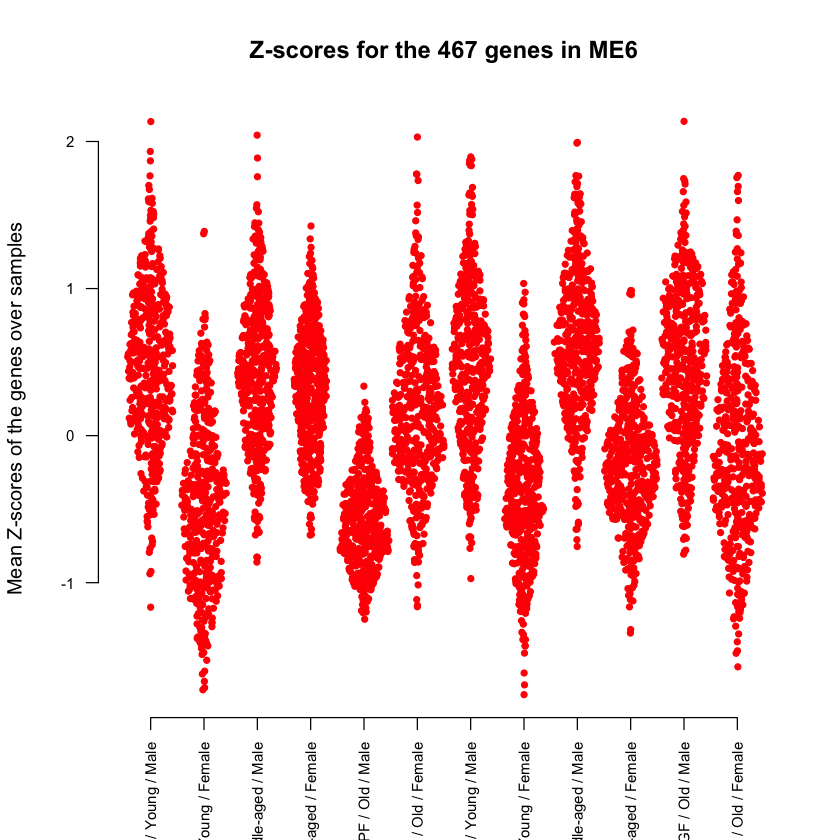

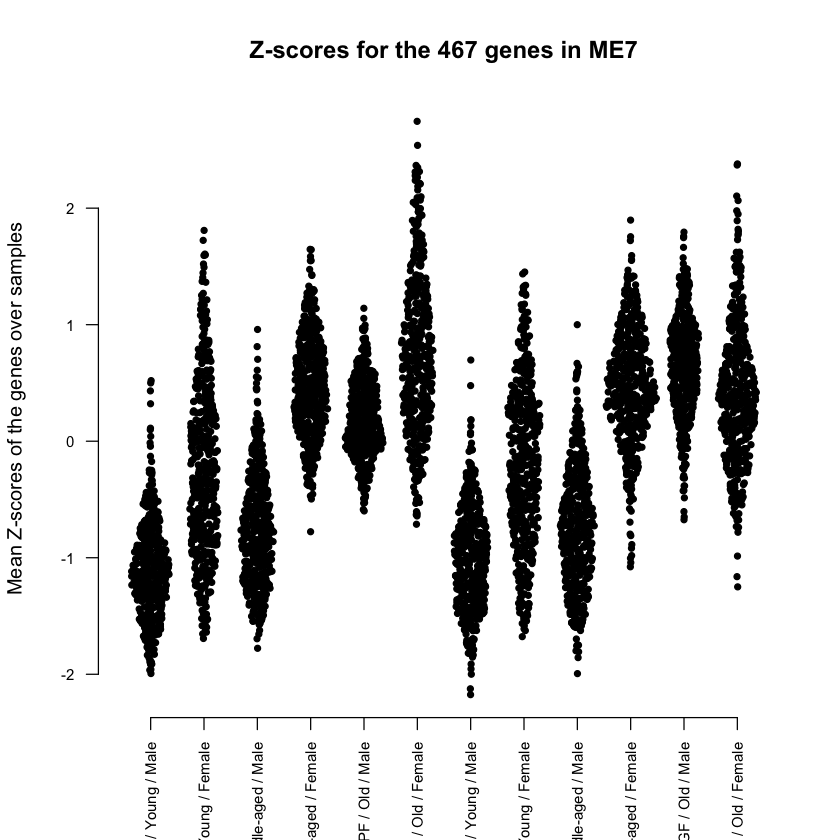

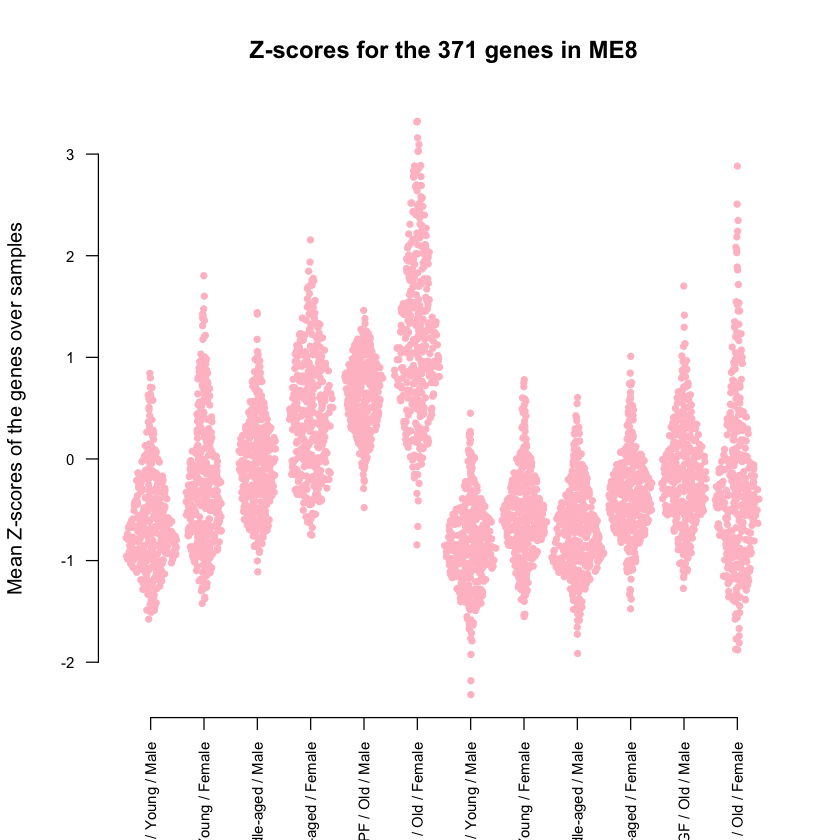

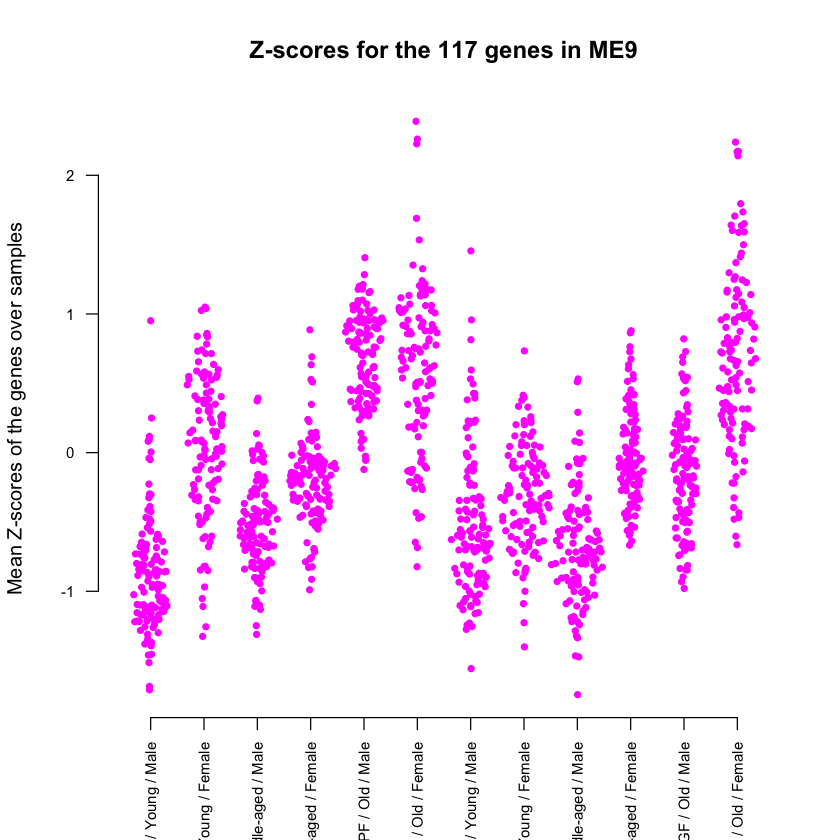

In [72]:
plot_z_score_sinaplot('Microbiota / Age / Sex', trait, z_scores, module_nb, genes_in_modules)

#### Age / Microbiota / Sex

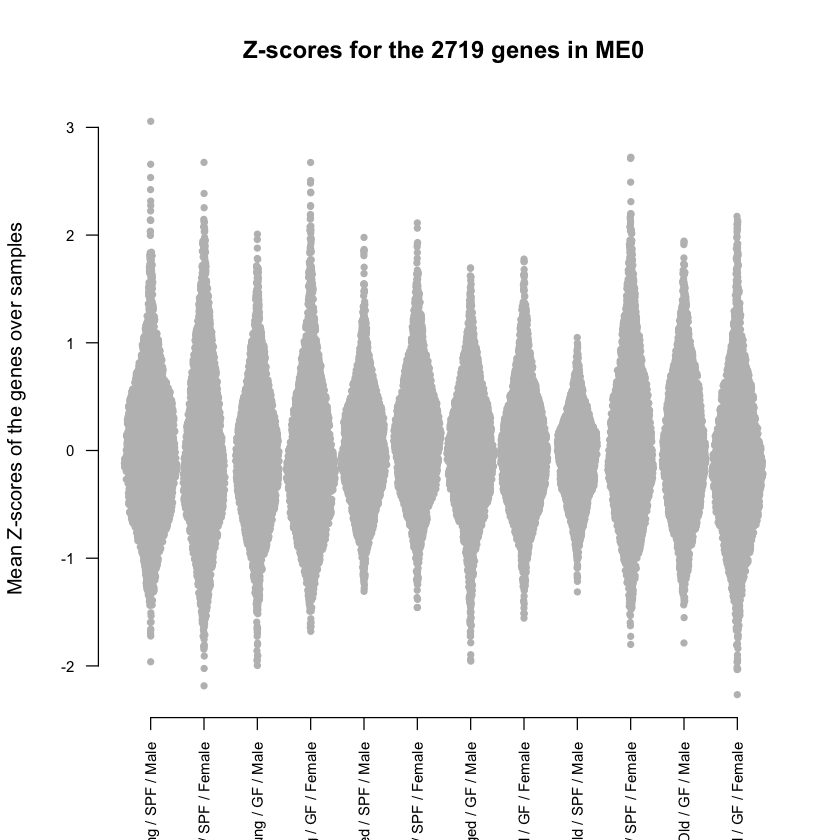

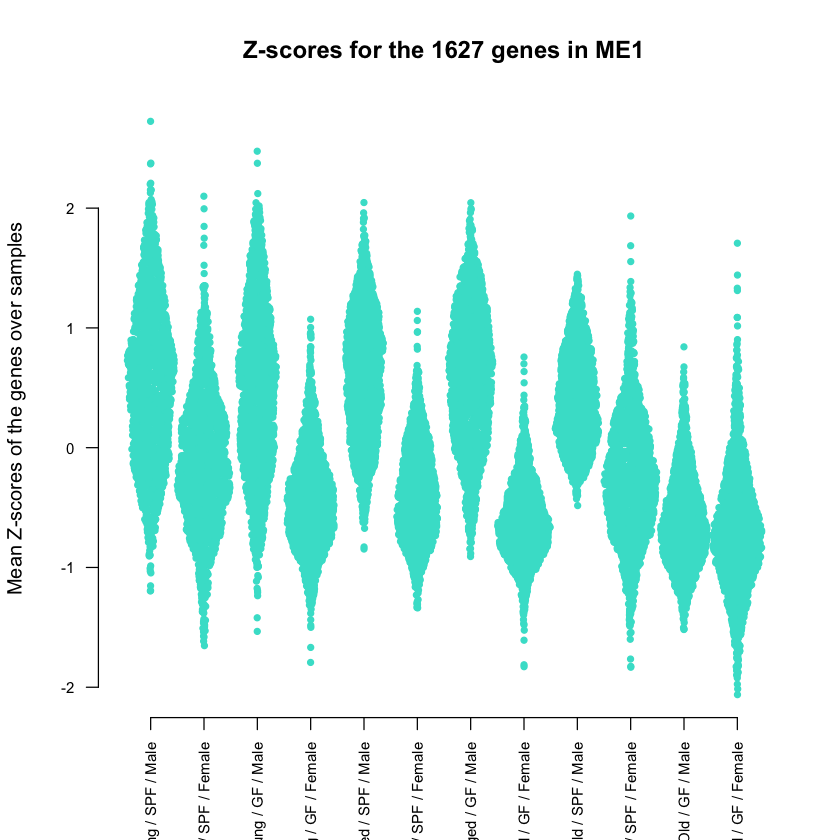

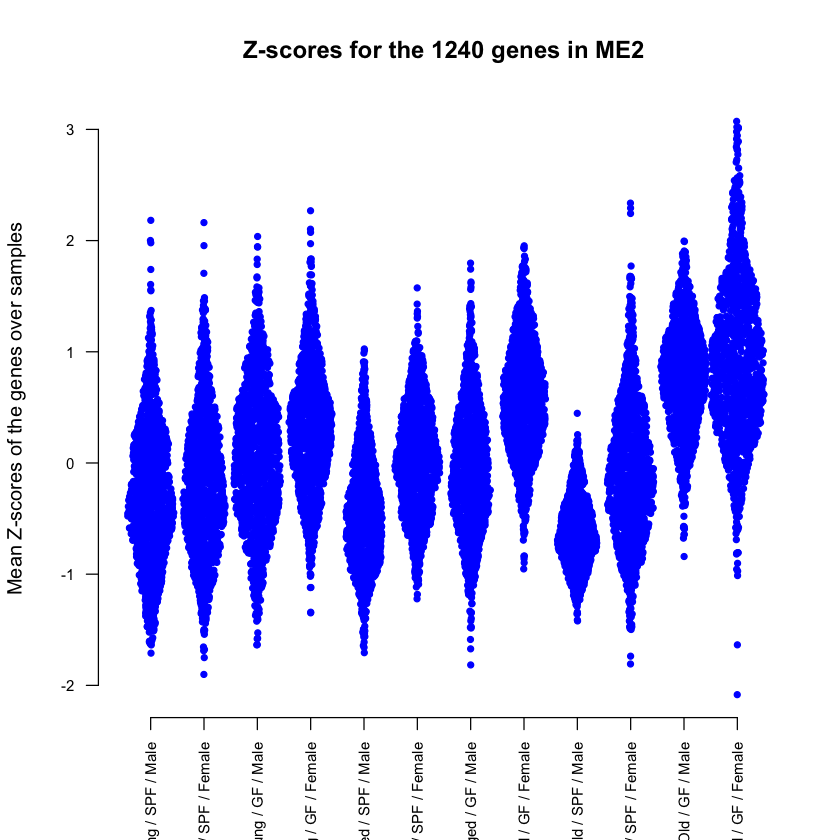

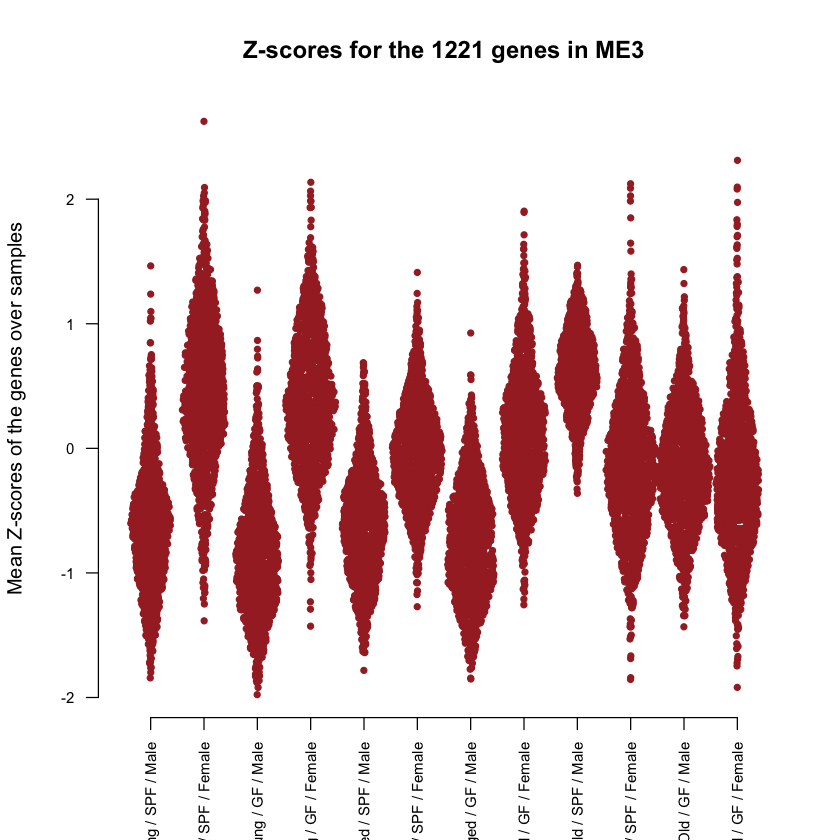

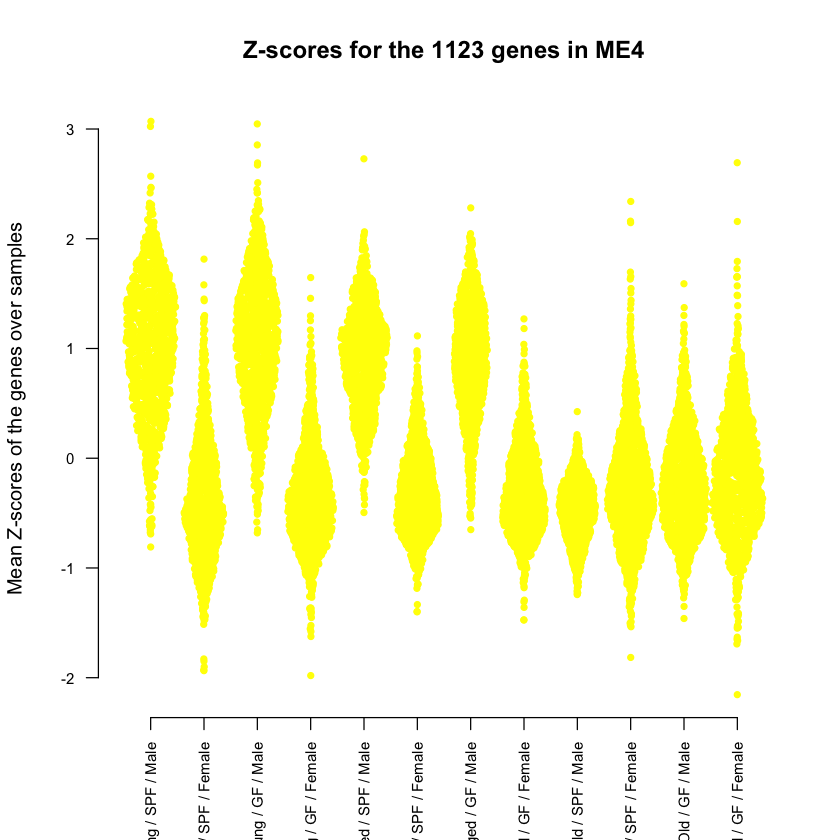

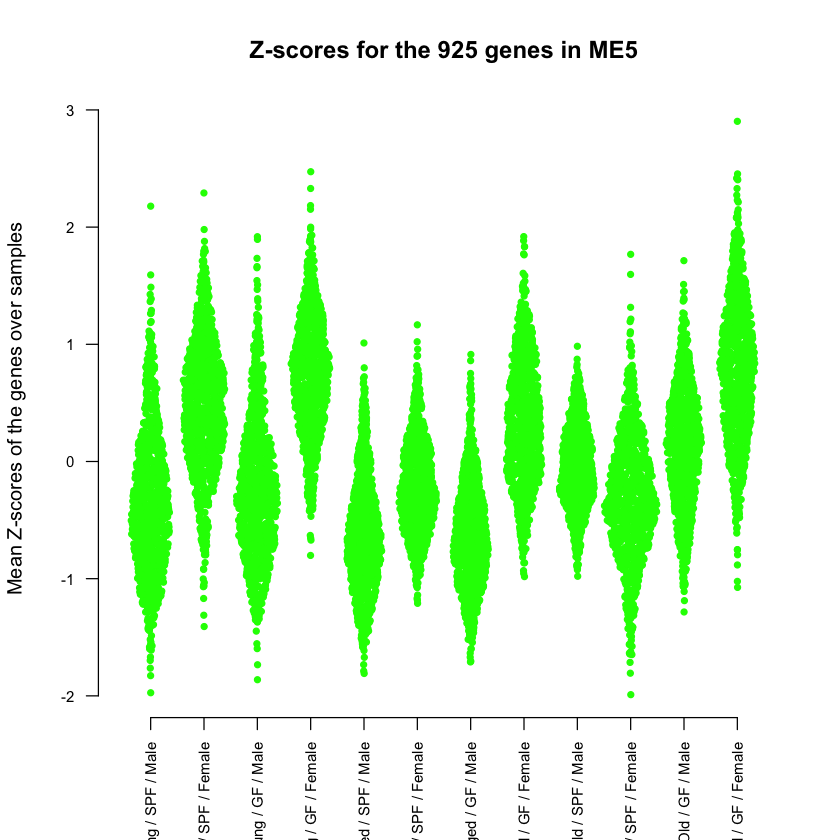

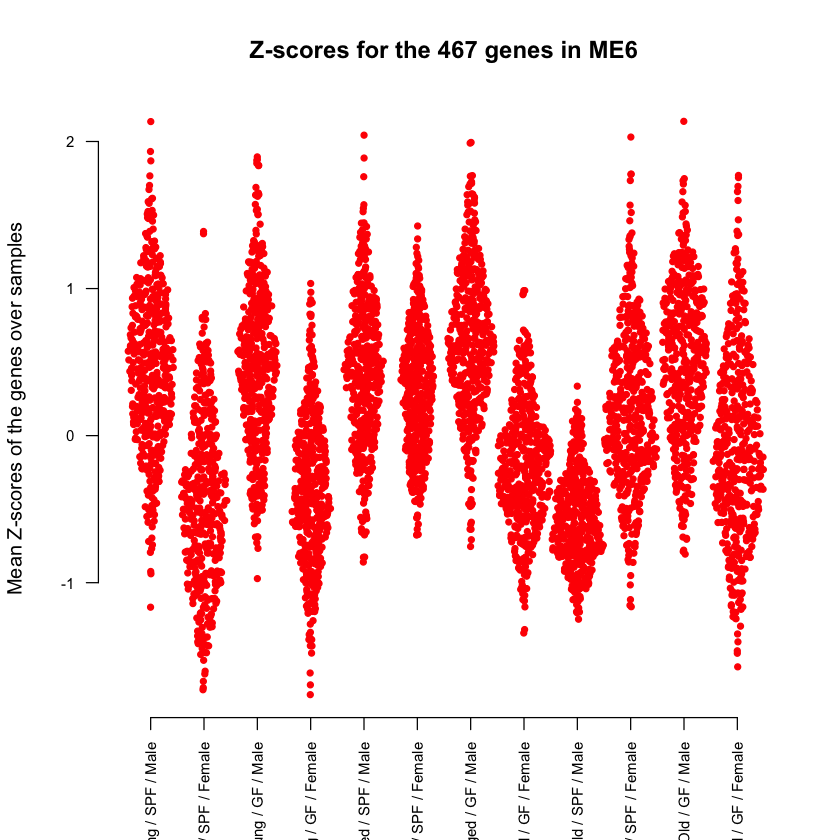

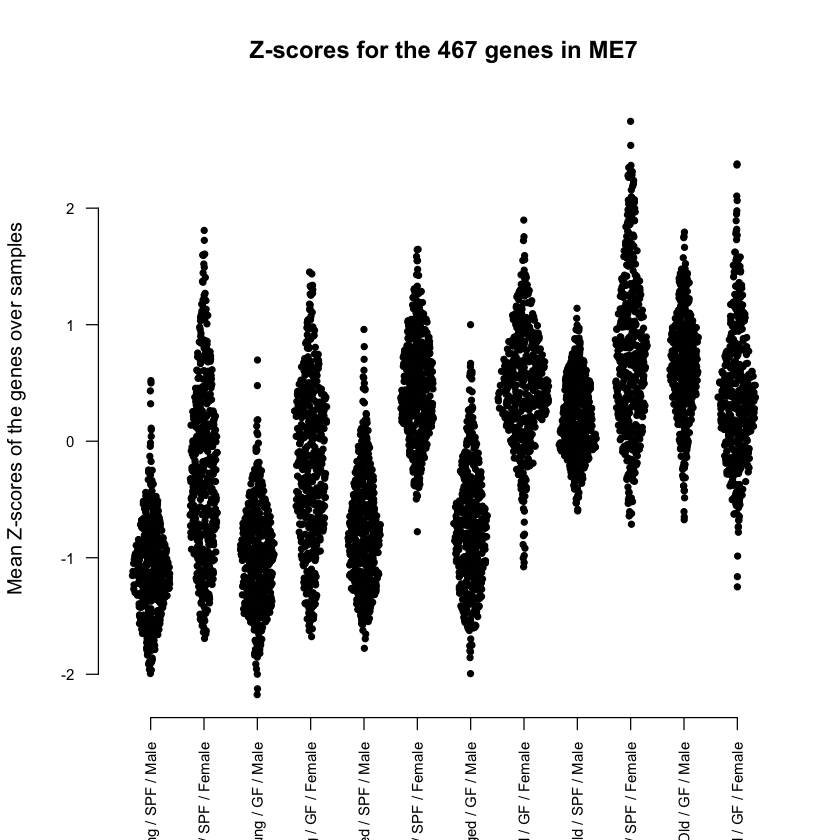

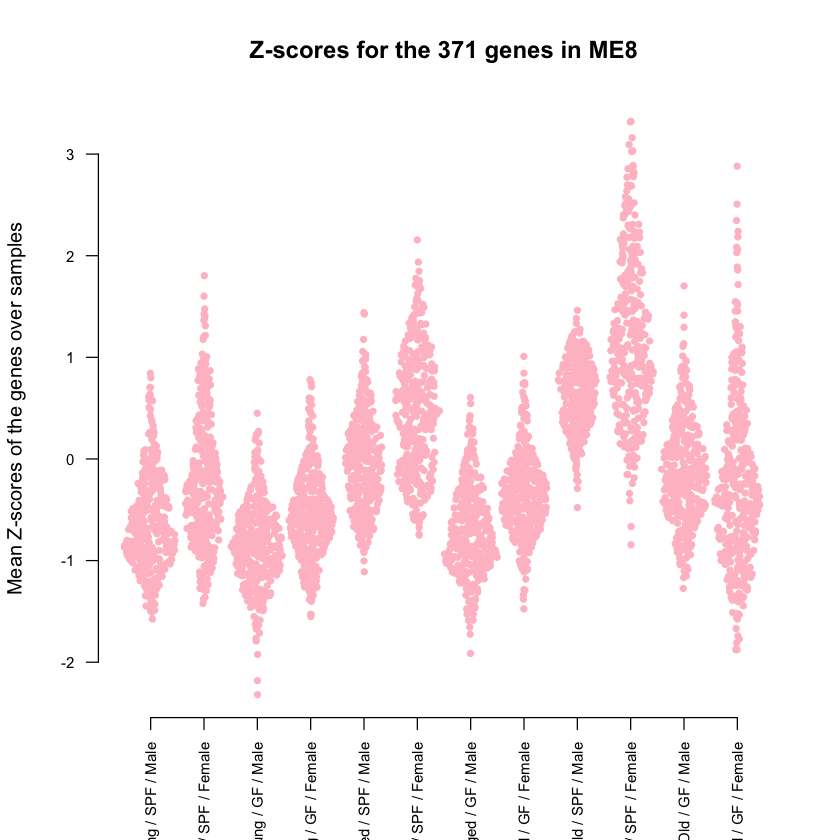

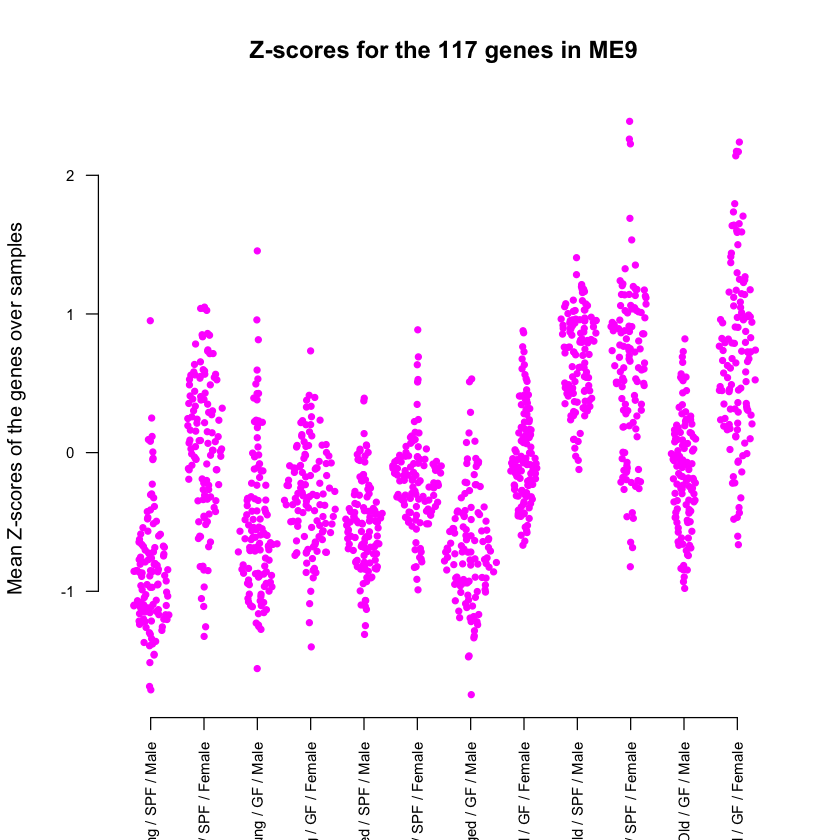

In [73]:
plot_z_score_sinaplot('Age / Microbiota / Sex', trait, z_scores, module_nb, genes_in_modules, pdf = TRUE)

## Enrichment analysis in modules

In [74]:
x = names(mod_sizes)[1]
pwf = suppressMessages(nullp(genes_in_modules_bool[, x], 'mm10', 'geneSymbol', plot.fit=F)) 

Warning message in grep(txdbPattern, installedPackages):
“Argument 'pattern' hat einen Länge > 1 und nur das erste Element wird benutzt”
Warning message in pcls(G):
“initial point very close to some inequality constraints”


In [75]:
for(x in names(mod_sizes)){
    print(x)
    pwf = suppressMessages(nullp(genes_in_modules_bool[, x], 'mm10', 'geneSymbol', plot.fit=F))                        
    GO_wall = goseq(pwf, 'mm10', 'geneSymbol')
    adj_GO_wall = GO_wall[p.adjust(GO_wall[,"over_represented_pvalue"], method="BH")<.05,]
    print(head(adj_GO_wall[adj_GO_wall$ontology == "BP",]))
    write.table(adj_GO_wall, paste("../results/dge/modules/", x, "_GO", sep=""), sep = "\t", quote = FALSE, row.names = FALSE)    
}

[1] "ME0"


Warning message in grep(txdbPattern, installedPackages):
“Argument 'pattern' hat einen Länge > 1 und nur das erste Element wird benutzt”
Warning message in pcls(G):
“initial point very close to some inequality constraints”
Fetching GO annotations...

For 457 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

'select()' returned 1:1 mapping between keys and columns



[1] category                 over_represented_pvalue  under_represented_pvalue
[4] numDEInCat               numInCat                 term                    
[7] ontology                
<0 rows> (or 0-length row.names)
[1] "ME1"


Warning message in grep(txdbPattern, installedPackages):
“Argument 'pattern' hat einen Länge > 1 und nur das erste Element wird benutzt”
Warning message in pcls(G):
“initial point very close to some inequality constraints”
Fetching GO annotations...

For 457 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

'select()' returned 1:1 mapping between keys and columns



        category over_represented_pvalue under_represented_pvalue numDEInCat
12198 GO:0051252            2.943568e-08                1.0000000        375
5728  GO:0019219            8.772034e-08                1.0000000        407
4211  GO:0010468            4.005749e-06                0.9999972        435
19201 GO:2001141            4.552126e-06                0.9999969        334
2709  GO:0006357            4.725335e-06                0.9999970        239
2690  GO:0006325            4.730346e-06                0.9999975        118
      numInCat                                                           term
12198     1851                            regulation of RNA metabolic process
5728      2064 regulation of nucleobase-containing compound metabolic process
4211      2268                                  regulation of gene expression
19201     1678                         regulation of RNA biosynthetic process
2709      1137               regulation of transcription by RNA polymer

Warning message in grep(txdbPattern, installedPackages):
“Argument 'pattern' hat einen Länge > 1 und nur das erste Element wird benutzt”
Fetching GO annotations...

For 457 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

'select()' returned 1:1 mapping between keys and columns



        category over_represented_pvalue under_represented_pvalue numDEInCat
3797  GO:0009056            1.212618e-07                1.0000000        244
10188 GO:0044281            2.289672e-07                1.0000000        186
16722 GO:1901575            9.846404e-07                0.9999996        208
10189 GO:0044282            1.186228e-06                0.9999995         50
4121  GO:0009987            1.848872e-06                0.9999992       1007
10190 GO:0044283            2.921496e-06                0.9999987         82
      numInCat                                term ontology
3797      1498                   catabolic process       BP
10188     1035    small molecule metabolic process       BP
16722     1255 organic substance catabolic process       BP
10189      193    small molecule catabolic process       BP
4121      7741                    cellular process       BP
10190      388 small molecule biosynthetic process       BP
[1] "ME3"


Warning message in grep(txdbPattern, installedPackages):
“Argument 'pattern' hat einen Länge > 1 und nur das erste Element wird benutzt”
Fetching GO annotations...

For 457 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

'select()' returned 1:1 mapping between keys and columns



        category over_represented_pvalue under_represented_pvalue numDEInCat
11032 GO:0046467            1.250597e-07                1.0000000         27
2917  GO:0006643            1.787155e-07                0.9999999         34
3715  GO:0008610            9.771757e-07                0.9999997         68
16592 GO:1901135            3.005576e-06                0.9999985        116
9115  GO:0036503            4.260514e-06                0.9999988         26
10175 GO:0044255            5.456001e-06                0.9999972         97
      numInCat                                      term ontology
11032       77       membrane lipid biosynthetic process       BP
2917       112          membrane lipid metabolic process       BP
3715       318                lipid biosynthetic process       BP
16592      645 carbohydrate derivative metabolic process       BP
9115        85                              ERAD pathway       BP
10175      522          cellular lipid metabolic process       BP

Warning message in grep(txdbPattern, installedPackages):
“Argument 'pattern' hat einen Länge > 1 und nur das erste Element wird benutzt”
Warning message in pcls(G):
“initial point very close to some inequality constraints”
Fetching GO annotations...

For 457 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

'select()' returned 1:1 mapping between keys and columns



        category over_represented_pvalue under_represented_pvalue numDEInCat
15235 GO:0090304            6.371645e-11                        1        396
12198 GO:0051252            1.294798e-09                        1        274
5728  GO:0019219            2.728583e-09                        1        298
5024  GO:0016070            8.392309e-09                        1        342
15662 GO:0097659            8.144464e-08                        1        252
17430 GO:1903506            1.033589e-07                        1        242
      numInCat                                                           term
15235     2827                                 nucleic acid metabolic process
12198     1851                            regulation of RNA metabolic process
5728      2064 regulation of nucleobase-containing compound metabolic process
5024      2465                                          RNA metabolic process
15662     1750                           nucleic acid-templated transcr

Warning message in grep(txdbPattern, installedPackages):
“Argument 'pattern' hat einen Länge > 1 und nur das erste Element wird benutzt”
Fetching GO annotations...

For 457 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

'select()' returned 1:1 mapping between keys and columns



       category over_represented_pvalue under_represented_pvalue numDEInCat
7834 GO:0033108            7.093682e-22                        1         45
3140 GO:0007005            3.358951e-17                        1         93
2593 GO:0006119            4.614537e-16                        1         39
4168 GO:0010257            5.894940e-16                        1         29
7771 GO:0032981            5.894940e-16                        1         29
9608 GO:0042775            1.942165e-14                        1         30
     numInCat                                                   term ontology
7834       71       mitochondrial respiratory chain complex assembly       BP
3140      366                             mitochondrion organization       BP
2593       73                              oxidative phosphorylation       BP
4168       41                    NADH dehydrogenase complex assembly       BP
7771       41     mitochondrial respiratory chain complex I assembly       BP


Warning message in grep(txdbPattern, installedPackages):
“Argument 'pattern' hat einen Länge > 1 und nur das erste Element wird benutzt”
Warning message in pcls(G):
“initial point very close to some inequality constraints”
Fetching GO annotations...

For 457 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

'select()' returned 1:1 mapping between keys and columns



        category over_represented_pvalue under_represented_pvalue numDEInCat
11916 GO:0050794            5.418879e-13                        1        309
11912 GO:0050789            4.471718e-12                        1        319
13695 GO:0065007            3.343041e-11                        1        328
11576 GO:0048523            8.665791e-10                        1        181
11572 GO:0048519            4.240235e-09                        1        193
11730 GO:0048856            9.663231e-09                        1        183
      numInCat                                      term ontology
11916     5033            regulation of cellular process       BP
11912     5331          regulation of biological process       BP
13695     5605                     biological regulation       BP
11576     2633   negative regulation of cellular process       BP
11572     2922 negative regulation of biological process       BP
11730     2737          anatomical structure development       BP

Warning message in grep(txdbPattern, installedPackages):
“Argument 'pattern' hat einen Länge > 1 und nur das erste Element wird benutzt”
Fetching GO annotations...

For 457 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

'select()' returned 1:1 mapping between keys and columns



        category over_represented_pvalue under_represented_pvalue numDEInCat
16592 GO:1901135            1.659041e-09                1.0000000         65
2501  GO:0005975            3.360882e-09                1.0000000         42
9520  GO:0042592            2.331070e-07                1.0000000         80
5016  GO:0016052            5.638349e-07                0.9999999         18
3026  GO:0006811            1.154641e-06                0.9999996         58
11920 GO:0050801            1.375911e-06                0.9999995         38
      numInCat                                      term ontology
16592      645 carbohydrate derivative metabolic process       BP
2501       339            carbohydrate metabolic process       BP
9520       991                       homeostatic process       BP
5016        98            carbohydrate catabolic process       BP
3026       659                             ion transport       BP
11920      358                           ion homeostasis       BP

Warning message in grep(txdbPattern, installedPackages):
“Argument 'pattern' hat einen Länge > 1 und nur das erste Element wird benutzt”
Warning message in pcls(G):
“initial point very close to some inequality constraints”
Fetching GO annotations...

For 457 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

'select()' returned 1:1 mapping between keys and columns



        category over_represented_pvalue under_represented_pvalue numDEInCat
3114  GO:0006955            3.693197e-25                        1         88
3111  GO:0006952            1.425183e-24                        1         88
9794  GO:0043207            2.234279e-24                        1         68
12427 GO:0051707            2.234279e-24                        1         68
924   GO:0002376            1.193141e-23                        1        119
4026  GO:0009605            2.877849e-23                        1        105
      numInCat                                 term ontology
3114       720                      immune response       BP
3111       729                     defense response       BP
9794       455 response to external biotic stimulus       BP
12427      455           response to other organism       BP
924       1281                immune system process       BP
4026      1040        response to external stimulus       BP
[1] "ME9"


Warning message in grep(txdbPattern, installedPackages):
“Argument 'pattern' hat einen Länge > 1 und nur das erste Element wird benutzt”
Fetching GO annotations...

For 457 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

'select()' returned 1:1 mapping between keys and columns



        category over_represented_pvalue under_represented_pvalue numDEInCat
2747  GO:0006412            1.276787e-28                        1         48
9712  GO:0043043            2.865183e-28                        1         48
10018 GO:0043604            5.822921e-26                        1         48
2820  GO:0006518            2.080278e-25                        1         48
10017 GO:0043603            6.664154e-23                        1         49
16716 GO:1901566            2.686817e-17                        1         51
      numInCat                                         term ontology
2747       480                                  translation       BP
9712       490                 peptide biosynthetic process       BP
10018      558                   amide biosynthetic process       BP
2820       580                    peptide metabolic process       BP
10017      713             cellular amide metabolic process       BP
16716     1111 organonitrogen compound biosynth

# Citations

In [76]:
citation("WGCNA")


To cite WGCNA in publications use:

  Langfelder P and Horvath S, WGCNA: an R package for weighted
  correlation network analysis. BMC Bioinformatics 2008, 9:559
  doi:10.1186/1471-2105-9-559

  Peter Langfelder, Steve Horvath (2012). Fast R Functions for Robust
  Correlations and Hierarchical Clustering. Journal of Statistical
  Software, 46(11), 1-17. URL http://www.jstatsoft.org/v46/i11/.

We have invested a lot of time and effort in creating the package,
please cite it when using it for data analysis.
To see these entries in BibTeX format, use 'print(<citation>,
bibtex=TRUE)', 'toBibtex(.)', or set
'options(citation.bibtex.max=999)'.


In [77]:
citation("sinaplot")
toBibtex(citation("sinaplot"))


To cite sinaplot in publications, please use:

  Sidiropoulos. N, Sohi S.H., Rapin N., Bagger F.O. (2017). An Enhanced
  Chart for Simple and Truthful Representation of Single Observations
  over Multiple Classes, R package version 1.1.0.

  Sidiropoulos. N, Sohi S.H., Rapin N., Bagger F.O., SinaPlot: an
  enhanced chart for simple and truthful representation of single
  observations over multiple classes. bioRxiv doi:
  http://dx.doi.org/10.1101/028191

To see these entries in BibTeX format, use 'print(<citation>,
bibtex=TRUE)', 'toBibtex(.)', or set
'options(citation.bibtex.max=999)'.


@Manual{,
  title = {An Enhanced Chart for Simple and Truthful Representation of
Single Observations over Multiple Classes},
  author = {Sidiropoulos N. and Sohi S.H. and Rapin N. and Bagger F.O.},
  publisher = {manual},
  year = {2017},
  note = {R package version 1.1.0},
  url = {https://cran.r-project.org/package=sinaplot},
}

@TechReport{,
  title = {SinaPlot: an enhanced chart for simple and truthful representation of single observations over multiple classes},
  author = {Nikos Sidiropoulos and Sina Hadi Sohi and Nicolas Rapin and Frederik Otzen Bagger},
  booktitle = {bioRxiv},
  institution = {Cold Spring Harbor Labs Journals},
  year = {2015},
  month = {Oct},
  doi = {10.1101/028191},
  url = {http://biorxiv.org/content/early/2015/10/02/028191.abstract},
}

In [78]:
citation("goseq")


The methods within the code package can be cited as:

  Young, M.D., Wakefield, M.J., Smyth, G.K., Oshlack, A., Gene ontology
  analysis for RNA-seq: accounting for selection bias, Genome Biology,
  11, 2, Feb 2010, R14

A BibTeX entry for LaTeX users is

  @Article{,
    title = {Gene ontology analysis for RNA-seq: accounting for selection bias},
    author = {Matthew D Young and Matthew J Wakefield and Gordon K Smyth and Alicia Oshlack},
    journal = {Genome Biology},
    volume = {11},
    pages = {R14},
    year = {2010},
  }

This free open-source software implements academic research by the
authors and co-workers. If you use it, please support the project by
citing the appropriate journal articles.


In [79]:
citation("org.Mm.eg.db")

Warning message in citation("org.Mm.eg.db"):
“no date field in DESCRIPTION file of package ‘org.Mm.eg.db’”



To cite package ‘org.Mm.eg.db’ in publications use:

  Marc Carlson (2019). org.Mm.eg.db: Genome wide annotation for Mouse.
  R package version 3.10.0.

A BibTeX entry for LaTeX users is

  @Manual{,
    title = {org.Mm.eg.db: Genome wide annotation for Mouse},
    author = {Marc Carlson},
    year = {2019},
    note = {R package version 3.10.0},
  }

ATTENTION: This citation information has been auto-generated from the
package DESCRIPTION file and may need manual editing, see
‘help("citation")’.
